# Goal of this project

The goal of this project is to construct machine learning models that help one to predict whether a given subscriber
of the weekly German newspaper 'Die Zeit' is likely to 'churn' (i.e. to cancel his or her subscription) soon. Analyses 
of this kind are generally referred to as 'churn prediction'.

The basis of the analysis is a data set from 'Die Zeit' that collects 171 features for more than 209 000 
subscribers from Germany and abroad.

More precisely, the data set only contains information about those subscriptions that were still active in May 2019
and whose starting dates fall into the period 2013 - 2019.

Moreover, the data set only covers subscription cancellations that occured in the reference period from June 2019 to May 2020.


## Import packages and read data

In [236]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import folium
from folium.plugins import MarkerCluster



from sklearn.model_selection import train_test_split
from sklearn.preprocessing import power_transform
from sklearn.preprocessing import OneHotEncoder, StandardScaler
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import MinMaxScaler
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.tree import DecisionTreeClassifier
from sklearn.svm import SVC
from sklearn.ensemble import AdaBoostClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import confusion_matrix
from sklearn.metrics import precision_score
from sklearn.metrics import recall_score
from sklearn.metrics import accuracy_score
from sklearn.metrics import roc_curve
from sklearn.metrics import roc_auc_score
from sklearn.metrics import make_scorer
from sklearn.metrics import fbeta_score
from sklearn.metrics import precision_recall_curve
from sklearn.metrics import plot_precision_recall_curve
from sklearn.metrics import average_precision_score
from sklearn.metrics import f1_score

from sklearn import metrics
from sklearn.metrics import classification_report
from sklearn.model_selection import GridSearchCV, RandomizedSearchCV
from sklearn.model_selection import cross_val_predict, cross_val_score, cross_validate



In [237]:
df = pd.read_csv("f_chtr_churn_traintable_nf_v2.csv")
df.shape

(209043, 171)

In [238]:
df.head()

,Unnamed: 0,auftrag_new_id,liefer_beginn_evt,kanal,objekt_name,aboform_name,zahlung_rhythmus_name,lesedauer,rechnungsmonat,zahlung_weg_name,...,openrate_zeitbrief_1w,clickrate_zeitbrief_1w,openrate_zeitbrief_1m,clickrate_zeitbrief_1m,openrate_zeitbrief_3m,clickrate_zeitbrief_3m,training_set,kuendigungs_eingangs_datum,churn,date_x
0,0,6BE5B590-07EA-4543-B422-F7ABB2AF9464,2013-10-02,andere,ZEIT Digital,Probeabo,jährlich,68,0,Bankeinzug,...,0.5,0.0,1.00,0.0,0.93,0.0,1,NaN,0,2019-06-18 00:00:00
1,1,2271CE79-EAC2-42EE-9702-BF5CCCF4E1BE,2013-10-02,andere,ZEIT Digital,Probeabo,jährlich,68,0,Bankeinzug,...,0.5,0.0,1.00,0.0,0.93,0.0,1,NaN,0,2019-06-18 00:00:00
2,2,43F172A6-6286-4EEC-874E-50C661BC1A88,2013-10-02,andere,ZEIT Digital,Probeabo,jährlich,68,0,Bankeinzug,...,0.5,0.0,1.00,0.0,0.93,0.0,1,NaN,0,2019-06-18 00:00:00
3,3,25B535B7-D3F9-4804-9FFE-A8C813C8A593,2013-10-17,andere,ZEIT Digital,Festabo,jährlich,72,0,Bankeinzug,...,1.0,0.0,0.67,0.0,0.36,0.0,1,NaN,0,2019-10-02 00:00:00
4,4,C348C873-8229-4F4F-8B50-5B4C06B2E872,2013-09-12,andere,ZEIT Digital,Festabo,vierteljährlich,70,0,Bankeinzug,...,0.0,0.0,0.00,0.0,0.00,0.0,1,NaN,0,2019-07-30 00:00:00


In [239]:
df.tail()

,Unnamed: 0,auftrag_new_id,liefer_beginn_evt,kanal,objekt_name,aboform_name,zahlung_rhythmus_name,lesedauer,rechnungsmonat,zahlung_weg_name,...,openrate_zeitbrief_1w,clickrate_zeitbrief_1w,openrate_zeitbrief_1m,clickrate_zeitbrief_1m,openrate_zeitbrief_3m,clickrate_zeitbrief_3m,training_set,kuendigungs_eingangs_datum,churn,date_x
209038,209038,41E28315-3C65-4C25-A2A1-E1F3C68E9E37,2019-03-28,andere,DIE ZEIT,Negative Option,halbjährlich,9,0,Rechnung,...,0.0,0.0,0.0,0.0,0.07,0.00,1,NaN,0,2019-12-15 00:00:00
209039,209039,E70772DB-961D-4BCA-ABEE-B93583A6B6B3,2019-04-11,Fremdwerbung,DIE ZEIT,Geschenkabo,jährlich,10,0,Rechnung,...,0.0,0.0,0.0,0.0,0.00,0.00,1,2020-02-27,1,2020-02-27 00:00:00
209040,209040,55E5970A-B886-49D8-86CD-25BB0B68785C,2019-03-28,andere,DIE ZEIT,Negative Option,halbjährlich,6,1,Bankeinzug,...,0.0,0.0,0.0,0.0,0.00,0.00,1,NaN,0,2019-09-23 00:00:00
209041,209041,3FC202C2-7A79-4D87-B8FE-E4337C341975,2019-02-28,Mailings,DIE ZEIT,Festabo,jährlich,14,0,Rechnung,...,0.0,0.0,0.2,0.0,0.50,0.00,1,NaN,0,2020-04-28 00:00:00
209042,209042,46A87B9A-2B53-4303-A401-33E3F3E622CA,2019-03-28,andere,DIE ZEIT,Negative Option,halbjährlich,7,0,Rechnung,...,1.0,1.0,1.0,0.2,0.86,0.08,1,2019-10-28,1,2019-10-28 00:00:00


## The features and their meaning

The complete original list of features:
    

In [240]:
df.columns.values

array(['Unnamed: 0', 'auftrag_new_id', 'liefer_beginn_evt', 'kanal',
       'objekt_name', 'aboform_name', 'zahlung_rhythmus_name',
       'lesedauer', 'rechnungsmonat', 'zahlung_weg_name', 'studentenabo',
       'plz_1', 'plz_2', 'plz_3', 'ort', 'metropole', 'land_iso_code',
       'shop_kauf', 'unterbrechung', 'anrede', 'titel', 'avg_churn',
       'email_am_kunden', 'zon_che_opt_in', 'zon_sit_opt_in',
       'zon_zp_grey', 'zon_premium', 'zon_boa', 'zon_kommentar',
       'zon_sonstige', 'zon_zp_red', 'zon_rawr', 'zon_community',
       'zon_app_sonstige', 'zon_schach', 'zon_blog_kommentare',
       'zon_quiz', 'cnt_abo', 'cnt_abo_diezeit',
       'cnt_abo_diezeit_digital', 'cnt_abo_magazin',
       'cnt_umwandlungsstatus2_dkey', 'abo_registrierung_min',
       'nl_zeitbrief', 'nl_zeitshop', 'nl_zeitverlag_hamburg',
       'nl_fdz_organisch', 'nl_blacklist_sum', 'nl_bounced_sum',
       'nl_aktivitaet', 'nl_registrierung_min', 'nl_sperrliste_sum',
       'nl_opt_in_sum', 'boa_reg', 

The 171 features can be divided into the following subgroups:
    
**General subscription information**
       
       * kanal
       * objekt_name 
       * aboform_name
       * zahlung_rhythmus_name
       * rechnungsmonat
       * zahlung_weg_name 
       * studentenabo
       * unterbrechung

**Subscription options**
    
       * zon_che,_opt_in
       * zon_sit_opt_in
       * zon_zp_grey
       * zon_premium
       * zon_boa
       * zon_kommentar
       * zon_sonstige
       * zon_zp_red
       * zon_app_sonstige
       * zon_rawr 
       * zon_community 
       * zon_schach 
       * zon_blog_kommentare 
       * zon_quiz 
       * nl_fdz_organisch 
       * cnt_abo
       * cnt_abo_diezeit
       * cnt_abo_diezeit_digital
       * cnt_abo_magazin
       * cnt_umwandlungsstatus2_dkey  
       * nl_zeitbrief
       * nl_zeitshop
       * nl_zeitverlag_hamburg
       * nl_opt_in_sum



**Personal information**
    
       * anrede
       * titel

    
**Temporal features**
    
       * lesedauer
       * liefer_beginn_evt
       * abo_registrierung_min
       * nl_registrierung_min


    
**Geographical features**
    
    
       * plz_1
       * plz_2
       * plz_3
       * ort
       * metropole
       * land_iso_code

    
**Communication and activity features**
    
    
       * shop_kauf
       * email_am_kunden
       * nl_blacklist_sum
       * nl_bounced_sum
       * nl_aktivitaet
       * nl_sperrliste_sum

       * received_anzahl(_A)_B
       * opened_anzahl(_A)_B
       * clicked_anzahl(_A)_B
       * unsubscribed_anzahl(_A)_B
       * openrate(_A)_C
       * clickrate(_A)_C
      
      with A = bestandskunden, productnews, hamburg, zeitbrief
           B = 1w, 1m, 3m, 6m
           C = 1w, 1m, 3m
  
  
**Trivial or irrelevant features**
     
       * Unnamed: 0 
       * auftrag_new_id
       * training_set (is one for every instance)
    
    
    
**Churn-related features**
       
       * avg_churn (an aggregate estimate of the churn probability based on lesedauer und zahlung_rhythmus_name)
       * kuendigungs_eingangs_datum 
       * date_x (the date of subscription cancellation (for those with churn =1) or a random date in the considered    
                 period (for those with churn =0)
       * churn (0: no churn, 1: churn, our target variable!)

A detailed description key is given elsewhere.

# Data cleaning

## Make cut-off for number of subscriptions per subscriber

The original data set contains many subscribers with very high numbers of subscriptions (up to 7000 subscriptions per subscriber). We limit ourselves to subscribers with at most four subscriptions (corresponding to cnt_abo <4, because cnt_abo counts additional subscriptions):

In [241]:
df2=df[df.cnt_abo < 4]
df2.shape

(175130, 171)

In [242]:
df2.cnt_abo.value_counts()

0    86301
1    45199
2    27536
3    16094
Name: cnt_abo, dtype: int64

## Missing values


The following variables have missing values:
    
    * ort
    * email_am_kunden
    * kuendigungs_eingangs_datum



In [243]:
# Checking for missing values
missing = pd.DataFrame(df2.isnull().sum(), columns=["Amount"])
missing['Percentage'] = round((missing['Amount']/df2.shape[0])*100, 2)
missing[missing['Amount'] != 0]

,Amount,Percentage
ort,85,0.05
email_am_kunden,12,0.01
kuendigungs_eingangs_datum,122166,69.76


Only kuendigungs_eingangs_datum is irrelevant for model building, because it would tell us who would churn. 
kuendigungs_eingangs_datum might be interesting for EDA. In any case, there is no need to replace missing 
values for that variable as we will later drop it for model building. ort and email_am_kunden have very few missing values, so we can simply drop the 
corresponding rows.    

In [244]:
df2 = df2.dropna(subset=['ort','email_am_kunden'])
df2=df2.reset_index()
df2.head()

,index,Unnamed: 0,auftrag_new_id,liefer_beginn_evt,kanal,objekt_name,aboform_name,zahlung_rhythmus_name,lesedauer,rechnungsmonat,...,openrate_zeitbrief_1w,clickrate_zeitbrief_1w,openrate_zeitbrief_1m,clickrate_zeitbrief_1m,openrate_zeitbrief_3m,clickrate_zeitbrief_3m,training_set,kuendigungs_eingangs_datum,churn,date_x
0,3,3,25B535B7-D3F9-4804-9FFE-A8C813C8A593,2013-10-17,andere,ZEIT Digital,Festabo,jährlich,72,0,...,1.0,0.0,0.67,0.0,0.36,0.0,1,NaN,0,2019-10-02 00:00:00
1,4,4,C348C873-8229-4F4F-8B50-5B4C06B2E872,2013-09-12,andere,ZEIT Digital,Festabo,vierteljährlich,70,0,...,0.0,0.0,0.00,0.0,0.00,0.0,1,NaN,0,2019-07-30 00:00:00
2,5,5,15FA7CDA-FDCE-4AB9-A427-0FF8B2D9940F,2013-11-14,andere,ZEIT Digital,Probeabo,jährlich,75,0,...,0.0,0.0,0.00,0.0,0.00,0.0,1,NaN,0,2020-02-26 00:00:00
3,6,6,894FAFB7-6D8C-43CC-82DB-246E0AD1F662,2013-11-14,andere,ZEIT Digital,Probeabo,jährlich,78,0,...,1.0,0.0,0.75,0.0,0.69,0.0,1,NaN,0,2020-05-18 00:00:00
4,7,7,1862C64E-3133-4AD0-B144-E7D8ED69772C,2014-01-02,andere,ZEIT Digital,Probeabo,jährlich,69,0,...,0.0,0.0,0.00,0.0,0.00,0.0,1,NaN,0,2019-10-31 00:00:00


Check that there are no more missing values except for kuendigungs_eingangs_datum:

In [245]:
df2.loc[:,df2.isnull().any()].columns

Index(['kuendigungs_eingangs_datum'], dtype='object')

The old index now appears as another irrelevant feature (index), which we will now drop together with a few other irrelevant or useless features.

## Dropping trivial or irrelevant variables

We drop the following variables:
    
    * index (no useful information)
    * Unnamed: 0 (no useful information)
    * auftrag_new_id (no useful information)
    * kuendigungs_eingangs_datum (would tell us who would churn, because those who don't churn have nan here)
    * training_set (no useful information)
    * date_x 
                                  
                                  
About date_x:

This reference date is equal to kuendigungs_eingangs_datum for those who churn and a random date 
in the reference period for those who don't. As we are not trying to predict this date, date_x can be at 
most a feature. But if it is a feature we would like to use in order to predict churn, we would have to 
know it before the churn actually happened, which we don't.

The only way this variable could possibly be useful could be for determining the seasonal variation 
of the churn rate so that in months with increased churn probability, models could assign a higher 
base churn probability to each subscriber, which might lift some subscribers over the critical threshold
of the predictor in that month. However, turning the month of date_x into a numerical feature in the usual way, 
leads to a variable with a very low correlation with churn.                                
                                  
                                  
                                  


In [246]:
df2['date_x_month']=df2['date_x'].str[5:7].astype('float')

In [247]:
df2['date_x_month'].value_counts()

1.0     15983
8.0     15519
10.0    15415
11.0    14966
7.0     14817
9.0     14581
12.0    14486
5.0     14228
6.0     14119
3.0     13888
2.0     13717
4.0     13326
Name: date_x_month, dtype: int64

In [248]:
corr_matrix = df2.corr()

In [249]:
corr_matrix['churn']['date_x_month']

0.019399926427099232

We thus also drop date_x (and date_x_month'):

In [250]:
drop=['index', 'Unnamed: 0', 'auftrag_new_id',
      'training_set','kuendigungs_eingangs_datum', 'date_x',
     'date_x_month']
df2=df2.drop(drop, axis=1)

In [251]:
df2.head()

,liefer_beginn_evt,kanal,objekt_name,aboform_name,zahlung_rhythmus_name,lesedauer,rechnungsmonat,zahlung_weg_name,studentenabo,plz_1,...,unsubscribed_anzahl_zeitbrief_1m,unsubscribed_anzahl_zeitbrief_3m,unsubscribed_anzahl_zeitbrief_6m,openrate_zeitbrief_1w,clickrate_zeitbrief_1w,openrate_zeitbrief_1m,clickrate_zeitbrief_1m,openrate_zeitbrief_3m,clickrate_zeitbrief_3m,churn
0,2013-10-17,andere,ZEIT Digital,Festabo,jährlich,72,0,Bankeinzug,0,5,...,0,0,0,1.0,0.0,0.67,0.0,0.36,0.0,0
1,2013-09-12,andere,ZEIT Digital,Festabo,vierteljährlich,70,0,Bankeinzug,0,xx,...,0,0,0,0.0,0.0,0.00,0.0,0.00,0.0,0
2,2013-11-14,andere,ZEIT Digital,Probeabo,jährlich,75,0,Bankeinzug,0,0,...,0,0,0,0.0,0.0,0.00,0.0,0.00,0.0,0
3,2013-11-14,andere,ZEIT Digital,Probeabo,jährlich,78,0,Rechnung,0,2,...,0,0,0,1.0,0.0,0.75,0.0,0.69,0.0,0
4,2014-01-02,andere,ZEIT Digital,Probeabo,jährlich,69,0,Bankeinzug,0,9,...,0,0,0,0.0,0.0,0.00,0.0,0.00,0.0,0


## Transforming temporal variables

For the EDA, we have to convert the remaining temporal variables that are not yet numbers to suitable numbers:

    * liefer_beginn_evt
    * abo_registrierung_min
    * nl_registrierung_min

liefer_beginn_evt contains year (starting 2013), month and day of earliest delivery. This variable shows a clear 
seasonal variation as well as a trend over the years both regarding the number of cases as well as regarding 
the churn probability. We will therefore transform this variable into a float variable that keeps track also of 
the months.

abo_registrierung_min and nl_registrierung_min, on the other hand, go further back into the past 
(1958 and 2001, respectively) so that seasonal effects become less important and the number of cases 
for a given year may easily become too small if one further differentiates according to the month or even the day.
Most importantly, however, these variables contain a special value (January 1, 1900), which is not to be taken as 
a real date value but due to some cutoff procedure. This value corresponds to higher churn probability, and contains
many cases. We therefore cannot drop it entirely, and neither can we treat these two variables as 
simple numerical variables. We therefore only keep the year of these two variables and will later convert these 
to dummy variables after some suitable binning.

In [252]:
df2['liefer_beginn_num']= df2['liefer_beginn_evt'].str[:4].astype('int')  +df2['liefer_beginn_evt'].str[5:7].astype('float')/12 #+ df2['liefer_beginn_evt'].str[8:10].astype('float')/365 
df2['abo_registrierung_min_year']= df2['abo_registrierung_min'].str[:4].astype('int')  
df2['nl_registrierung_min_year']= df2['nl_registrierung_min'].str[:4].astype('int') 

df2=df2.drop(['liefer_beginn_evt','abo_registrierung_min','nl_registrierung_min'
             ], axis=1)
df2[['liefer_beginn_num', 'abo_registrierung_min_year', 'nl_registrierung_min_year'
    ]].head()


,liefer_beginn_num,abo_registrierung_min_year,nl_registrierung_min_year
0,2013.833333,2013,2013
1,2013.750000,1900,2013
2,2013.916667,2013,2013
3,2013.916667,2013,2013
4,2014.083333,2013,2008


# Exploratory data analysis

In the following, we will plot the churn probability by value of selected features. To this end, 
we introduce a dummy variable for the two possible churn values 0 and 1 to facilitate the counting. As we will use this only for EDA, we will
define a new data frame df_a. df2 will later be used for model building again. 

In [155]:

dummy0 = pd.get_dummies(df2['churn'],prefix='churn')

In [156]:

df_a = pd.concat([df2,dummy0], axis =1)

We first determine the overall churn probability in the entire data set:

In [158]:
df_a['churn_1'].sum()/(df_a['churn_1'].sum() + df_a['churn_0'].sum())

0.30223656773972407

The total churn probability in the entire dataset is thus:

**30.2%**

## General subscription and personal information

We first study the general subscription and personal features: 
    
       * kanal
       * objekt_name 
       * aboform_name
       * zahlung_rhythmus_name
       * rechnungsmonat
       * zahlung_weg_name 
       * studentenabo
       * unterbrechung
       * anrede
       * titel

### Histograms

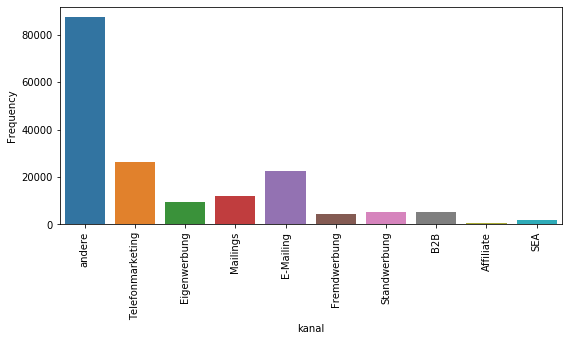

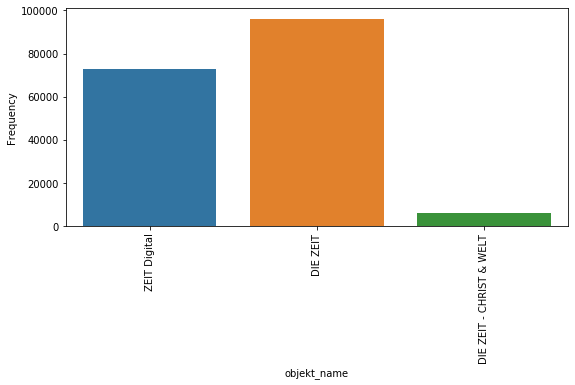

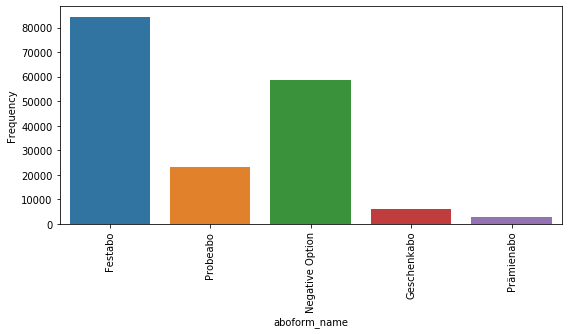

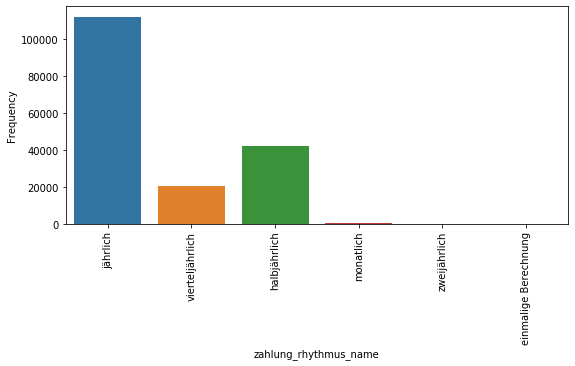

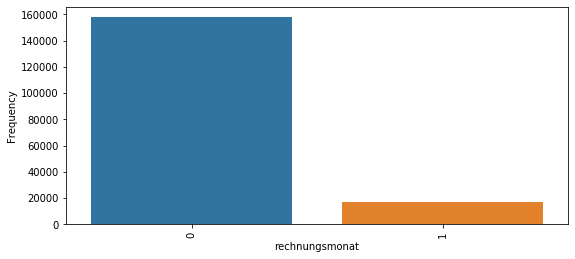

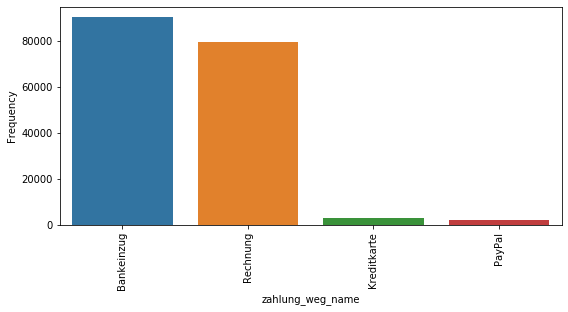

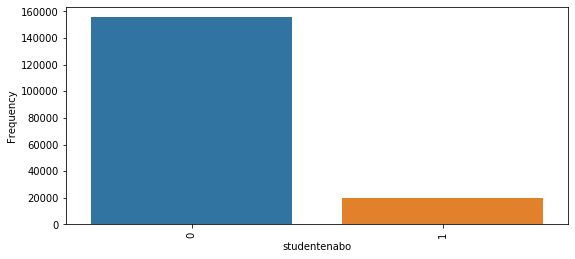

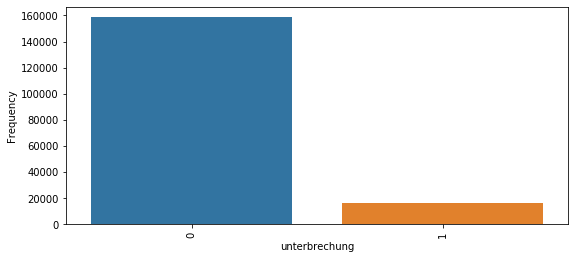

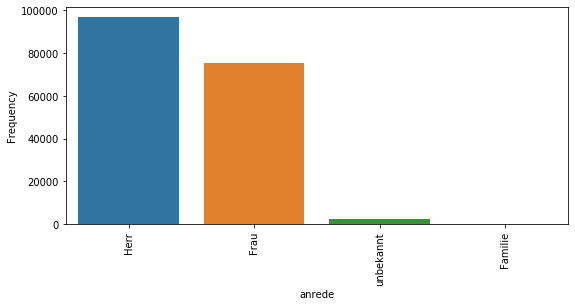

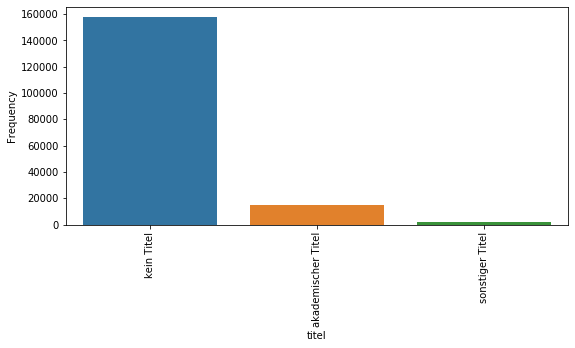

In [159]:
for i in ['kanal', 'objekt_name', 'aboform_name', 'zahlung_rhythmus_name', 'rechnungsmonat', 
                   'zahlung_weg_name', 'studentenabo', 'unterbrechung',
   'anrede', 'titel']:

    
    #ax = sns.countplot(x=i, data=df_a)
    
    plt.subplots(figsize=(9,4))
    ax = sns.countplot(x=i, data=df_a)
    ax.set(xlabel=i, ylabel='Frequency')

    ax.set_xticklabels(ax.get_xticklabels(), rotation=90)

### Churn probability by subgroup

For the above variables, we plot the churn probability for each sub-category. The churn probability is the number 
of subscribers with churn =1 divided by the number of subscribers with churn = 0 or churn =1 (i.e. divided by all subscribers) in each sub-category.

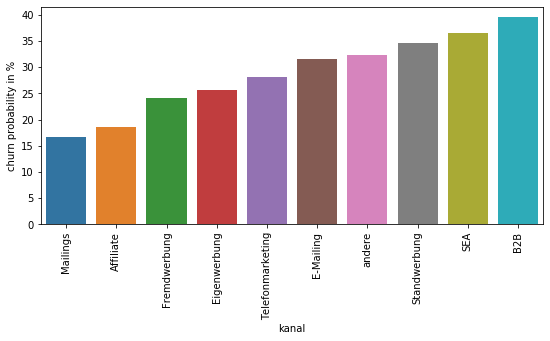

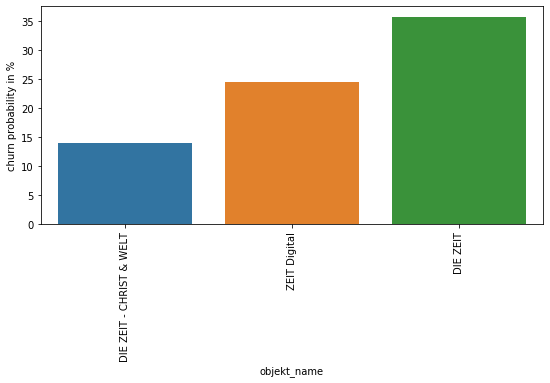

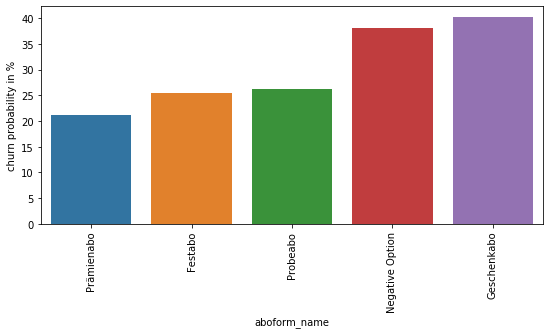

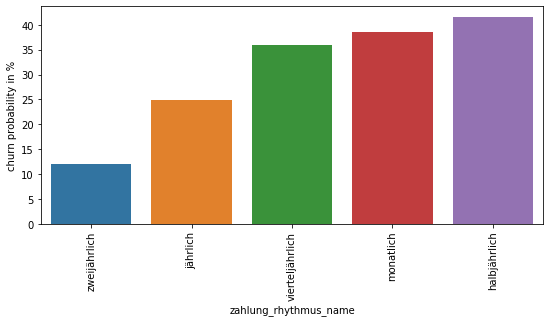

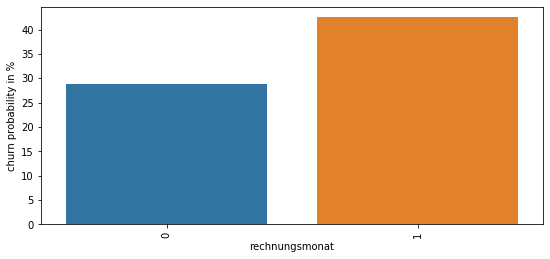

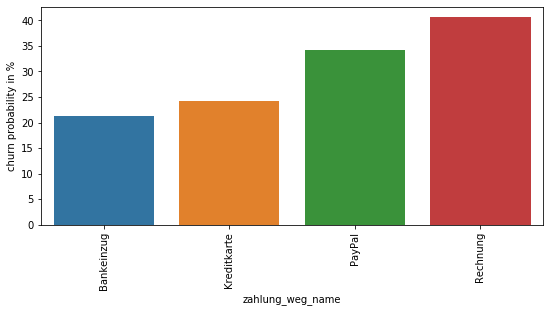

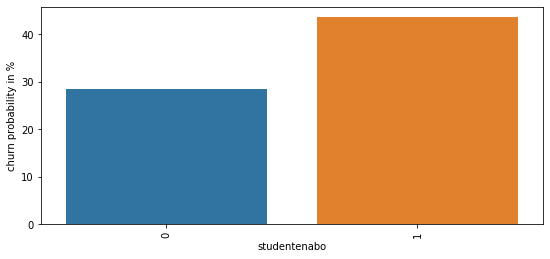

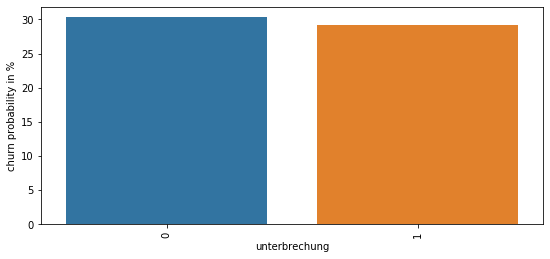

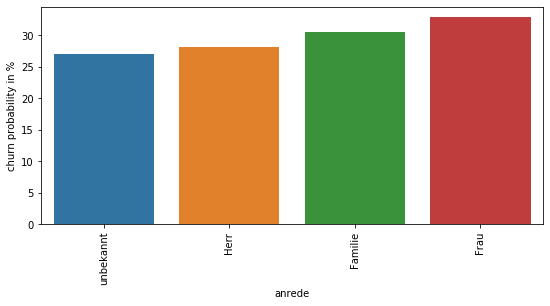

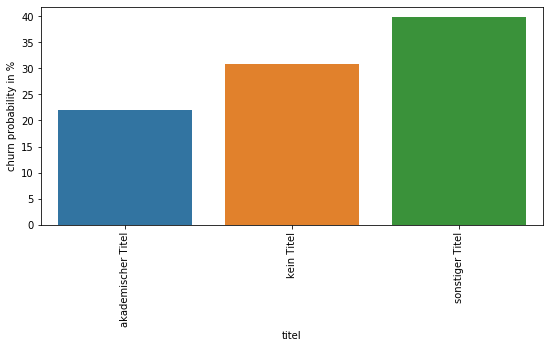

In [160]:
plot_list_mod = ['kanal', 'objekt_name', 'aboform_name', 'zahlung_rhythmus_name', 'rechnungsmonat', 
                   'zahlung_weg_name', 'studentenabo', 'unterbrechung',
   'anrede', 'titel']
for i in plot_list_mod:
    df_b=df_a.groupby(i).agg({'churn_1': 'sum',
                'churn_0': 'sum', 'avg_churn': "mean"})
    #df_b.describe()

    df_b.columns = ['churn_1_sum', 'churn_0_sum','avg_churn_mean'] #["_".join(x) for x in df_b.columns.ravel()]

    df_b=df_b.reset_index()
    #df_b.head()

    df_b["q"]=(round(df_b["churn_1_sum"]/(df_b["churn_0_sum"]+df_b["churn_1_sum"]), 3))*100
    df_b=df_b.sort_values(by="q")
    df_b=df_b[(df_b['churn_1_sum']+df_b['churn_0_sum'])>20].sort_values(by="q")
    plt.subplots(figsize=(9,4))
    ax = sns.barplot(x=i, y="q", data=df_b, )
    ax.set(xlabel=i, ylabel='churn probability in %')

    ax.set_xticklabels(ax.get_xticklabels(), rotation=90)

We see that the churn probability varies strongly with the sub-category for many variables. One should note though that some of the 
very small or very large churn probabilities occur for sub-categories that have only few subscribers. For instance 
Geschenkabo is associated with a rather high churn probability of about 40 %, but only less than 5% of all subscribers have a Geschenkabo. 

## Subscription options

/Users/marcozagermann/opt/anaconda3/envs/nf/lib/python3.6/site-packages/ipykernel_launcher.py:13: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  del sys.path[0]


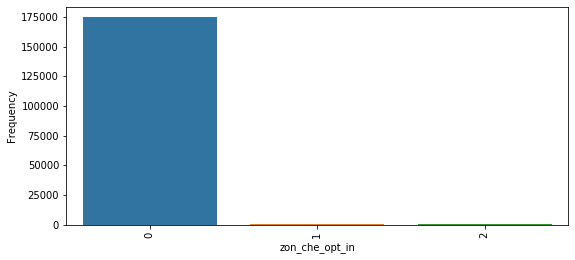

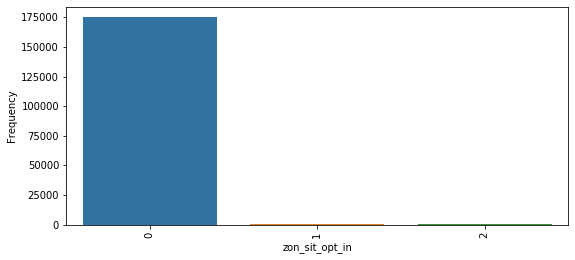

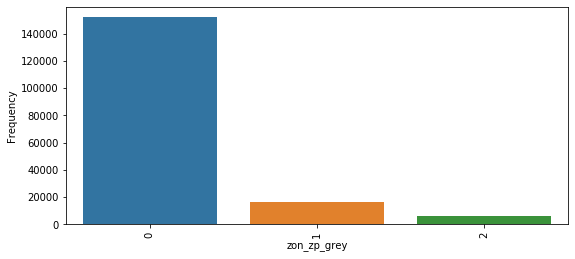

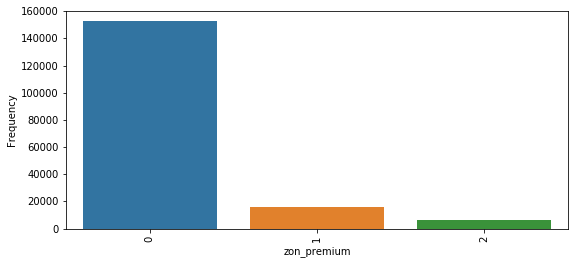

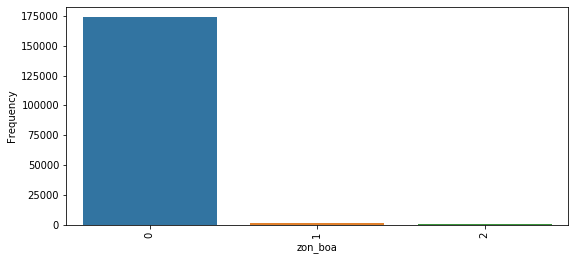

...

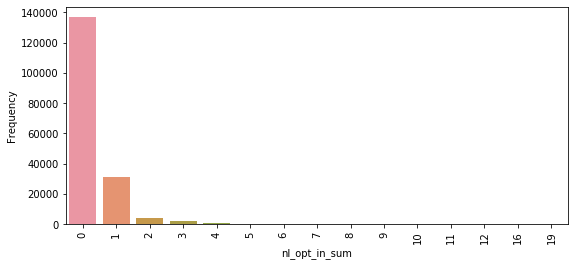

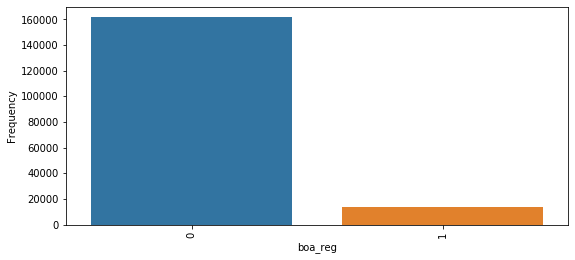

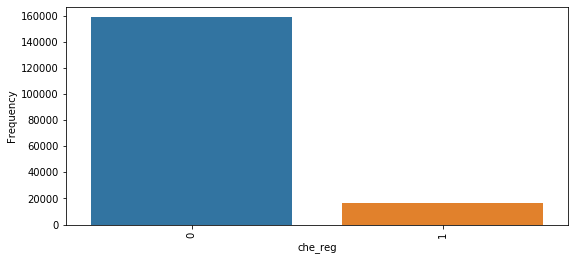

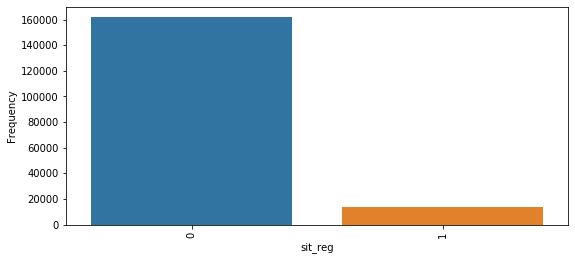

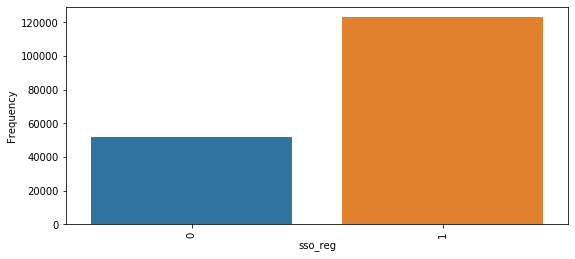

In [161]:
for i in ['zon_che_opt_in', 'zon_sit_opt_in',
       'zon_zp_grey', 'zon_premium', 'zon_boa', 'zon_kommentar',
       'zon_sonstige', 'zon_zp_red', 'zon_rawr', 'zon_community',
       'zon_app_sonstige', 'zon_schach', 'zon_blog_kommentare',
       'zon_quiz', 'cnt_abo', 'cnt_abo_diezeit',
       'cnt_abo_diezeit_digital', 'cnt_abo_magazin',
       'cnt_umwandlungsstatus2_dkey',
       'nl_zeitbrief', 'nl_zeitshop', 'nl_zeitverlag_hamburg',
       'nl_fdz_organisch',
       'nl_opt_in_sum', 'boa_reg', 'che_reg', 'sit_reg', 'sso_reg']:
    
    
    plt.subplots(figsize=(9,4))
    ax = sns.countplot(x=i, data=df_a)
    ax.set(xlabel=i, ylabel='Frequency')

    ax.set_xticklabels(ax.get_xticklabels(), rotation=90)    
    

Many of the above variables are strongly dominated by the value 0, which makes them less useful for predicting churn.
We therefore plot the churn probability only for those variables where values different from zero occur more frequently: 

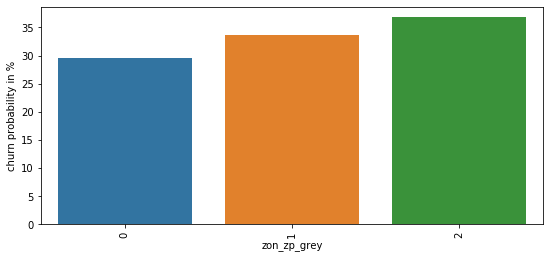

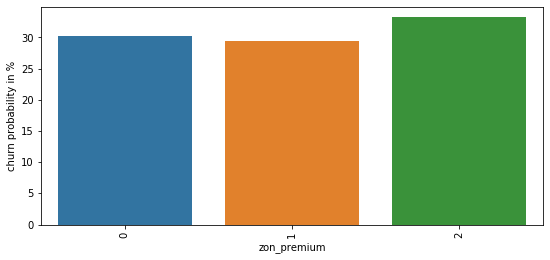

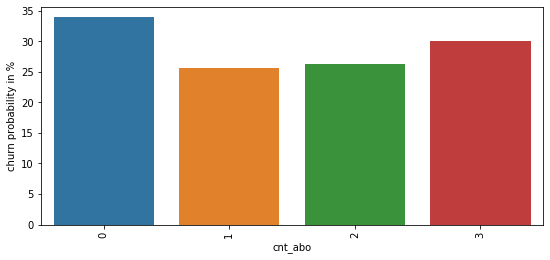

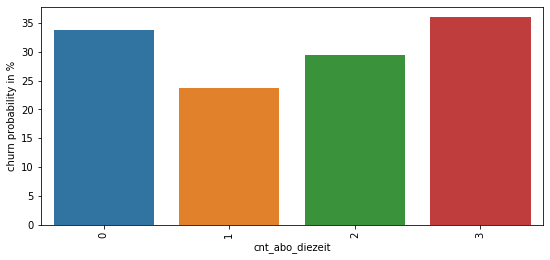

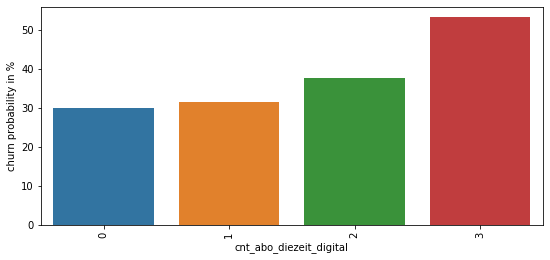

...

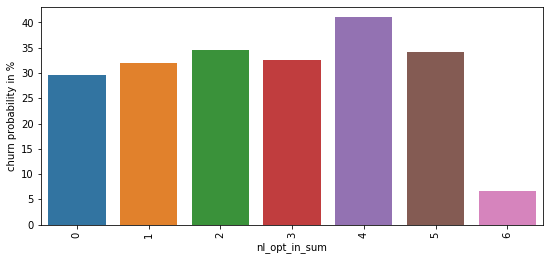

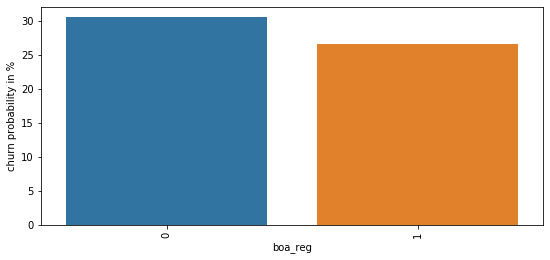

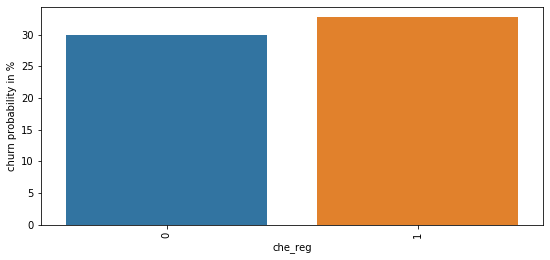

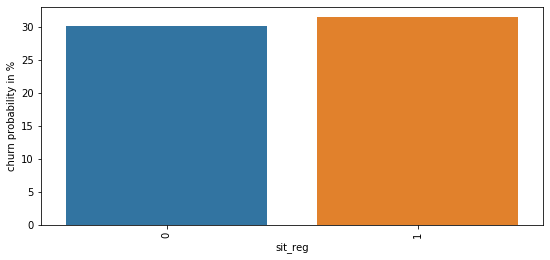

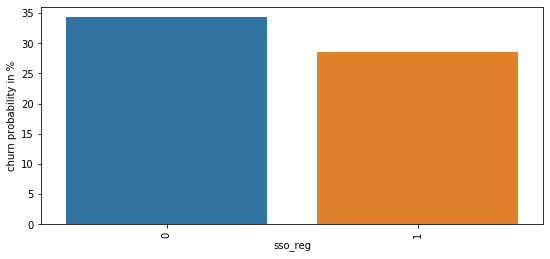

In [162]:
plot_list_mod = [ 'zon_zp_grey', 'zon_premium','cnt_abo', 'cnt_abo_diezeit',
       'cnt_abo_diezeit_digital', 'cnt_abo_magazin',
       'cnt_umwandlungsstatus2_dkey',
       'nl_zeitbrief', 'nl_zeitshop', 'nl_zeitverlag_hamburg',
       'nl_fdz_organisch', 'nl_opt_in_sum', 'boa_reg', 'che_reg', 'sit_reg', 'sso_reg'  ]
for i in plot_list_mod:
    df_b=df_a.groupby(i).agg({'churn_1': 'sum',
                'churn_0': 'sum', 'avg_churn': "mean"})
    #df_b.describe()

    df_b.columns = ['churn_1_sum', 'churn_0_sum','avg_churn_mean'] #["_".join(x) for x in df_b.columns.ravel()]

    df_b=df_b.reset_index()
    #df_b.head()

    df_b["q"]=(round(df_b["churn_1_sum"]/(df_b["churn_0_sum"]+df_b["churn_1_sum"]), 3))*100
    df_b=df_b.sort_values(by="q")
    df_b=df_b[(df_b['churn_1_sum']+df_b['churn_0_sum'])>20].sort_values(by="q")
    plt.subplots(figsize=(9,4))
    ax = sns.barplot(x=i, y="q", data=df_b, )
    ax.set(xlabel=i, ylabel='churn probability in %')

    ax.set_xticklabels(ax.get_xticklabels(), rotation=90)

For many of these variables the churn probability does not vary that much between different sub-categories.
We therefore expect only some of them to be potentially relevant for prediction of churn.

## Temporal features

We now examine the temporal features 

   * abo_registrierung_min_year
   * nl_registrierung_min_year
   * lesedauer
   * liefer_beginn_num

### Histograms

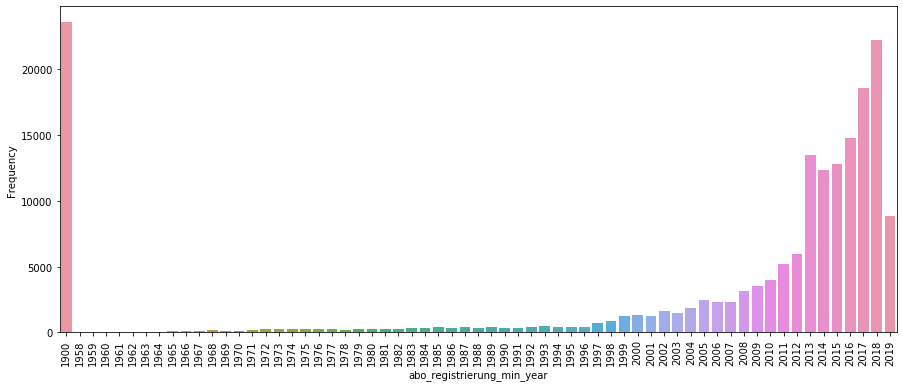

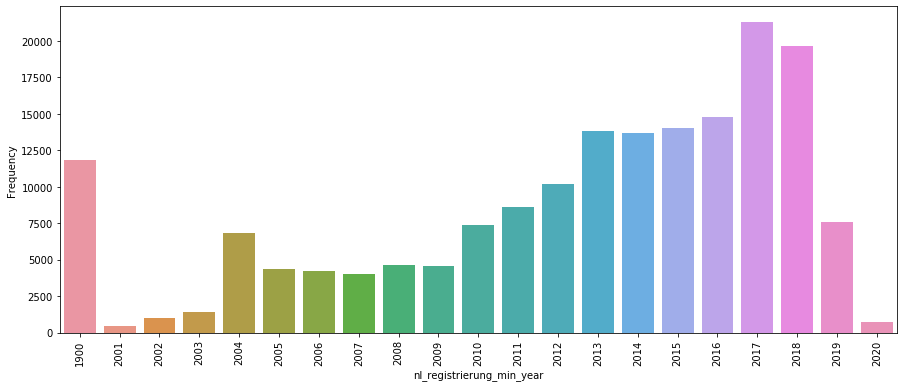

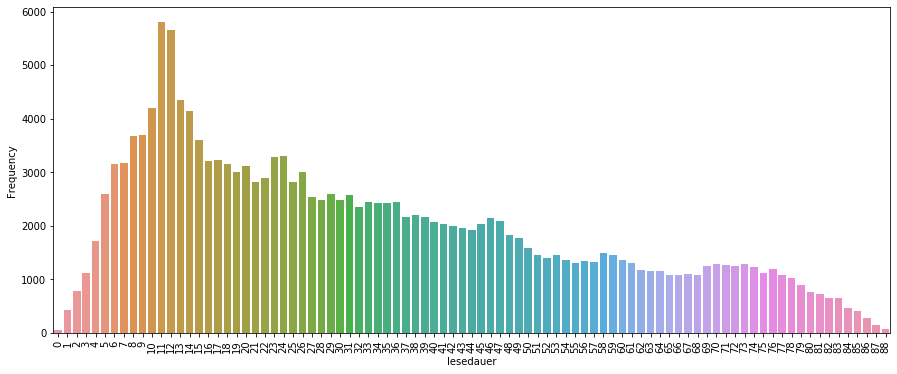

In [223]:

    
for i in ['abo_registrierung_min_year', 'nl_registrierung_min_year', 'lesedauer']:
    
    
    plt.subplots(figsize=(15,6))
    ax = sns.countplot(x=i, data=df_a)
    ax.set(xlabel=i, ylabel='Frequency')

    ax.set_xticklabels(ax.get_xticklabels(), rotation=90)    
    

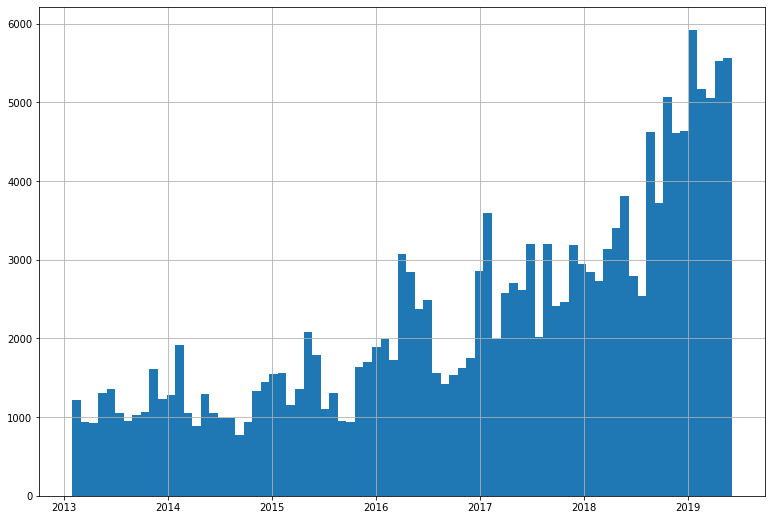

In [165]:
df_a['liefer_beginn_num'].hist(bins=77, figsize = (13,9))
plt.show()




### Churn probabilities

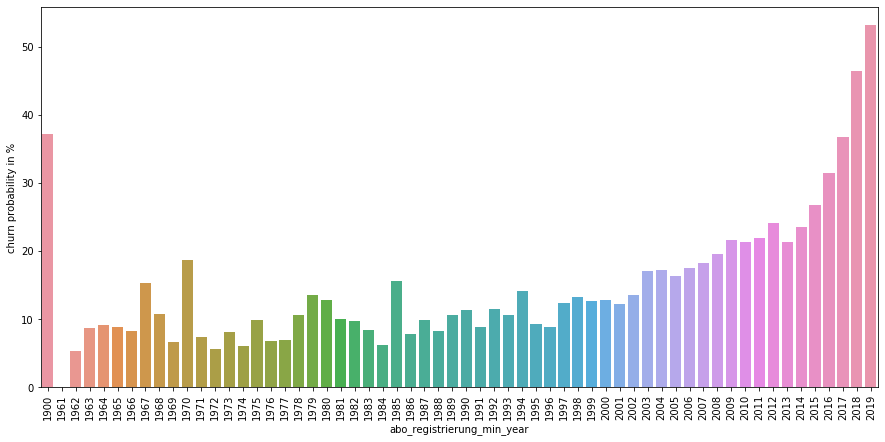

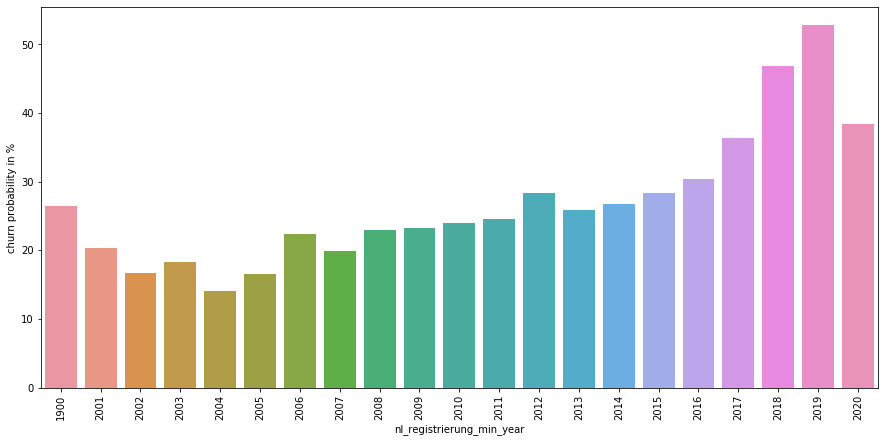

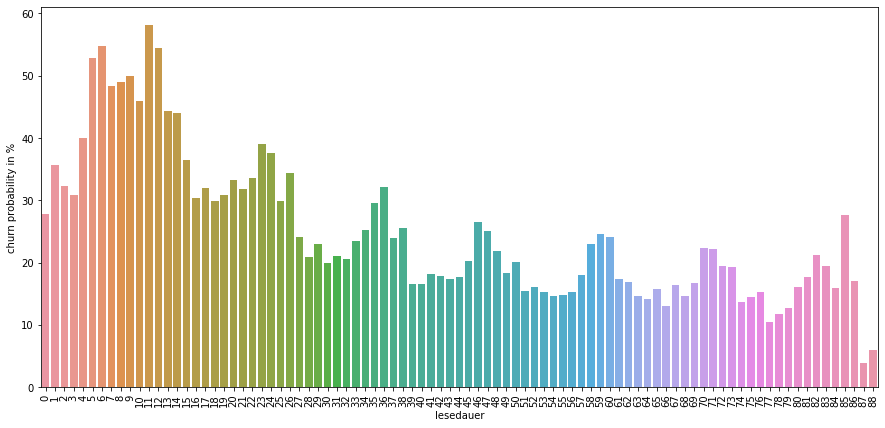

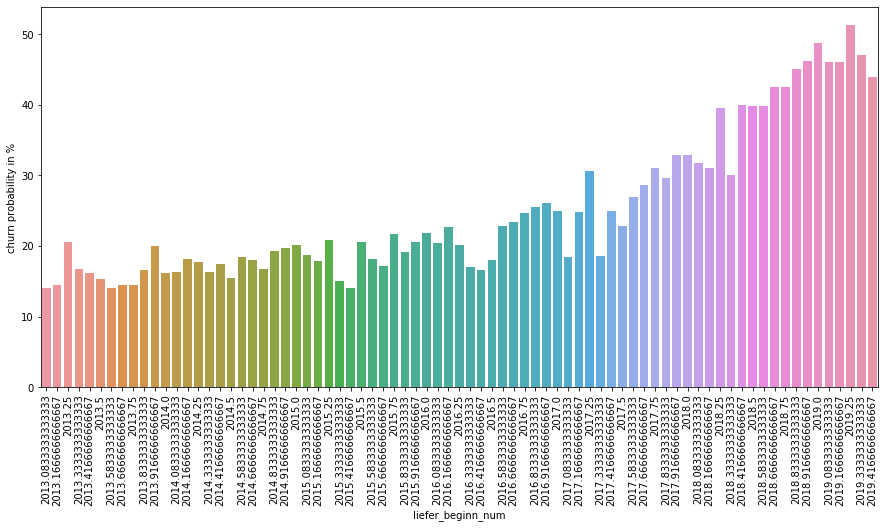

In [166]:
plot_list_mod = [ 'abo_registrierung_min_year', 'nl_registrierung_min_year', 'lesedauer', 'liefer_beginn_num'  ]
for i in plot_list_mod:
    df_b=df_a.groupby(i).agg({'churn_1': 'sum',
                'churn_0': 'sum', 'avg_churn': "mean"})
    #df_b.describe()

    df_b.columns = ['churn_1_sum', 'churn_0_sum','avg_churn_mean'] #["_".join(x) for x in df_b.columns.ravel()]

    df_b=df_b.reset_index()
    #df_b.head()

    df_b["q"]=(round(df_b["churn_1_sum"]/(df_b["churn_0_sum"]+df_b["churn_1_sum"]), 3))*100
    df_b=df_b.sort_values(by="q")
    df_b=df_b[(df_b['churn_1_sum']+df_b['churn_0_sum'])>20].sort_values(by="q")
    plt.subplots(figsize=(15,7))
    ax = sns.barplot(x=i, y="q", data=df_b, )
    ax.set(xlabel=i, ylabel='churn probability in %')

    ax.set_xticklabels(ax.get_xticklabels(), rotation=90)

All four temporal variables have a strong relation to churn probability. lesedauer and liefer_beginn_num also show a 
seasonal variation. lesedauer has peaks in churn probability at six and twelve months and then
every other twelve monts. This is presumably due to typical durations of subscriptions or special offers.

All in all,the churn probability decreases the longer subscribers have their subscriptions or contacts with 
"Die Zeit".



**The value 1900**

'abo_registrierung_min_year', 'nl_registrierung_min_year' have many instances with the value January first 1900 
(here binned to the year 1900). This is not a real value but an artifact due to cut off procedures etc. We can 
thus not really treat these two variables as simple numerical variables. We can also not simply throw away the 
values 1900 because they are associated with higher churn probability.

We will therefore bin these two variables and then turn them into dummy variables. This will be done in the 
section on data preprocessing.

## Geographical variables

We now study the geographical features. These are:

    * plz_1 (eleven different values)
    * plz_2 (97 different values)
    * plz_3 (697 different values)
    * land_iso_code (four different values)
    * metropole  (two different values)
    * ort (11 137 different values)
    
 

### Value counts

In [173]:
for i in ['plz_1', 'plz_2','plz_3','land_iso_code','metropole','ort']:
    print(f"{df_a[i].value_counts()}\n")
    
    

xx    23427
2     20530
7     19147
5     17714
8     17189
1     16853
4     15861
6     15491
3     13092
9      9766
0      5975
Name: plz_1, dtype: int64

xx    23427
10     6688
22     5802
50     4094
79     3413
53     3383
80     3129
12     3083
81     3004
70     2992
21     2758
48     2727
14     2660
40     2652
76     2580
72     2386
30     2346
24     2284
60     2264
45     2187
20     2179
55     2132
44     2032
65     2020
69     1999
85     1953
71     1940
13     1929
90     1898
82     1891
      ...  
27      966
54      931
32      908
46      879
99      867
96      811
06      774
94      730
84      719
29      692
87      684
77      668
18      649
75      619
57      615
95      600
07      593
36      559
39      507
17      503
16      498
15      488
09      423
92      377
19      341
08      191
02      163
03      151
98      131
11       14
Name: plz_2, Length: 97, dtype: int64

xx     23427
791     1625
481     1570
531     1430
691     1399
223  

The variable ort takes on too many different values for simply turning it into dummy variables. 
Apart from the resulting huge number of features, which would slow down computations, the small number of instances
for most cities would make these 11 000 dummy variables quite useless. We have made numerical tests
that showed that including these 11 000 dummy variables may increase the performance of an untuned model 
by only one percentage point, but parameter tuning would become very difficult due to the computational complexity.

We will thus drop this variable in the preprocessing section. An alternative could be to suitably aggregate this variable using external data. For the German places, however, the postal codes might be more useful for suitable aggregations and easier to process, whereas the foreign places are probably too diverse and heterogeneous so that at most an aggregation to countries might be feasible. For the latter, however, we already have a variable, namely land_iso_code. 




### Churn probabilities

We plot the churn probability per sub-category for the geographical variables. We set a filter of at least 27 instances per sub-category (this only affects plz_3 and ort as well as one instance of plz_2).

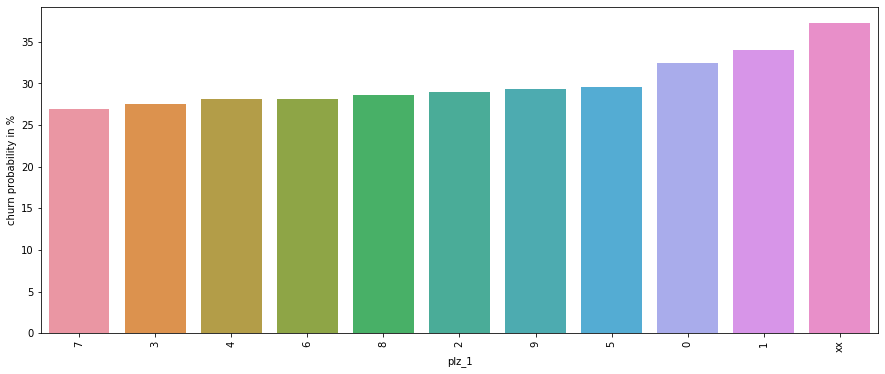

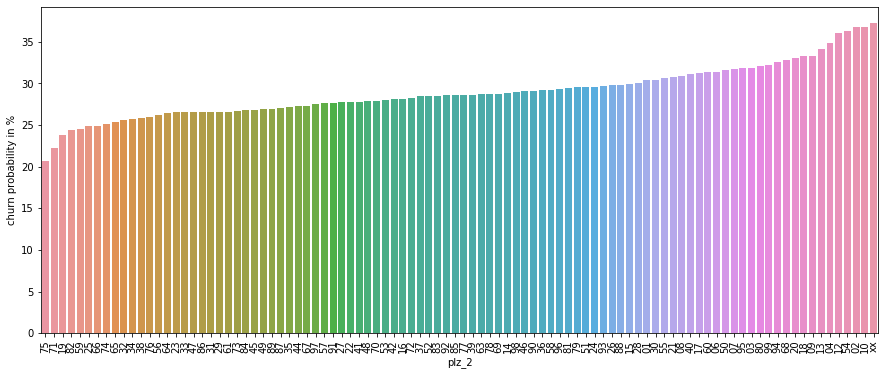

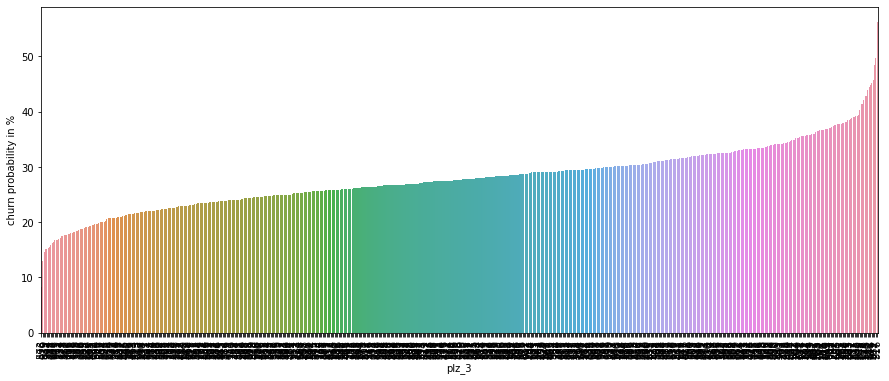

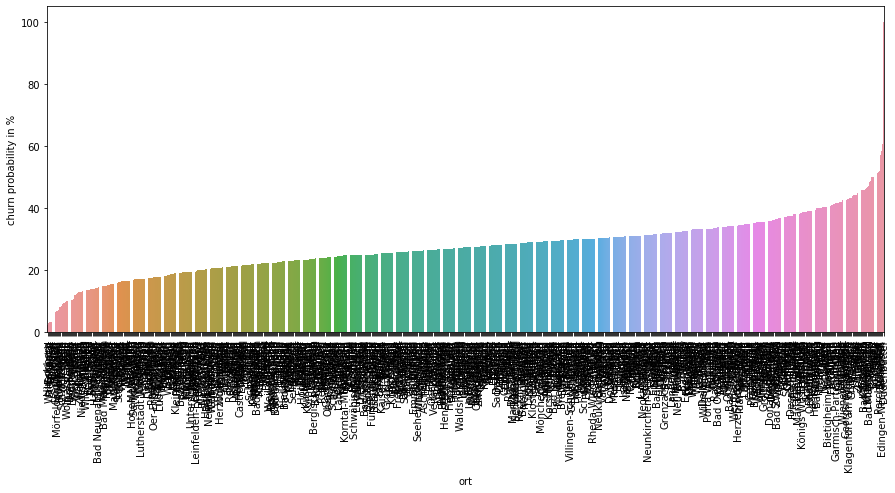

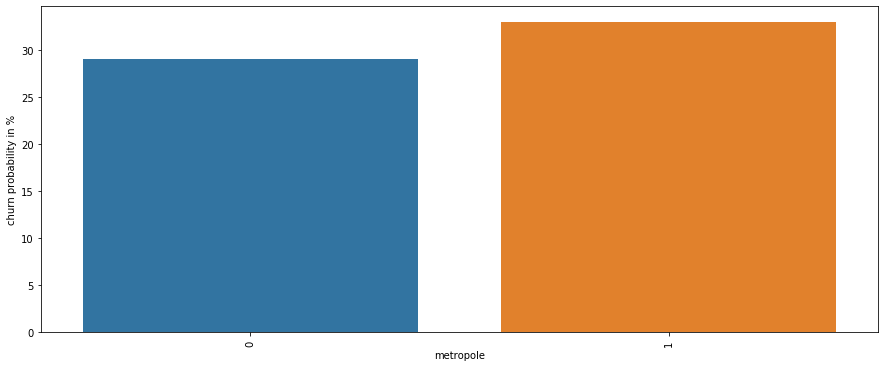

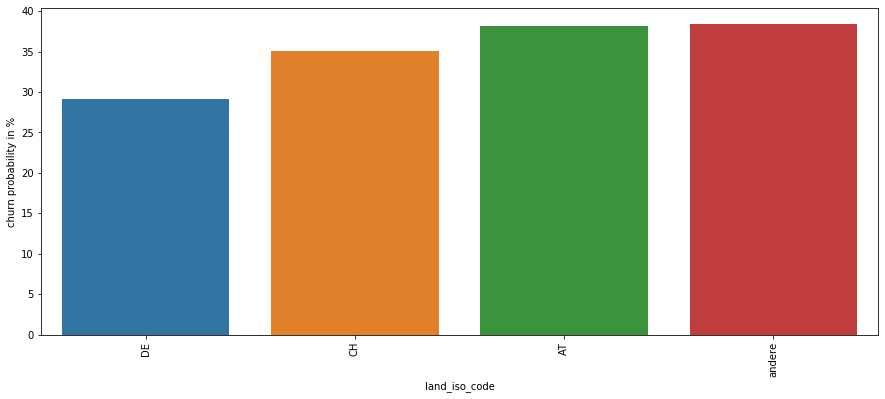

In [179]:
plot_list_mod = ['plz_1', 'plz_2', 'plz_3', 'ort', 'metropole',
                    'land_iso_code']
for i in plot_list_mod:
    df_b=df_a.groupby(i).agg({'churn_1': 'sum',
                'churn_0': 'sum', 'avg_churn': "mean"})
    #df_b.describe()

    df_b.columns = ['churn_1_sum', 'churn_0_sum','avg_churn_mean'] #["_".join(x) for x in df_b.columns.ravel()]

    df_b=df_b.reset_index()
    #df_b.head()

    df_b["q"]=(round(df_b["churn_1_sum"]/(df_b["churn_0_sum"]+df_b["churn_1_sum"]), 3))*100
    df_b=df_b.sort_values(by="q")
    df_b=df_b[(df_b['churn_1_sum']+df_b['churn_0_sum'])>27].sort_values(by="q")
    plt.subplots(figsize=(15,6))
    ax = sns.barplot(x=i, y="q", data=df_b, )
    ax.set(xlabel=i, ylabel='churn probability in %')

    ax.set_xticklabels(ax.get_xticklabels(), rotation=90)

We see that the churn probabilities have a strong dependence on the geographical data when they have a high spatial 
resolution as e.g. plz_3 and ort. Moreover, aggregating the data to summarize larger areas may average out some of 
these  differences (as e.g. in plz_1 and plz_2). But one also notices that suitable aggregations may also
preserve some large amounts of these differences, as e.g. in land_iso_code. This suggests that it might be 
useful to aggregate e.g. plz_3 in a way different from the naive spatial aggregation of plz_2 or plz_1, perhaps 
based on external socio economic data.


We will do some plotting of plz_1, plz_2, plz_3 on maps below, which gives a good idea about where the areas
with large or low churn probability are located in Germany. 

To also get an idea about the churn probabilities abroad, we plot it for the foreign places with at least 
28 subscribers:

[Text(0, 0, 'Aarau'),
 Text(0, 0, 'Chur'),
 Text(0, 0, 'Lustenau'),
 Text(0, 0, 'Bregenz'),
 Text(0, 0, 'Dornbirn'),
 Text(0, 0, 'Purkersdorf'),
 Text(0, 0, 'Liestal'),
 Text(0, 0, 'Luxembourg'),
 Text(0, 0, 'Klosterneuburg'),
 Text(0, 0, 'Zug'),
 Text(0, 0, 'Villach'),
 Text(0, 0, 'Bruxelles'),
 Text(0, 0, 'St. Pölten'),
 Text(0, 0, 'Luxemburg'),
 Text(0, 0, 'Mödling'),
 Text(0, 0, 'Basel'),
 Text(0, 0, 'St. Gallen'),
 Text(0, 0, 'Riehen'),
 Text(0, 0, 'Leonding'),
 Text(0, 0, 'Zürich'),
 Text(0, 0, 'Wabern'),
 Text(0, 0, 'Helsinki'),
 Text(0, 0, 'Innsbruck'),
 Text(0, 0, 'Salzburg'),
 Text(0, 0, 'Schaffhausen'),
 Text(0, 0, 'Baden'),
 Text(0, 0, 'Den Haag'),
 Text(0, 0, 'Biel/Bienne'),
 Text(0, 0, 'Kreuzlingen'),
 Text(0, 0, 'Maria Enzersdorf'),
 Text(0, 0, 'Brüssel'),
 Text(0, 0, 'Wels'),
 Text(0, 0, 'Uster'),
 Text(0, 0, 'Linz'),
 Text(0, 0, 'Luzern'),
 Text(0, 0, 'Bern'),
 Text(0, 0, 'Wien'),
 Text(0, 0, 'Gmunden'),
 Text(0, 0, 'Paris'),
 Text(0, 0, 'Lausanne'),
 Text(0, 0, 'Winte

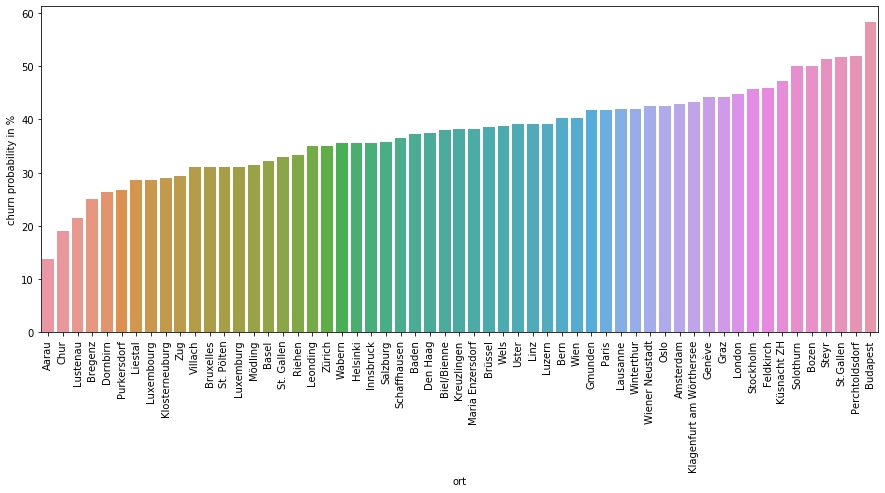

In [181]:
#plot_list_mod = ['kanal', 'objekt_name', 'aboform_name', 'zahlung_rhythmus_name', 'lesedauer', 'rechnungsmonat', 
                  #  'zahlung_weg_name', 'studentenabo', 'plz_1', 'plz_2', 'plz_3', 'ort', 'metropole',
                  #  'land_iso_code', 'shop_kauf', 'unterbrechung', 'anrede', 'titel', 'avg_churn', 'email_am_kunden']
#for i in plot_list_mod:
df_b=df_a[df_a['land_iso_code']!='DE'].groupby('ort').agg({'churn_1': 'sum',
                'churn_0': 'sum', 'churn':'sum','avg_churn': "mean"})
#df_b.describe()

df_b.columns = ['churn_1_sum', 'churn_0_sum','churn_sum','avg_churn_mean'] #["_".join(x) for x in df_b.columns.ravel()]

df_b=df_b.reset_index()
#df_b.head()

df_b["q"]=(round(df_b["churn_1_sum"]/(df_b["churn_0_sum"]+df_b["churn_1_sum"]), 3))*100
df_b=df_b.sort_values(by="q")
df_b=df_b[(df_b['churn_1_sum']+df_b['churn_0_sum'])>27].sort_values(by="q")
plt.subplots(figsize=(15,6))
ax = sns.barplot(x='ort', y="q", data=df_b, )
ax.set(xlabel='ort', ylabel='churn probability in %')

ax.set_xticklabels(ax.get_xticklabels(), rotation=90)

### Geographical plots of churn probability

We use Folium and data from suche-postleitzahl.org to create geographical plots of churn probability by postal code.
We start with plz_1. To save memory, we will deactivate the code. Bigger plots can be found in the pdf file in the repository. We first plot the churn probability itself for each plz region. For plz_2 and especially plz_3 the color scale will then be dominated by the few extreme values and look rather flat for the majority of regions. We will therefore also plot the quantiles of the churn probability which makes the plots less flat and enables one better to distinguish between the plz regions that are not at the extreme ends. We choose six quantiles as that naturally matches the color scale.

**plz_1 by churn probability**

In [184]:
#df_b1 = df_a.groupby('plz_1').agg({'churn_1':'sum', 'churn_0':'sum','churn':'sum', 'avg_churn': 'mean'})
# #df_b = df_a.groupby(i).agg({'churn_1': 'sum','churn_0': 'sum', 'avg_churn': "mean"})
#df_b1.columns = ['churn_1_sum','churn_0_sum','churn_sum', 'avg_churn_mean']
#df_b1=df_b1.reset_index()
#df_b1['q']=(round(df_b1['churn_1_sum']/(df_b1['churn_1_sum']+df_b1['churn_0_sum']),3))*100
#df_b1=df_b1.sort_values(by="q")
#df_b1['plz']=df_b1['plz_1']
#df_b1[['plz','q','churn_sum','avg_churn_mean']]

In [185]:
# # plot map of the payback probabilite (q) in the states
# #url = 'https://raw.githubusercontent.com/python-visualization/folium/master/examples/data'
#state_geo = open('plz-1stellig.geojson').read()
# #p=['loan_amnt_sum', 'loan_amnt_mean','loan_status_Charged Off_sum', 'loan_status_Fully Paid_sum',
#    #'num_grade_mean', 'int_rate_mean','q', 'annual_inc_mean', 'over_est']
#k = folium.Map(location=[50, 7], zoom_start=3)

#folium.Choropleth(
#    geo_data=state_geo,
#    name='churn probability by plz_1',
#    data=df_b1,
#    columns=['plz', 'q'],
#    key_on='feature.properties.plz',
#    fill_color='YlOrRd',
#    fill_opacity=0.7,
#    line_opacity=0.2,
#    legend_name='churn_probability by plz_1'
#).add_to(k)
#
#folium.LayerControl().add_to(k)
#  #marker_cluster = MarkerCluster().add_to(m)
#  #m.save('m.html')
#k

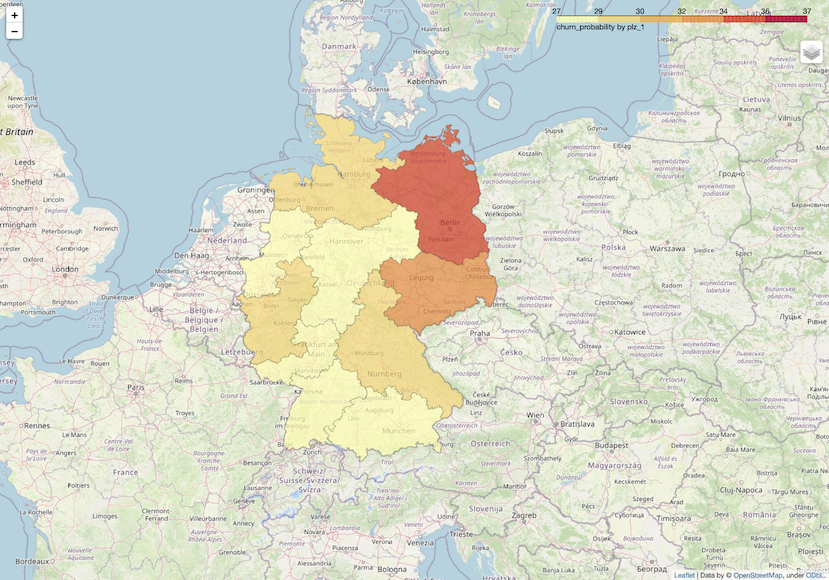

In [186]:
from IPython.display import Image

fig = Image(filename = 'plz_1.png')
fig

**plz_1 by quantile**

In [194]:
#df_b3 = df_a.groupby('plz_1').agg({'churn_1':'sum', 'churn_0':'sum','churn':'sum','avg_churn':'mean'})
#df_b3.columns = ['churn_1_sum','churn_0_sum','churn_sum','avg_churn_mean']
#df_b3=df_b3.reset_index()
#df_b3['q']=(round(df_b3['churn_1_sum']/(df_b3['churn_1_sum']+df_b3['churn_0_sum']),3))*100
#df_b3=df_b3[(df_b3['churn_1_sum']+df_b3['churn_0_sum'])>=47].sort_values(by='q')
#df_b3['plz']=df_b3['plz_1']
#cut_labels_3=[0,1,2,3,4,5]
# #cut_bins_3=[0,18,22,26,29,32,37,100]
# #df_b3['cut_q']=pd.cut(df_b3['q'],bins=cut_bins_3,labels=cut_labels_3)
#df_b3['qcut_q']=pd.qcut(df_b3['q'],q=6, labels=cut_labels_3)
#df_b3[['plz','q','churn_sum','avg_churn_mean','qcut_q']]

In [195]:
# # plot map of the payback probabilite (q) in the states
# #url = 'https://raw.githubusercontent.com/python-visualization/folium/master/examples/data'
#state_geo = open('plz-1stellig.geojson').read()
# #p=['loan_amnt_sum', 'loan_amnt_mean','loan_status_Charged Off_sum', 'loan_status_Fully Paid_sum',
#    #'num_grade_mean', 'int_rate_mean','q', 'annual_inc_mean', 'over_est']
#k = folium.Map(location=[50, 7], zoom_start=5)

#folium.Choropleth(
#    geo_data=state_geo,
#    name='churn probability by plz_1 (six quantiles)',
#    data=df_b3,
#    columns=['plz', 'qcut_q'],
#    key_on='feature.properties.plz',
#    fill_color='YlOrRd',
#    fill_opacity=0.7,
#    line_opacity=0.2,
#    legend_name='churn_probability by plz_1 (six quantiles)'
#).add_to(k)

#folium.LayerControl().add_to(k)
# #marker_cluster = MarkerCluster().add_to(m)
#k.save('plz_1_quantiles_6.html')
#k

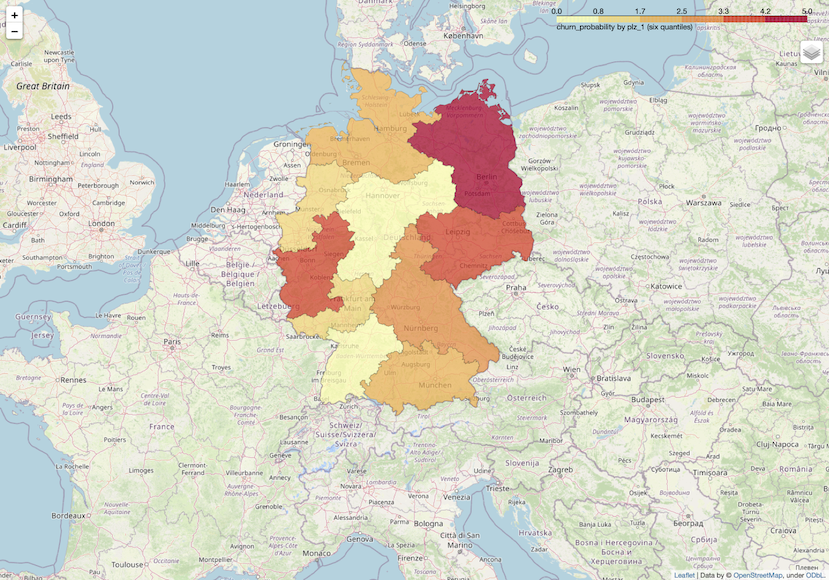

In [196]:
from IPython.display import Image
fig = Image(filename = 'plz_1_quantiles_6.png')
fig


**plz_2 by churn probability**

In [189]:
#df_b2=df_a.groupby('plz_2').agg({'churn_1':'sum', 'churn_0':'sum','churn':'sum','avg_churn':'mean'})
#df_b2.columns=['churn_1_sum','churn_0_sum','churn_sum','avg_churn_mean']
#df_b2=df_b2.reset_index()
#df_b2['q']=(round(df_b2['churn_1_sum']/(df_b2['churn_1_sum']+df_b2['churn_0_sum']),3))*100
#df_b2=df_b2.sort_values(by='q')
#df_b2['plz']=df_b2['plz_2']
#df_b2[['plz','q','churn_sum','avg_churn_mean']]

In [190]:
# # plot map of the payback probabilite (q) in the states
# #url = 'https://raw.githubusercontent.com/python-visualization/folium/master/examples/data'
#state_geo = open('plz-2stellig.geojson').read()
# #p=['loan_amnt_sum', 'loan_amnt_mean','loan_status_Charged Off_sum', 'loan_status_Fully Paid_sum',
#    #'num_grade_mean', 'int_rate_mean','q', 'annual_inc_mean', 'over_est']
#k = folium.Map(location=[50, 7], zoom_start=3)

#folium.Choropleth(
#    geo_data=state_geo,
#    name='churn probability by plz_2',
#    data=df_b2,
#    columns=['plz', 'q'],
#    key_on='feature.properties.plz',
#    fill_color='YlOrRd',
#    fill_opacity=0.7,
#    line_opacity=0.2,
#    legend_name='churn_probability by plz_2'
#).add_to(k)

#folium.LayerControl().add_to(k)
# #marker_cluster = MarkerCluster().add_to(m)
# #m.save('m.html')
#k

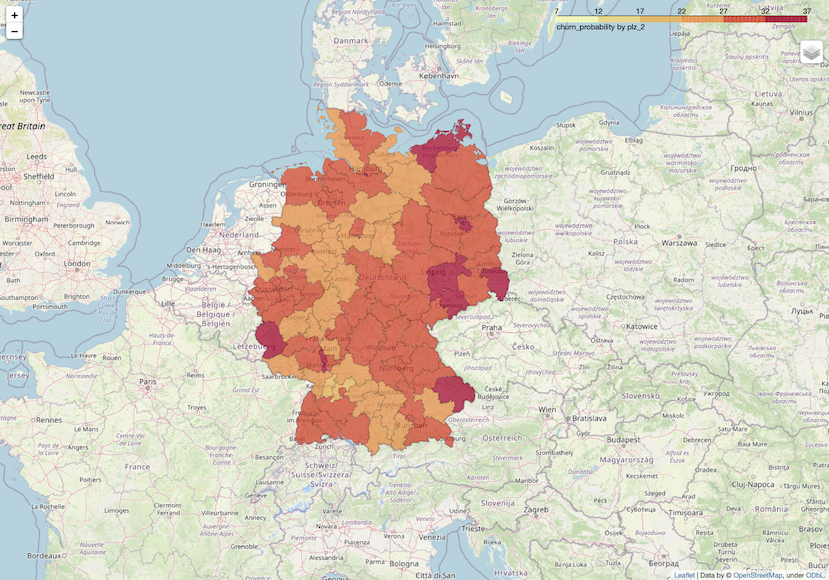

In [191]:
from IPython.display import Image

fig = Image(filename = 'plz_2.png')
fig

**plz_2 by quantile**

In [199]:
#df_b3 = df_a.groupby('plz_2').agg({'churn_1':'sum', 'churn_0':'sum','churn':'sum','avg_churn':'mean'})
#df_b3.columns = ['churn_1_sum','churn_0_sum','churn_sum','avg_churn_mean']
#df_b3=df_b3.reset_index()
#df_b3['q']=(round(df_b3['churn_1_sum']/(df_b3['churn_1_sum']+df_b3['churn_0_sum']),3))*100
#df_b3=df_b3[(df_b3['churn_1_sum']+df_b3['churn_0_sum'])>=47].sort_values(by='q')
#df_b3['plz']=df_b3['plz_2']
#cut_labels_3=[0,1,2,3,4,5]
# #cut_bins_3=[0,18,22,26,29,32,37,100]
# #df_b3['cut_q']=pd.cut(df_b3['q'],bins=cut_bins_3,labels=cut_labels_3)
#df_b3['qcut_q']=pd.qcut(df_b3['q'],q=6, labels=cut_labels_3)
#df_b3[['plz','q','churn_sum','avg_churn_mean','qcut_q']]

In [200]:
# # plot map of the payback probabilite (q) in the states
# #url = 'https://raw.githubusercontent.com/python-visualization/folium/master/examples/data'
#state_geo = open('plz-2stellig.geojson').read()
# #p=['loan_amnt_sum', 'loan_amnt_mean','loan_status_Charged Off_sum', 'loan_status_Fully Paid_sum',
#    #'num_grade_mean', 'int_rate_mean','q', 'annual_inc_mean', 'over_est']
#k = folium.Map(location=[50, 7], zoom_start=5)

#folium.Choropleth(
#    geo_data=state_geo,
#    name='churn probability by plz_2 (six quantiles)',
#    data=df_b3,
#    columns=['plz', 'qcut_q'],
#    key_on='feature.properties.plz',
#    fill_color='YlOrRd',
#    fill_opacity=0.7,
#    line_opacity=0.2,
#    legend_name='churn_probability by plz_2 (six quantiles)'
#).add_to(k)

#folium.LayerControl().add_to(k)
# #marker_cluster = MarkerCluster().add_to(m)
#k.save('plz_2_quantiles_6.html')
#k

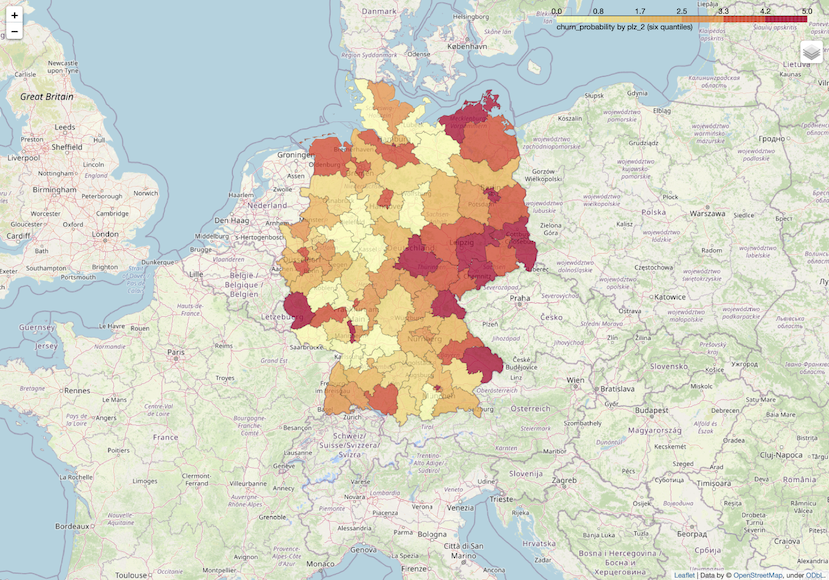

In [201]:
from IPython.display import Image

fig = Image(filename = 'plz_2_quantiles_6.png')
fig

**plz_3 by churn probability with at least five subscribers per plz_3 region**

The black regions have fewer than five subscribers.

In [205]:
#df_b3 = df_a.groupby('plz_3').agg({'churn_1':'sum', 'churn_0':'sum','churn':'sum','avg_churn':'mean'})
#df_b3.columns = ['churn_1_sum','churn_0_sum','churn_sum','avg_churn_mean']
#df_b3=df_b3.reset_index()
#df_b3['q']=(round(df_b3['churn_1_sum']/(df_b3['churn_1_sum']+df_b3['churn_0_sum']),3))*100
#df_b3=df_b3[(df_b3['churn_1_sum']+df_b3['churn_0_sum'])>=5].sort_values(by='q')
#df_b3['plz']=df_b3['plz_3']
#df_b3[['plz','q','churn_sum','avg_churn_mean']]

In [206]:
# # plot map of the payback probabilite (q) in the states
# #url = 'https://raw.githubusercontent.com/python-visualization/folium/master/examples/data'
#state_geo = open('plz-3stellig.geojson').read()
# #p=['loan_amnt_sum', 'loan_amnt_mean','loan_status_Charged Off_sum', 'loan_status_Fully Paid_sum',
#    #'num_grade_mean', 'int_rate_mean','q', 'annual_inc_mean', 'over_est']
#k = folium.Map(location=[50, 7], zoom_start=5)

#folium.Choropleth(
#    geo_data=state_geo,
#    name='churn probability by plz_3',
#    data=df_b3,
#    columns=['plz', 'q'],
#    key_on='feature.properties.plz',
#    fill_color='YlOrRd',
#    fill_opacity=0.7,
#    line_opacity=0.2,
#    legend_name='churn_probability by plz_3, black: < 5 subscribers'
#).add_to(k)

#folium.LayerControl().add_to(k)
# #marker_cluster = MarkerCluster().add_to(m)
# #m.save('m.html')
#k

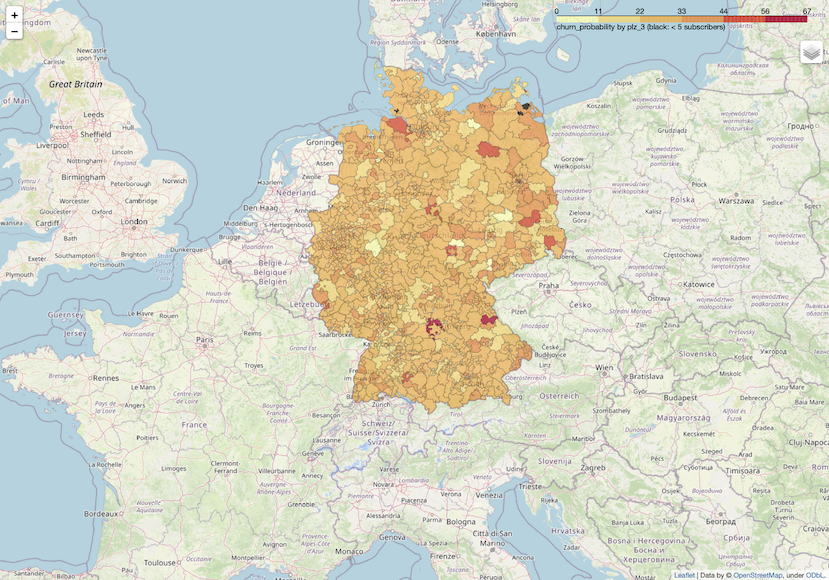

In [207]:
from IPython.display import Image

fig = Image(filename = 'plz_3_threshold_5.png')
fig

**plz_3 by quantile with at least five subscribers per plz_3 region**

In [210]:
#df_b3 = df_a.groupby('plz_3').agg({'churn_1':'sum', 'churn_0':'sum','churn':'sum','avg_churn':'mean'})
#df_b3.columns = ['churn_1_sum','churn_0_sum','churn_sum','avg_churn_mean']
#df_b3=df_b3.reset_index()
#df_b3['q']=(round(df_b3['churn_1_sum']/(df_b3['churn_1_sum']+df_b3['churn_0_sum']),3))*100
#df_b3=df_b3[(df_b3['churn_1_sum']+df_b3['churn_0_sum'])>=5].sort_values(by='q')
#df_b3['plz']=df_b3['plz_3']
#cut_labels_3=[0,1,2,3,4,5]
# #cut_bins_3=[0,18,22,26,29,32,37,100]
# #df_b3['cut_q']=pd.cut(df_b3['q'],bins=cut_bins_3,labels=cut_labels_3)
#df_b3['qcut_q']=pd.qcut(df_b3['q'],q=6, labels=cut_labels_3)
#df_b3[['plz','q','churn_sum','avg_churn_mean','qcut_q']]

In [211]:
# # plot map of the payback probabilite (q) in the states
# #url = 'https://raw.githubusercontent.com/python-visualization/folium/master/examples/data'
#state_geo = open('plz-3stellig.geojson').read()
# #p=['loan_amnt_sum', 'loan_amnt_mean','loan_status_Charged Off_sum', 'loan_status_Fully Paid_sum',
#   #'num_grade_mean', 'int_rate_mean','q', 'annual_inc_mean', 'over_est']
#k = folium.Map(location=[50, 7], zoom_start=5)

#folium.Choropleth(
#    geo_data=state_geo,
#    name='churn probability by plz_3 (six quantiles)',
#    data=df_b3,
#    columns=['plz', 'qcut_q'],
#    key_on='feature.properties.plz',
#    fill_color='YlOrRd',
#    fill_opacity=0.7,
#    line_opacity=0.2,
#    legend_name='churn_probability by plz_3 (six quantiles, black: < 5 subscribers)'
#).add_to(k)

#folium.LayerControl().add_to(k)
# #marker_cluster = MarkerCluster().add_to(m)
#k.save('plz_3_threshold_5_quantiles_6.html')
#k

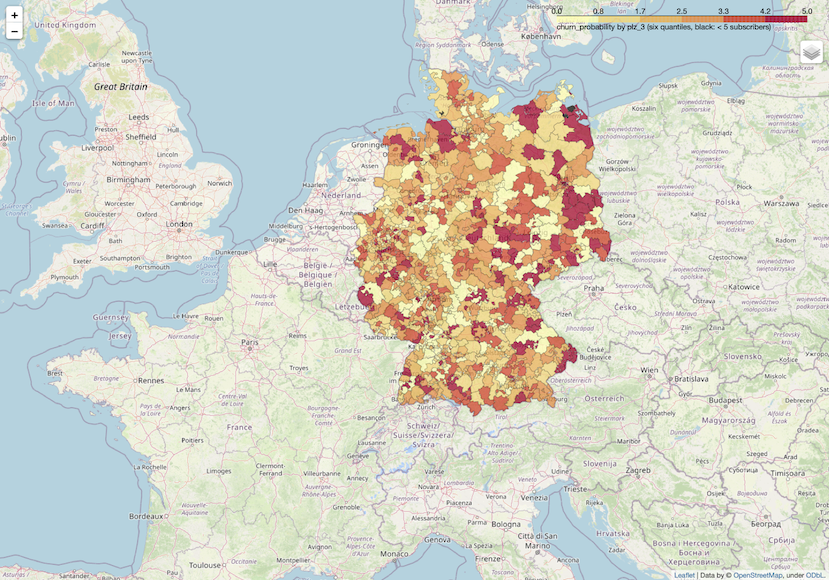

In [212]:
from IPython.display import Image

fig = Image(filename = 'plz_3_threshold_5_quantiles_6.png')
fig

**plz_3 by churn probability with at least 40 subscribers per plz_3 region**

The black regions have fewer than 40 subscribers.

In [215]:
#df_b3 = df_a.groupby('plz_3').agg({'churn_1':'sum', 'churn_0':'sum','churn':'sum','avg_churn':'mean'})
#df_b3.columns = ['churn_1_sum','churn_0_sum','churn_sum','avg_churn_mean']
#df_b3=df_b3.reset_index()
#df_b3['q']=(round(df_b3['churn_1_sum']/(df_b3['churn_1_sum']+df_b3['churn_0_sum']),3))*100
#df_b3=df_b3[(df_b3['churn_1_sum']+df_b3['churn_0_sum'])>=40].sort_values(by='q')
#df_b3['plz']=df_b3['plz_3']
#df_b3[['plz','q','churn_sum','avg_churn_mean']]

In [216]:
# # plot map of the payback probabilite (q) in the states
# #url = 'https://raw.githubusercontent.com/python-visualization/folium/master/examples/data'
#state_geo = open('plz-3stellig.geojson').read()
# #p=['loan_amnt_sum', 'loan_amnt_mean','loan_status_Charged Off_sum', 'loan_status_Fully Paid_sum',
#    #'num_grade_mean', 'int_rate_mean','q', 'annual_inc_mean', 'over_est']
#k = folium.Map(location=[50, 7], zoom_start=5)

#folium.Choropleth(
#    geo_data=state_geo,
#    name='churn probability by plz_3',
#    data=df_b3,
#    columns=['plz', 'q'],
#    key_on='feature.properties.plz',
#    fill_color='YlOrRd',
#    fill_opacity=0.7,
#    line_opacity=0.2,
#    legend_name='churn_probability by plz_3'
#).add_to(k)

#folium.LayerControl().add_to(k)
# #marker_cluster = MarkerCluster().add_to(m)
# #m.save('m.html')
#k

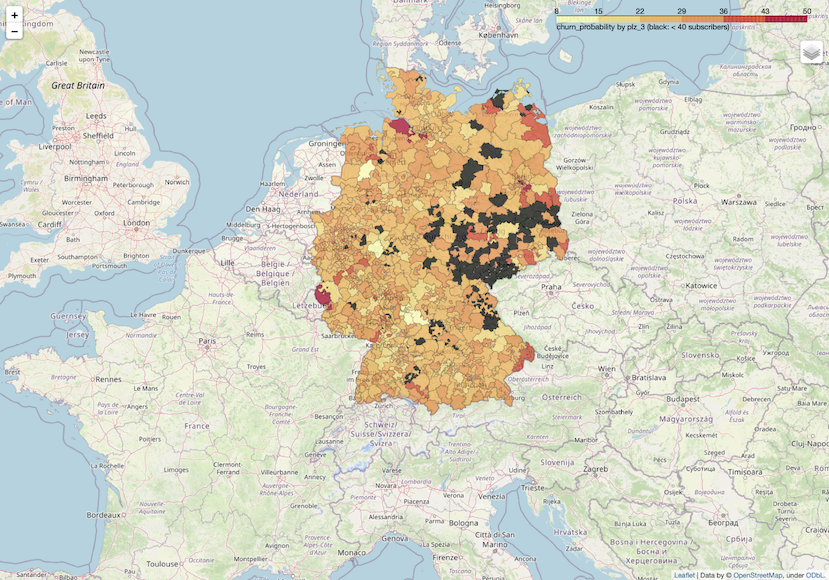

In [217]:
from IPython.display import Image

fig = Image(filename = 'plz_3_threshold_40.png')
fig

**plz_3 by quantile with at least 40 subscribers per plz_3 region**

In [220]:
#df_b3 = df_a.groupby('plz_3').agg({'churn_1':'sum', 'churn_0':'sum','churn':'sum','avg_churn':'mean'})
#df_b3.columns = ['churn_1_sum','churn_0_sum','churn_sum','avg_churn_mean']
#df_b3=df_b3.reset_index()
#df_b3['q']=(round(df_b3['churn_1_sum']/(df_b3['churn_1_sum']+df_b3['churn_0_sum']),3))*100
#df_b3=df_b3[(df_b3['churn_1_sum']+df_b3['churn_0_sum'])>=40].sort_values(by='q')
#df_b3['plz']=df_b3['plz_3']
#cut_labels_3=[0,1,2,3,4,5]
# #cut_bins_3=[0,18,22,26,29,32,37,100]
# #df_b3['cut_q']=pd.cut(df_b3['q'],bins=cut_bins_3,labels=cut_labels_3)
#df_b3['qcut_q']=pd.qcut(df_b3['q'],q=6, labels=cut_labels_3)
#df_b3[['plz','q','churn_sum','avg_churn_mean','qcut_q']]

In [221]:
# # plot map of the payback probabilite (q) in the states
# #url = 'https://raw.githubusercontent.com/python-visualization/folium/master/examples/data'
#state_geo = open('plz-3stellig.geojson').read()
# #p=['loan_amnt_sum', 'loan_amnt_mean','loan_status_Charged Off_sum', 'loan_status_Fully Paid_sum',
#    #'num_grade_mean', 'int_rate_mean','q', 'annual_inc_mean', 'over_est']
#k = folium.Map(location=[50, 7], zoom_start=5)

#folium.Choropleth(
#    geo_data=state_geo,
#    name='churn probability by plz_3 (six quantiles)',
#    data=df_b3,
#    columns=['plz', 'qcut_q'],
#    key_on='feature.properties.plz',
#    fill_color='YlOrRd',
#    fill_opacity=0.7,
#    line_opacity=0.2,
#    legend_name='churn_probability by plz_3 (six quantiles, black: < 40 subscribers)'
#).add_to(k)

#folium.LayerControl().add_to(k)
# #marker_cluster = MarkerCluster().add_to(m)
#k.save('plz_3_threshold_40_quantiles_6.html')
#k

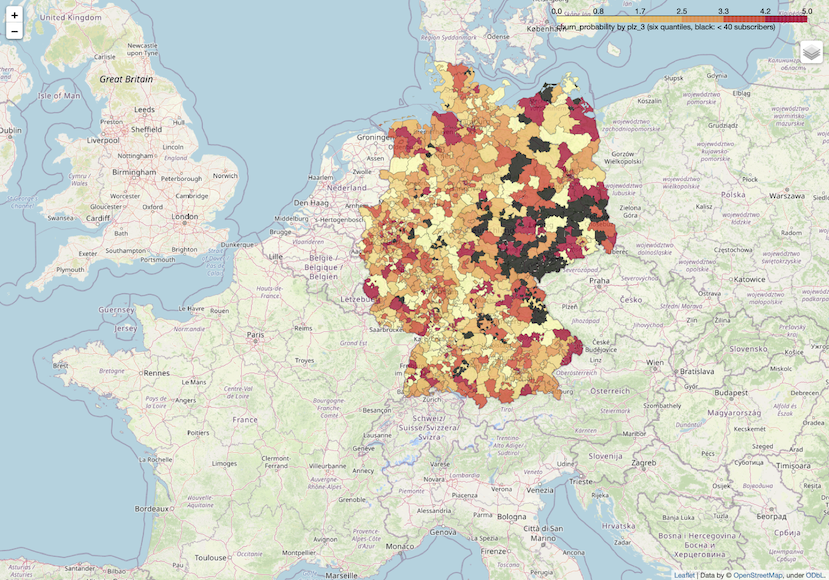

In [222]:
from IPython.display import Image

fig = Image(filename = 'plz_3_threshold_40_quantiles_6.png')
fig

A suitable aggregation might yield a useful variable.

## Communication and activity variables

       * shop_kauf
       * email_am_kunden
       * nl_blacklist_sum
       * nl_bounced_sum
       * nl_aktivitaet
       * nl_sperrliste_sum

       * received_anzahl(_A)_B
       * opened_anzahl(_A)_B
       * clicked_anzahl(_A)_B
       * unsubscribed_anzahl(_A)_B
       * openrate(_A)_C
       * clickrate(_A)_C
        
        
        where 
        A = bestandskunden, productnews, hamburg, zeitbrief
        B = 1w,1m,3m,6m
        C = 1w,1m,3m 

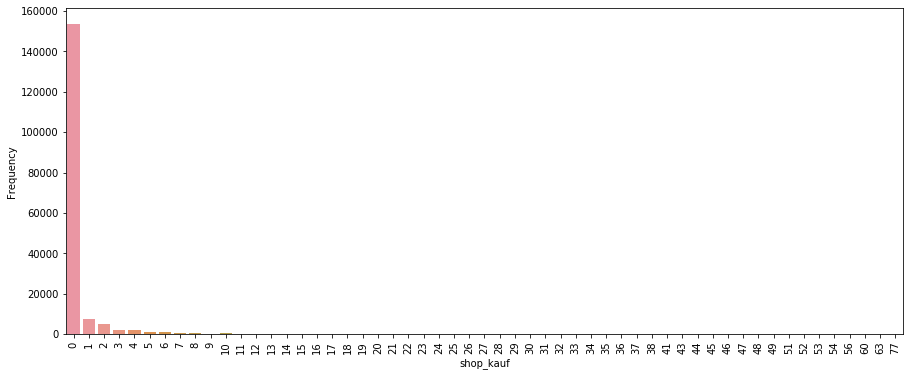

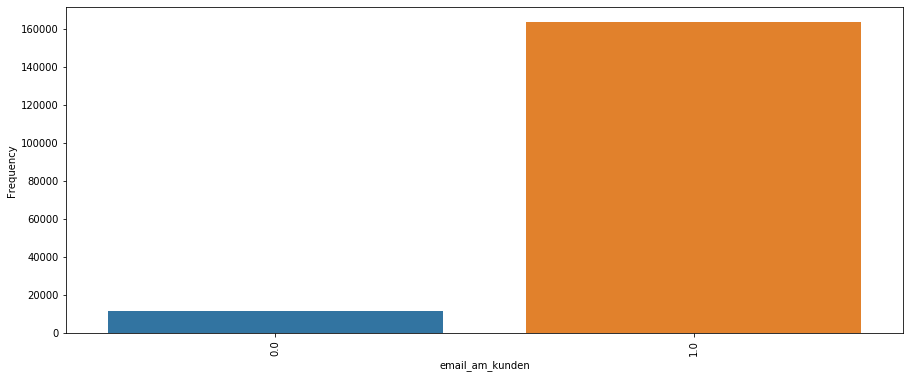

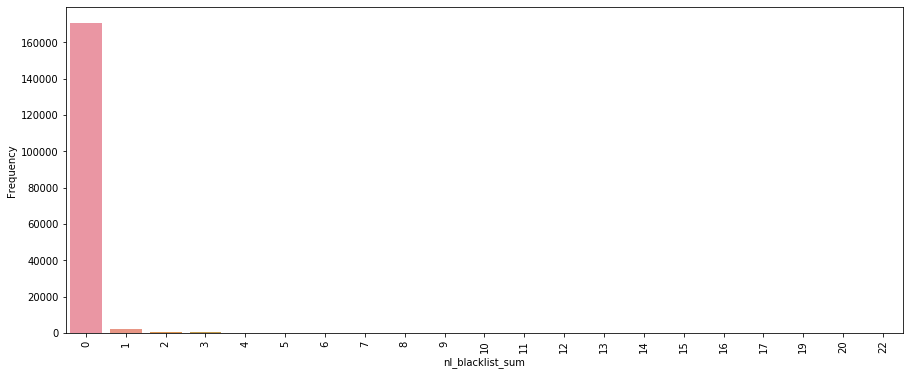

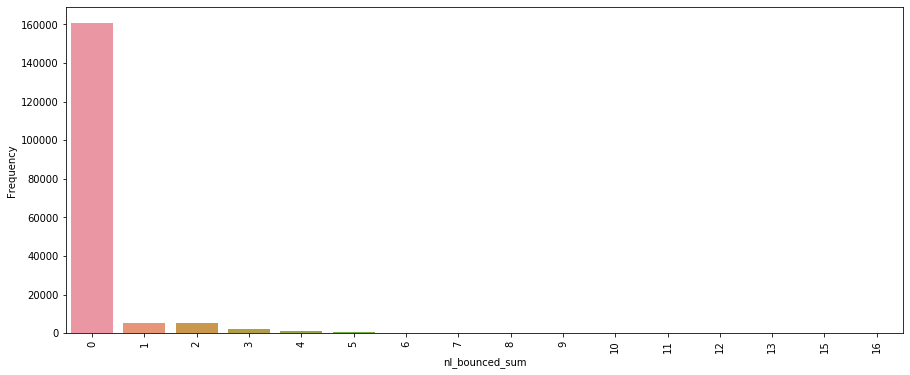

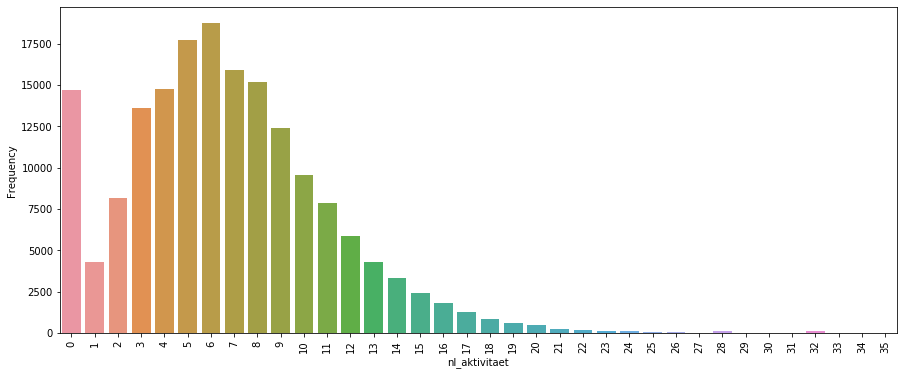

...

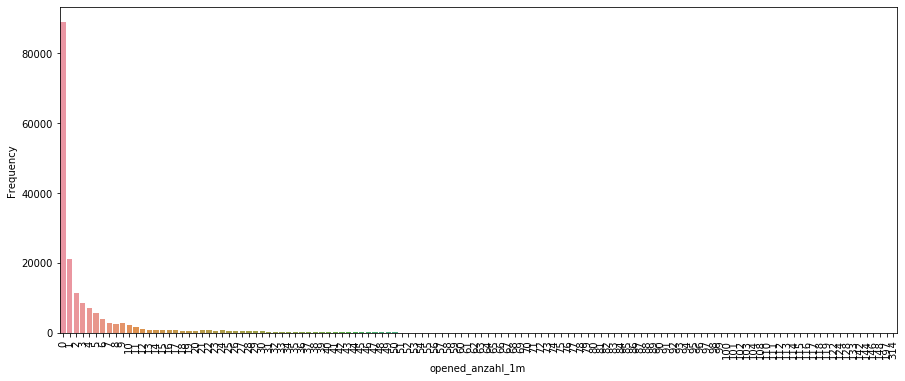

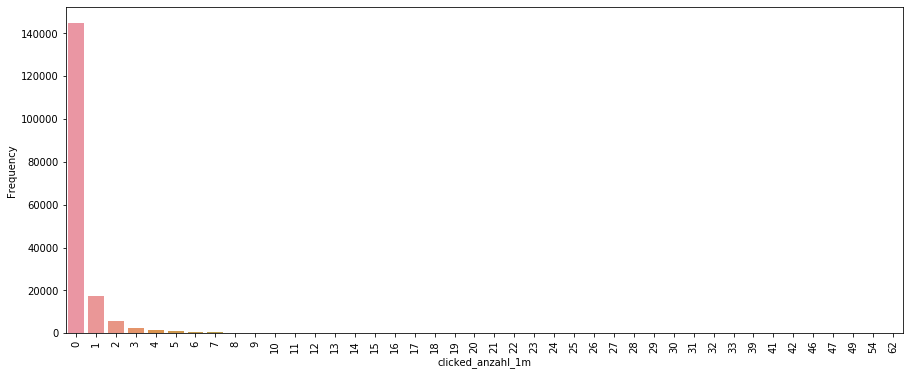

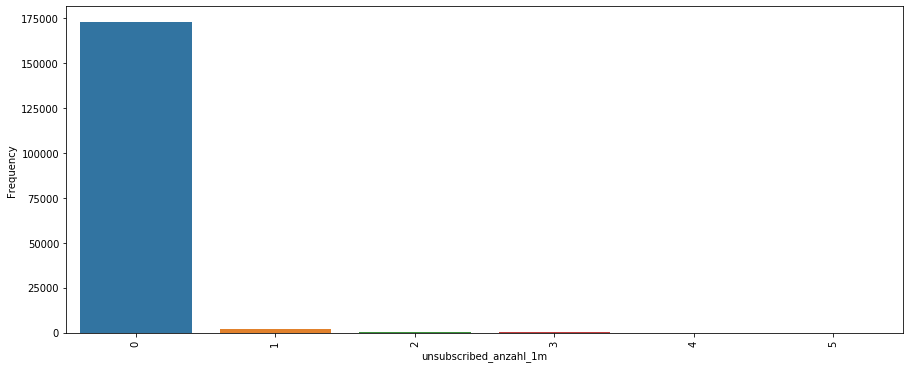

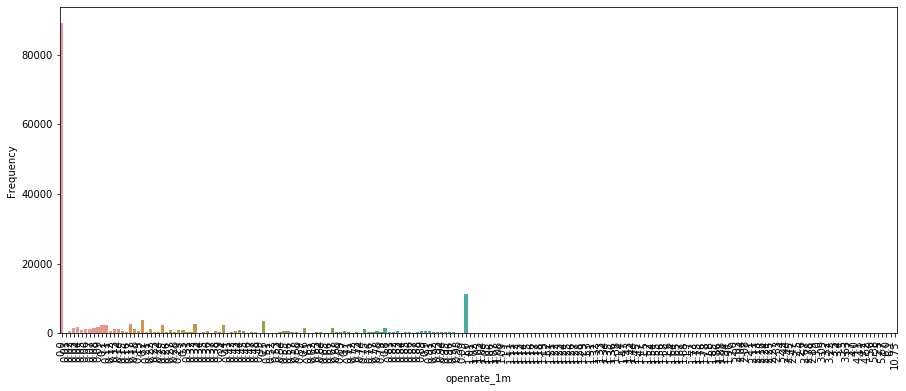

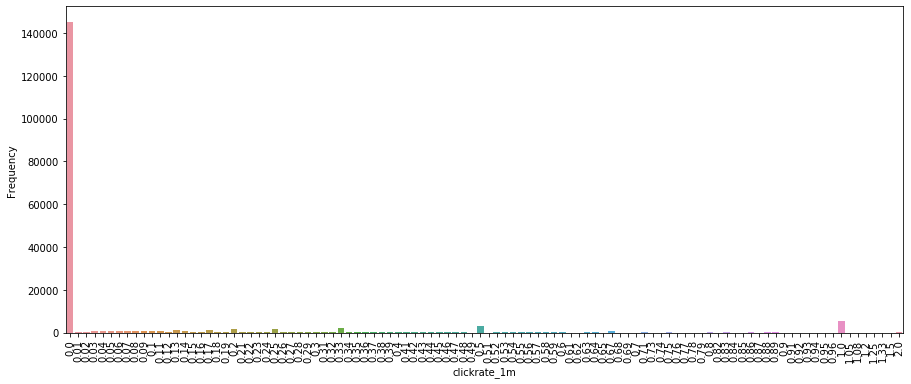

In [224]:
for i in ['shop_kauf','email_am_kunden','nl_blacklist_sum','nl_bounced_sum','nl_aktivitaet','nl_sperrliste_sum',
           'received_anzahl_1m','opened_anzahl_1m','clicked_anzahl_1m','unsubscribed_anzahl_1m',
          'openrate_1m','clickrate_1m']:
    
    
    plt.subplots(figsize=(15,6))
    ax = sns.countplot(x=i, data=df_a)
    ax.set(xlabel=i, ylabel='Frequency')

    ax.set_xticklabels(ax.get_xticklabels(), rotation=90)    

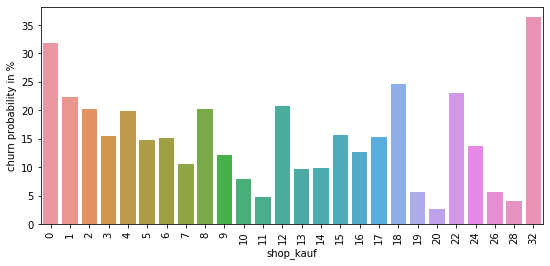

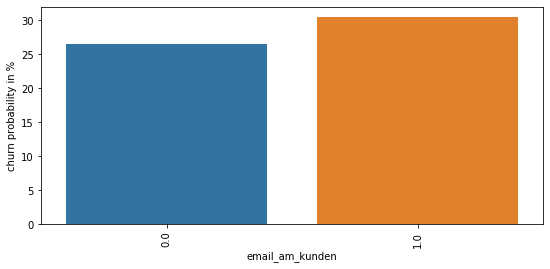

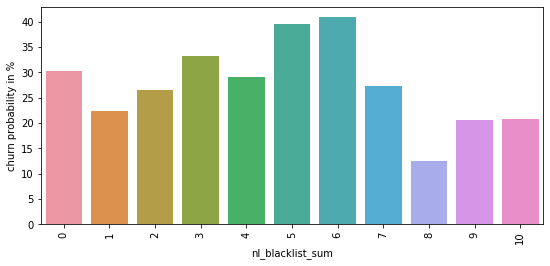

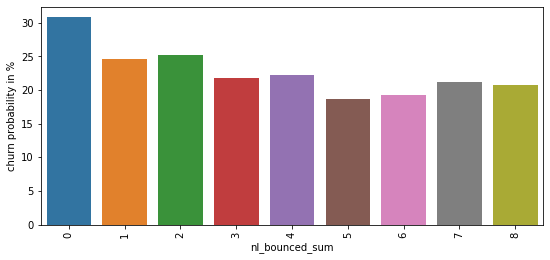

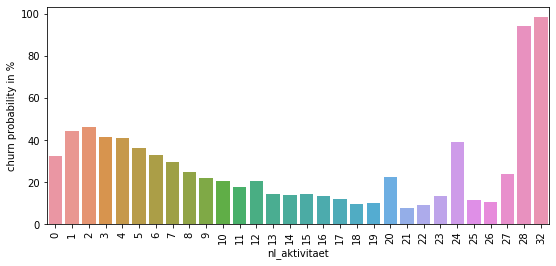

...

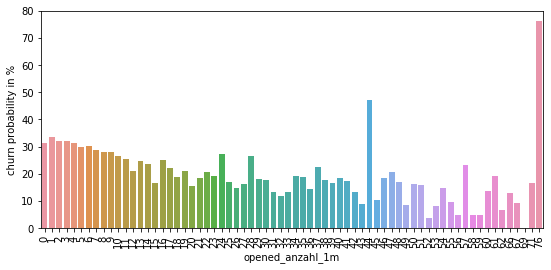

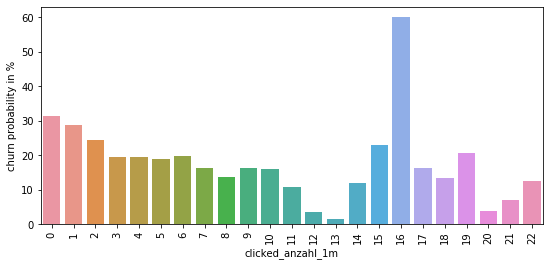

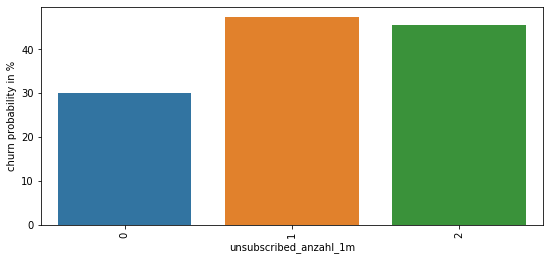

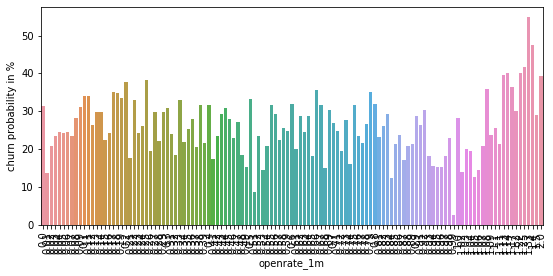

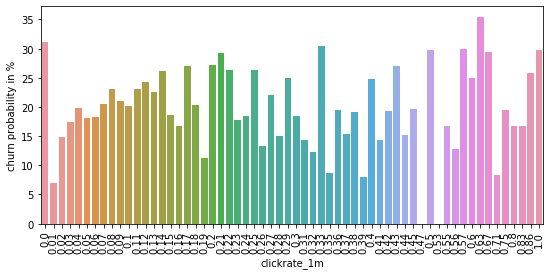

In [225]:
plot_list_mod = ['shop_kauf','email_am_kunden','nl_blacklist_sum','nl_bounced_sum','nl_aktivitaet','nl_sperrliste_sum',
           'received_anzahl_1m','opened_anzahl_1m','clicked_anzahl_1m','unsubscribed_anzahl_1m',
          'openrate_1m','clickrate_1m']
for i in plot_list_mod:
    df_b=df_a.groupby(i).agg({'churn_1': 'sum',
                'churn_0': 'sum', 'avg_churn': "mean"})
    #df_b.describe()

    df_b.columns = ['churn_1_sum', 'churn_0_sum','avg_churn_mean'] #["_".join(x) for x in df_b.columns.ravel()]

    df_b=df_b.reset_index()
    #df_b.head()

    df_b["q"]=(round(df_b["churn_1_sum"]/(df_b["churn_0_sum"]+df_b["churn_1_sum"]), 3))*100
    df_b=df_b.sort_values(by="q")
    df_b=df_b[(df_b['churn_1_sum']+df_b['churn_0_sum'])>20].sort_values(by="q")
    plt.subplots(figsize=(9,4))
    ax = sns.barplot(x=i, y="q", data=df_b, )
    ax.set(xlabel=i, ylabel='churn probability in %')

    ax.set_xticklabels(ax.get_xticklabels(), rotation=90)

Many of these variables are strongly dominated by the value zero. In general there is a trend to 
lower churn probability with increasing communication and activity counts.

## avg_churn

The variable avg_churn is an average churn probability for sub-categories of the variables 
lesedauer and zahlung_rhythmus_name. It has been determined based on the entire data set,
wchich means that we cannot use it for our analysis due to data leakage. It might be 
interesting to reconstruct this variable from the training data alone, or, even better, 
from a part of the data set that is not used for model building or evaluation.

Here we will show that the variable indeed has a strong correlation to the actual churn probability.

[Text(0, 0, '0.101208'),
 Text(0, 0, '0.103379'),
 Text(0, 0, '0.11484000000000001'),
 Text(0, 0, '0.12156800000000001'),
 Text(0, 0, '0.12488800000000001'),
 Text(0, 0, '0.125643'),
 Text(0, 0, '0.12598399999999998'),
 Text(0, 0, '0.127118'),
 Text(0, 0, '0.12754400000000002'),
 Text(0, 0, '0.127976'),
 Text(0, 0, '0.129905'),
 Text(0, 0, '0.130215'),
 Text(0, 0, '0.13224'),
 Text(0, 0, '0.133879'),
 Text(0, 0, '0.133921'),
 Text(0, 0, '0.13553800000000002'),
 Text(0, 0, '0.13556400000000002'),
 Text(0, 0, '0.137906'),
 Text(0, 0, '0.139551'),
 Text(0, 0, '0.140625'),
 Text(0, 0, '0.140822'),
 Text(0, 0, '0.140986'),
 Text(0, 0, '0.141768'),
 Text(0, 0, '0.14285699999999998'),
 Text(0, 0, '0.144796'),
 Text(0, 0, '0.146029'),
 Text(0, 0, '0.149819'),
 Text(0, 0, '0.151219'),
 Text(0, 0, '0.152838'),
 Text(0, 0, '0.155272'),
 Text(0, 0, '0.156626'),
 Text(0, 0, '0.1598'),
 Text(0, 0, '0.16080999999999998'),
 Text(0, 0, '0.16827999999999999'),
 Text(0, 0, '0.168975'),
 Text(0, 0, '0.172

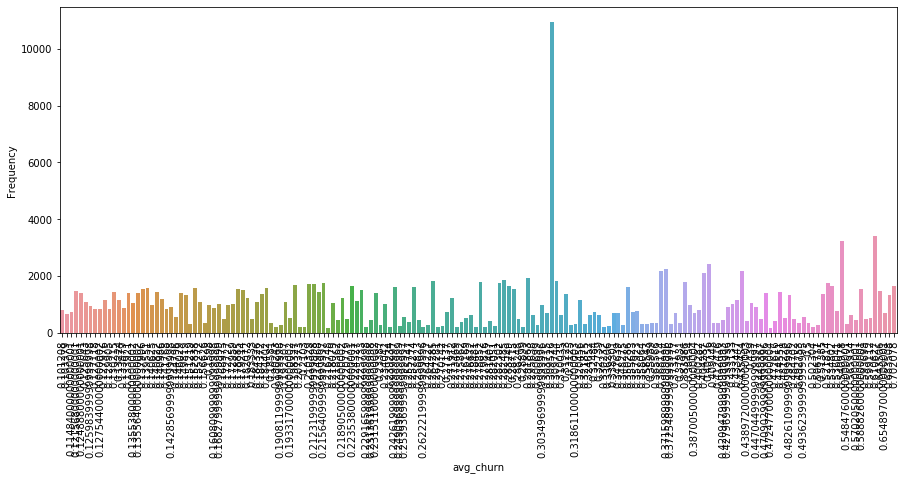

In [226]:
plt.subplots(figsize=(15,6))
ax = sns.countplot(x='avg_churn', data=df_a)
ax.set(xlabel='avg_churn', ylabel='Frequency')

ax.set_xticklabels(ax.get_xticklabels(), rotation=90)

[Text(0, 0, '0.101208'),
 Text(0, 0, '0.103379'),
 Text(0, 0, '0.11484000000000001'),
 Text(0, 0, '0.12156800000000001'),
 Text(0, 0, '0.12488800000000001'),
 Text(0, 0, '0.125643'),
 Text(0, 0, '0.12598399999999998'),
 Text(0, 0, '0.127118'),
 Text(0, 0, '0.12754400000000002'),
 Text(0, 0, '0.127976'),
 Text(0, 0, '0.129905'),
 Text(0, 0, '0.130215'),
 Text(0, 0, '0.13224'),
 Text(0, 0, '0.133879'),
 Text(0, 0, '0.133921'),
 Text(0, 0, '0.13553800000000002'),
 Text(0, 0, '0.13556400000000002'),
 Text(0, 0, '0.137906'),
 Text(0, 0, '0.139551'),
 Text(0, 0, '0.140625'),
 Text(0, 0, '0.140822'),
 Text(0, 0, '0.140986'),
 Text(0, 0, '0.141768'),
 Text(0, 0, '0.14285699999999998'),
 Text(0, 0, '0.144796'),
 Text(0, 0, '0.146029'),
 Text(0, 0, '0.149819'),
 Text(0, 0, '0.151219'),
 Text(0, 0, '0.152838'),
 Text(0, 0, '0.155272'),
 Text(0, 0, '0.156626'),
 Text(0, 0, '0.1598'),
 Text(0, 0, '0.16080999999999998'),
 Text(0, 0, '0.16827999999999999'),
 Text(0, 0, '0.168975'),
 Text(0, 0, '0.172

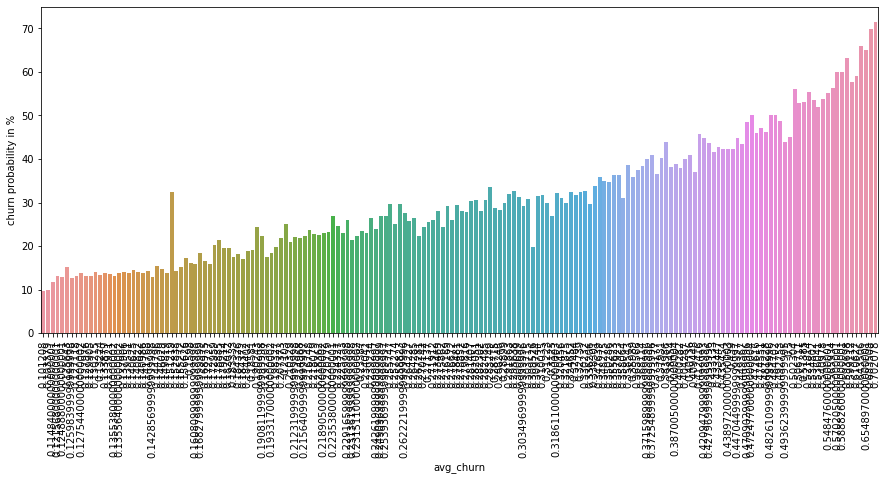

In [228]:

df_b=df_a.groupby('avg_churn').agg({'churn_1': 'sum',
                'churn_0': 'sum', 'avg_churn': "mean"})
#df_b.describe()

df_b.columns = ['churn_1_sum', 'churn_0_sum','avg_churn_mean'] #["_".join(x) for x in df_b.columns.ravel()]

df_b=df_b.reset_index()
#df_b.head()

df_b["q"]=(round(df_b["churn_1_sum"]/(df_b["churn_0_sum"]+df_b["churn_1_sum"]), 3))*100
df_b=df_b.sort_values(by="q")
df_b=df_b[(df_b['churn_1_sum']+df_b['churn_0_sum'])>20].sort_values(by="q")
plt.subplots(figsize=(15,6))
ax = sns.barplot(x='avg_churn', y="q", data=df_b, )
ax.set(xlabel='avg_churn', ylabel='churn probability in %')

ax.set_xticklabels(ax.get_xticklabels(), rotation=90)

# Data preprocessing

## Binning of abo_registrierung_min_year and nl_registrierung_min_year

The variables abo_registrierung_min_year and nl_registrierung_min_year should be turned into  dummy variables as 
they contain the artificial year 1900. abo_registrierung_min_year, however, contains so many years that it should 
be binned. We choose 13 bins such that the classes have somewhat comparable size: 

In [253]:
df2['abo_registrierung_min_year_binned']= df2['abo_registrierung_min_year'].apply(
    lambda x: 0 if x==1900 else x).apply(
    lambda x:1 if 1900 < x <=1996 else x).apply(
    lambda x: 2 if 1996 < x <= 2002 else x).apply(
    lambda x: 3 if 2002 < x <= 2007 else x).apply(
    lambda x: 4 if 2007 < x <=2010 else x).apply(
    lambda x: 5 if 2010 < x <= 2012 else x ).apply(
    lambda x : x-2007 if x>2012 else x)

In [254]:
df2['abo_registrierung_min_year_binned'].value_counts()

0     23630
11    22273
10    18574
9     14753
6     13488
8     12783
7     12322
5     11193
4     10638
3     10388
1      9148
12     8838
2      7017
Name: abo_registrierung_min_year_binned, dtype: int64

In [ ]:
For nl_registrierung_min_year, we choose 12 bins:

In [255]:
df2['nl_registrierung_min_year_binned']= df2['nl_registrierung_min_year'].apply(
    lambda x: 0 if x==1900 else x).apply(
    lambda x:1 if 1900 < x <=2005 else x).apply(
    lambda x: 2 if 2005 < x <= 2009 else x).apply(
    lambda x: 3 if 2009 < x <= 2011 else x).apply(
    lambda x : x-2008 if x>=2012 else x)

In [256]:
df2['nl_registrierung_min_year_binned'].value_counts()

9     21312
10    19653
2     17433
3     16022
8     14774
1     14030
7     14028
5     13859
6     13684
0     11808
4     10174
11     7567
12      701
Name: nl_registrierung_min_year_binned, dtype: int64

The binning has significantly increased the correlation with churn:

In [257]:
corr_matrix = df2.corr()
corr_matrix['churn']['nl_registrierung_min_year_binned']

0.17531381940359012

In [258]:
corr_matrix['churn']['nl_registrierung_min_year']

0.04726971769988933

In [259]:
corr_matrix['churn']['abo_registrierung_min_year_binned']

0.14284162337852638

In [260]:
corr_matrix['churn']['abo_registrierung_min_year']

-0.020355192151788278

We will drop the unbinned variables abo_registrierung_min_year and nl_registrierung_min_year in the next subsection.

## Dummy variables


Before we introduce dummy variables for the categorical features, we drop

    * ort 
    
    and the unbinned variables
    
    * abo_registrierung_min_year
    * nl_registrierung_min_year

In [263]:
df2=df2.drop(['ort','abo_registrierung_min_year', 'nl_registrierung_min_year'], axis=1)

**Categorical features**

Categorical features are the ones of type 'object' 
and several variables that have numerical values, but are nevertheless categorical:

In [265]:
# Creating list for categorical predictors/features 
cat_features = list(df2.columns[df2.dtypes==object])
# Extend the list by those categorical features that are already given in terms of numbers
cat_features.extend(['rechnungsmonat','metropole','studentenabo','unterbrechung','email_am_kunden',
       'zon_che_opt_in', 'zon_sit_opt_in', 'zon_zp_grey', 'zon_premium',
       'zon_boa', 'zon_kommentar', 'zon_sonstige', 'zon_zp_red',
       'zon_rawr', 'zon_community', 'zon_app_sonstige', 'zon_schach',
       'zon_blog_kommentare', 'zon_quiz','nl_zeitbrief', 'nl_zeitshop', 'nl_zeitverlag_hamburg',
       'nl_fdz_organisch','boa_reg', 'che_reg', 'sit_reg', 'sso_reg','abo_registrierung_min_year_binned', 
                     'nl_registrierung_min_year_binned',
                    ])
cat_features

['kanal',
 'objekt_name',
 'aboform_name',
 'zahlung_rhythmus_name',
 'zahlung_weg_name',
 'plz_1',
 'plz_2',
 'plz_3',
 'land_iso_code',
 'anrede',
 'titel',
 'rechnungsmonat',
 'metropole',
 'studentenabo',
 'unterbrechung',
 'email_am_kunden',
 'zon_che_opt_in',
 'zon_sit_opt_in',
 'zon_zp_grey',
 'zon_premium',
 'zon_boa',
 'zon_kommentar',
 'zon_sonstige',
 'zon_zp_red',
 'zon_rawr',
 'zon_community',
 'zon_app_sonstige',
 'zon_schach',
 'zon_blog_kommentare',
 'zon_quiz',
 'nl_zeitbrief',
 'nl_zeitshop',
 'nl_zeitverlag_hamburg',
 'nl_fdz_organisch',
 'boa_reg',
 'che_reg',
 'sit_reg',
 'sso_reg',
 'abo_registrierung_min_year_binned',
 'nl_registrierung_min_year_binned']

In [266]:
# Creating list for numerical features
num_features = list(df2.columns)
for i in cat_features:
    num_features.remove(i)
num_features.remove('churn')    

num_features

['lesedauer',
 'shop_kauf',
 'avg_churn',
 'cnt_abo',
 'cnt_abo_diezeit',
 'cnt_abo_diezeit_digital',
 'cnt_abo_magazin',
 'cnt_umwandlungsstatus2_dkey',
 'nl_blacklist_sum',
 'nl_bounced_sum',
 'nl_aktivitaet',
 'nl_sperrliste_sum',
 'nl_opt_in_sum',
 'received_anzahl_1w',
 'received_anzahl_1m',
 'received_anzahl_3m',
 'received_anzahl_6m',
 'opened_anzahl_1w',
 'opened_anzahl_1m',
 'opened_anzahl_3m',
 'openedanzahl_6m',
 'clicked_anzahl_1w',
 'clicked_anzahl_1m',
 'clicked_anzahl_3m',
 'clicked_anzahl_6m',
 'unsubscribed_anzahl_1w',
 'unsubscribed_anzahl_1m',
 'unsubscribed_anzahl_3m',
 'unsubscribed_anzahl_6m',
 'openrate_1w',
 'clickrate_1w',
 'openrate_1m',
 'clickrate_1m',
 'openrate_3m',
 'clickrate_3m',
 'received_anzahl_bestandskunden_1w',
 'received_anzahl_bestandskunden_1m',
 'received_anzahl_bestandskunden_3m',
 'received_anzahl_bestandskunden_6m',
 'opened_anzahl_bestandskunden_1w',
 'opened_anzahl_bestandskunden_1m',
 'opened_anzahl_bestandskunden_3m',
 'openedanzahl_bes

We do not the pipeline method for creating the dummies, as we would like to maintain maximum flexibility 
regarding the selection of features:

In [267]:
df2_d = df2
df2_d=pd.get_dummies(df2_d,columns=cat_features, drop_first=True)
df2_d.head()

,lesedauer,shop_kauf,avg_churn,cnt_abo,cnt_abo_diezeit,cnt_abo_diezeit_digital,cnt_abo_magazin,cnt_umwandlungsstatus2_dkey,nl_blacklist_sum,nl_bounced_sum,...,nl_registrierung_min_year_binned_3,nl_registrierung_min_year_binned_4,nl_registrierung_min_year_binned_5,nl_registrierung_min_year_binned_6,nl_registrierung_min_year_binned_7,nl_registrierung_min_year_binned_8,nl_registrierung_min_year_binned_9,nl_registrierung_min_year_binned_10,nl_registrierung_min_year_binned_11,nl_registrierung_min_year_binned_12
0,72,0,0.172959,0,0,0,0,0,0,0,...,0,0,1,0,0,0,0,0,0,0
1,70,0,0.309526,0,0,0,0,0,0,0,...,0,0,1,0,0,0,0,0,0,0
2,75,0,0.127118,0,0,0,0,0,0,0,...,0,0,1,0,0,0,0,0,0,0
3,78,0,0.114840,0,0,0,0,0,0,0,...,0,0,1,0,0,0,0,0,0,0
4,69,0,0.172727,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


## Splitting into target and predictor variables and test, validation and training set

In [268]:
# Define predictors and target variable
X = df2_d.drop('churn', axis=1)
y = df2_d['churn']
print(X.shape)
print(y.shape)

(175045, 1025)
(175045,)


To keep computing time short enough for parameter tunings, we will do many computations with a 
training and a validation set and use the slower cross validation with a pipeline only at a later step
to verify that no overfitting occurs. At the final stage, we will test our best models on a test set. To 
be able to do this, we carry out the following splitting:
    
    X -> X_train_cv, X_test 
    y -> y_train_cv, y_test
    
    X_train_cv -> X_train, X_val
    y_train_cv -> y_train, y_val
    


X_train and X_val will be separately scaled and used together with y_train and y_val to train and tune and 
evaluate models.   
    
The most interesting models will then be evaluated also with cross validation to check that no overfitting occurs.    
This will be done with X_train_cv, which will therefore be left unscaled and used together with y_train_cv 
for cross validation in a pipeline that also takes care of the scaling then. 

Only at the very end we test the best models also on the test data set X_test, y_test, which will remain 
untouched until then.


In [277]:
# Split into train/cross-validation and test set
X_train_cv, X_test, y_train_cv, y_test = train_test_split(X, y, stratify = y, test_size=0.2, random_state=7)

print(X_train_cv.shape)
print(y_train_cv.shape)
print(X_test.shape)
print(y_test.shape)

(140036, 1025)
(140036,)
(35009, 1025)
(35009,)


In [279]:
# Split into train and validation set
X_train, X_val, y_train, y_val = train_test_split(X_train_cv, y_train_cv, stratify = y_train_cv, test_size=0.2, random_state=7)

print(X_train.shape)
print(y_train.shape)
print(X_val.shape)
print(y_val.shape)

(112028, 1025)
(112028,)
(28008, 1025)
(28008,)


## Scaling of numerical features

In [280]:
#scaler = StandardScaler()
scaler = MinMaxScaler()
scaler.fit(X_train[num_features])
X_train_scaled = X_train
X_train_scaled[num_features] = scaler.transform(X_train[num_features])
X_val_scaled = X_val
X_val_scaled[num_features] = scaler.transform(X_val[num_features])

/Users/marcozagermann/opt/anaconda3/envs/nf/lib/python3.6/site-packages/ipykernel_launcher.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  """
/Users/marcozagermann/opt/anaconda3/envs/nf/lib/python3.6/site-packages/pandas/core/indexing.py:543: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self.obj[item] = s
/Users/marcozagermann/opt/anaconda3/envs/nf/lib/python3.6/site-packages/ipykernel_launcher.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = va

# Feature selection

Even after removing the variable ort, we have about 1000 features after introducing dummy variables 
(without plz_3 it would still be about 300 features).

Many of these features are not particularly relevant, so we will make a strong selection to reduce the number of
features to the most relevant ones. We will limit ourselves to models with up to 
30 features. 

We use three methods to identify particularly relevant features:
    
    * The correlation with the target variable churn
    * SelectKBest
    * Feature importances from random forests
    
This will result in somewhat different lists of most relevant features, and we will use machine learning models
to decide on the best feature set. 

The best feature sets will then be used for tuning models.

## Method a: Selecting features according to correlation with churn

In order to not mess around with the validation or test data, we use the (scaled) training data (with all categorical variables turned into dummies)
to compute the correlations with churn. To this end, we have to merge X_train_scaled and y_train back into one
DataFrame df_train_scaled:

In [284]:
df_train_scaled = pd.concat([X_train_scaled,y_train], axis = 1)

Next, we compute the absolute values of the correlations of all variables with churn and rank them:

In [285]:
corr_matrix = df_train_scaled.corr()

In [286]:
df_corr_churn=pd.DataFrame(corr_matrix['churn'])

In [292]:
df_corr_churn['abs_corr'] = df_corr_churn['churn'].apply(np.abs)

In [312]:
df_corr_churn['abs_corr'].sort_values(ascending=False).head(47)

churn                                   1.000000
avg_churn                               0.313659
lesedauer                               0.233346
liefer_beginn_num                       0.230801
zahlung_weg_name_Rechnung               0.204864
nl_aktivitaet                           0.160512
zahlung_rhythmus_name_jährlich          0.153934
zahlung_rhythmus_name_halbjährlich      0.138722
abo_registrierung_min_year_binned_11    0.134731
nl_registrierung_min_year_binned_10     0.129125
aboform_name_Negative Option            0.121799
abo_registrierung_min_year_binned_12    0.113926
objekt_name_ZEIT Digital                0.109348
nl_zeitshop_2                           0.104703
abo_registrierung_min_year_binned_1     0.104582
studentenabo_1                          0.103487
nl_registrierung_min_year_binned_11     0.102317
cnt_umwandlungsstatus2_dkey             0.101711
nl_registrierung_min_year_binned_1      0.093021
rechnungsmonat_1                        0.087409
kanal_Mailings      

We extract the list of all features with an absolute value of the correlation with churn of at least 0.06, removing churn (our target variable) and avg_churn (possible data leakage):

In [480]:
list_a =list(df_corr_churn[df_corr_churn.abs_corr>0.06]['abs_corr'].sort_values(ascending=False).index)

In [481]:
list_a.remove('churn')
list_a.remove('avg_churn')
list_a

['lesedauer',
 'liefer_beginn_num',
 'zahlung_weg_name_Rechnung',
 'nl_aktivitaet',
 'zahlung_rhythmus_name_jährlich',
 'zahlung_rhythmus_name_halbjährlich',
 'abo_registrierung_min_year_binned_11',
 'nl_registrierung_min_year_binned_10',
 'aboform_name_Negative Option',
 'abo_registrierung_min_year_binned_12',
 'objekt_name_ZEIT Digital',
 'nl_zeitshop_2',
 'abo_registrierung_min_year_binned_1',
 'studentenabo_1',
 'nl_registrierung_min_year_binned_11',
 'cnt_umwandlungsstatus2_dkey',
 'nl_registrierung_min_year_binned_1',
 'rechnungsmonat_1',
 'kanal_Mailings',
 'abo_registrierung_min_year_binned_2',
 'received_anzahl_1m',
 'received_anzahl_3m',
 'received_anzahl_6m',
 'openedanzahl_6m',
 'opened_anzahl_3m',
 'received_anzahl_1w',
 'opened_anzahl_1m',
 'abo_registrierung_min_year_binned_3',
 'shop_kauf',
 'objekt_name_DIE ZEIT - CHRIST & WELT',
 'cnt_abo_magazin',
 'nl_registrierung_min_year_binned_2',
 'plz_1_xx',
 'plz_2_xx',
 'plz_3_xx',
 'land_iso_code_DE']

We extract the list with the best 20 features (l20a) and the list with the best 30 features (l30a):

**Model 20a**

In [315]:
l20a = ['lesedauer', 'liefer_beginn_num',
       'zahlung_weg_name_Rechnung', 'nl_aktivitaet',
       'zahlung_rhythmus_name_jährlich', 'zahlung_rhythmus_name_halbjährlich',
       'abo_registrierung_min_year_binned_11',
       'nl_registrierung_min_year_binned_10', 'aboform_name_Negative Option',
       'abo_registrierung_min_year_binned_12', 'objekt_name_ZEIT Digital',
       'nl_zeitshop_2', 'abo_registrierung_min_year_binned_1',
       'studentenabo_1', 'nl_registrierung_min_year_binned_11',
       'cnt_umwandlungsstatus2_dkey', 'nl_registrierung_min_year_binned_1',
       'rechnungsmonat_1', 'kanal_Mailings',
       'abo_registrierung_min_year_binned_2']

**Model 30a**

In [316]:
l30a = ['lesedauer', 'liefer_beginn_num',
       'zahlung_weg_name_Rechnung', 'nl_aktivitaet',
       'zahlung_rhythmus_name_jährlich', 'zahlung_rhythmus_name_halbjährlich',
       'abo_registrierung_min_year_binned_11',
       'nl_registrierung_min_year_binned_10', 'aboform_name_Negative Option',
       'abo_registrierung_min_year_binned_12', 'objekt_name_ZEIT Digital',
       'nl_zeitshop_2', 'abo_registrierung_min_year_binned_1',
       'studentenabo_1', 'nl_registrierung_min_year_binned_11',
       'cnt_umwandlungsstatus2_dkey', 'nl_registrierung_min_year_binned_1',
       'rechnungsmonat_1', 'kanal_Mailings',
       'abo_registrierung_min_year_binned_2', 'received_anzahl_1m',
       'received_anzahl_3m', 'received_anzahl_6m', 'openedanzahl_6m',
       'opened_anzahl_3m', 'received_anzahl_1w', 'opened_anzahl_1m',
       'abo_registrierung_min_year_binned_3', 'shop_kauf',
       'objekt_name_DIE ZEIT - CHRIST & WELT']

In [317]:
len(l20a)

20

In [346]:
len(l30a)

30

For l20a we check whether some of the variables in the list are highly correlated:

In [347]:
corr_20a = X_train_scaled[l20a].corr()

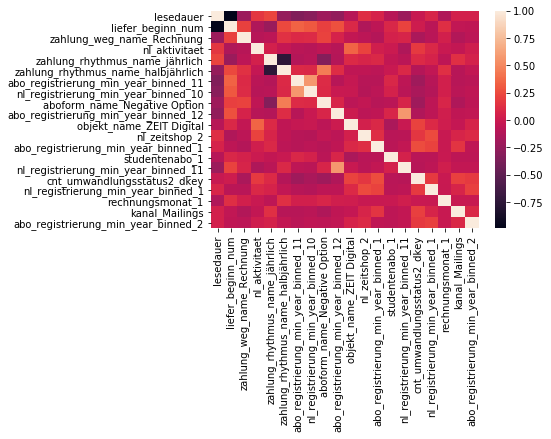

In [348]:
ax = sns.heatmap(corr_20a)

Pairs of variables with correlation above 0.5 can be extracted:

In [356]:
for i in range(20):
    for j in range(i):
        if np.abs(corr_20a.iloc[i,j])>0.5 and i!=j:
            print(f"{l20a[i]} - {l20a[j]}: {corr_20a.iloc[i,j]}")
        

liefer_beginn_num - lesedauer: -0.9876079798830069
zahlung_rhythmus_name_halbjährlich - zahlung_rhythmus_name_jährlich: -0.7527919669404999
nl_registrierung_min_year_binned_10 - abo_registrierung_min_year_binned_11: 0.5781227609948898
nl_registrierung_min_year_binned_11 - abo_registrierung_min_year_binned_12: 0.5796837291453427


We make two more feature lists l20a2 and l20a3 by removing the most correlated features from l20a and replace them by the next higher ranked features in the list list_a such that the features in the resulting list are less correlated with one another.

To be more precise, the new list l20a2 will contain the 20 best features that have mutual correlation below 0.6, whereas l20a3 will contain the best 20 features with mutual correlation below 0.5.
    
    

**Model 20a2**

In [491]:
l20a2 = [list_a[0]]

In [492]:
k=0
corr_a= X_train_scaled[list_a].corr()

for i in list_a[1:]:
    for j in l20a2:
        if np.abs(corr_a.loc[i,j])>=0.6:
            k= 1
            break
    if k==0:        
        l20a2.append(i)
    k=0    
    if len(l20a2)==20:
        break

    
            

In [493]:
l20a2

['lesedauer',
 'zahlung_weg_name_Rechnung',
 'nl_aktivitaet',
 'zahlung_rhythmus_name_jährlich',
 'abo_registrierung_min_year_binned_11',
 'nl_registrierung_min_year_binned_10',
 'aboform_name_Negative Option',
 'abo_registrierung_min_year_binned_12',
 'objekt_name_ZEIT Digital',
 'nl_zeitshop_2',
 'abo_registrierung_min_year_binned_1',
 'studentenabo_1',
 'nl_registrierung_min_year_binned_11',
 'cnt_umwandlungsstatus2_dkey',
 'nl_registrierung_min_year_binned_1',
 'rechnungsmonat_1',
 'kanal_Mailings',
 'abo_registrierung_min_year_binned_2',
 'received_anzahl_1m',
 'openedanzahl_6m']

Check that all correlations are now below 0.6:

In [518]:
corr_20a2 = X_train_scaled[l20a2].corr()

In [496]:
for i in range(20):
    for j in range(i):
        if np.abs(corr_20a2.iloc[i,j])>0.5 and i!=j:
            print(f"{l20a2[i]} - {l20a2[j]}: {corr_20a2.iloc[i,j]}")
        

nl_registrierung_min_year_binned_10 - abo_registrierung_min_year_binned_11: 0.5781227609948898
nl_registrierung_min_year_binned_11 - abo_registrierung_min_year_binned_12: 0.5796837291453427
received_anzahl_1m - nl_aktivitaet: 0.5218422176646539
openedanzahl_6m - received_anzahl_1m: 0.5958296788549058


**Model 20a3**

In [497]:
l20a3 = [list_a[0]]

In [498]:
k=0
corr_a= X_train_scaled[list_a].corr()

for i in list_a[1:]:
    for j in l20a3:
        if np.abs(corr_a.loc[i,j])>=0.5:
            k= 1
            break
    if k==0:        
        l20a3.append(i)
    k=0    
    if len(l20a3)==20:
        break

    

In [499]:
l20a3

['lesedauer',
 'zahlung_weg_name_Rechnung',
 'nl_aktivitaet',
 'zahlung_rhythmus_name_jährlich',
 'abo_registrierung_min_year_binned_11',
 'aboform_name_Negative Option',
 'abo_registrierung_min_year_binned_12',
 'objekt_name_ZEIT Digital',
 'nl_zeitshop_2',
 'abo_registrierung_min_year_binned_1',
 'studentenabo_1',
 'cnt_umwandlungsstatus2_dkey',
 'nl_registrierung_min_year_binned_1',
 'rechnungsmonat_1',
 'kanal_Mailings',
 'abo_registrierung_min_year_binned_2',
 'openedanzahl_6m',
 'abo_registrierung_min_year_binned_3',
 'shop_kauf',
 'objekt_name_DIE ZEIT - CHRIST & WELT']

Check that all correlationa are now below 0.5:

In [500]:
corr_20a3 = X_train_scaled[l20a3].corr()

In [501]:
for i in range(20):
    for j in range(i):
        if np.abs(corr_20a3.iloc[i,j])>0.5 and i!=j:
            print(f"{l20a3[i]} - {l20a3[j]}: {corr_20a3.iloc[i,j]}")
        

**Summary**

**Model 20a:**  Best 20 features according to correlation with churn
    
**Model 30a:**  Best 30 features according to correlation with churn
    
**Model 20a2:** Best 20 features according to correlation with churn with less than correlation 0.6 with one another

**Model 20a3:** Best 20 features according to correlation with churn with less than correlation 0.5 with one another

## Method b: SelectKBest

We next use the module SelectKBest to extract the best 20 and the best 30 features.

In [504]:
from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import chi2
from sklearn.feature_selection import f_classif
bestfeatures = SelectKBest(score_func = chi2,
                           k=47)
fit = bestfeatures.fit(X_train_scaled,y_train)
dfscores = pd.DataFrame(fit.scores_)
dfcolumns=pd.DataFrame(X_train_scaled.columns)
featureScores = pd.concat([dfcolumns,dfscores],axis=1)
featureScores.columns = ['Specs','Score']
print(featureScores.nlargest(47,'Score'))

                                      Specs        Score
146               zahlung_weg_name_Rechnung  2563.139820
2                                 avg_churn  1919.814251
1011   abo_registrierung_min_year_binned_11  1775.414181
1022    nl_registrierung_min_year_binned_10  1659.388200
139      zahlung_rhythmus_name_halbjährlich  1636.462395
1012   abo_registrierung_min_year_binned_12  1381.308983
1001    abo_registrierung_min_year_binned_1  1161.165881
1023    nl_registrierung_min_year_binned_11  1122.685787
136            aboform_name_Negative Option  1105.382368
993                           nl_zeitshop_2  1068.744876
959                          studentenabo_1  1065.079259
0                                 lesedauer   992.870094
140          zahlung_rhythmus_name_jährlich   952.966600
1013     nl_registrierung_min_year_binned_1   891.424473
134                objekt_name_ZEIT Digital   780.677492
957                        rechnungsmonat_1   771.023053
123                       liefe

In [505]:
list_b= featureScores.nlargest(47,'Score')['Specs'].tolist()

In [506]:
list_b.remove('avg_churn')


In [507]:
list_b

['zahlung_weg_name_Rechnung',
 'abo_registrierung_min_year_binned_11',
 'nl_registrierung_min_year_binned_10',
 'zahlung_rhythmus_name_halbjährlich',
 'abo_registrierung_min_year_binned_12',
 'abo_registrierung_min_year_binned_1',
 'nl_registrierung_min_year_binned_11',
 'aboform_name_Negative Option',
 'nl_zeitshop_2',
 'studentenabo_1',
 'lesedauer',
 'zahlung_rhythmus_name_jährlich',
 'nl_registrierung_min_year_binned_1',
 'objekt_name_ZEIT Digital',
 'rechnungsmonat_1',
 'liefer_beginn_num',
 'abo_registrierung_min_year_binned_2',
 'kanal_Mailings',
 'abo_registrierung_min_year_binned_3',
 'objekt_name_DIE ZEIT - CHRIST & WELT',
 'nl_registrierung_min_year_binned_2',
 'abo_registrierung_min_year_binned_6',
 'plz_1_xx',
 'plz_2_xx',
 'plz_3_xx',
 'cnt_umwandlungsstatus2_dkey',
 'nl_registrierung_min_year_binned_9',
 'abo_registrierung_min_year_binned_4',
 'abo_registrierung_min_year_binned_10',
 'nl_aktivitaet',
 'zahlung_rhythmus_name_vierteljährlich',
 'aboform_name_Geschenkabo',


**Model 20b**

In [508]:
l20b = ['zahlung_weg_name_Rechnung',
 'abo_registrierung_min_year_binned_11',
 'nl_registrierung_min_year_binned_10',
 'zahlung_rhythmus_name_halbjährlich',
 'abo_registrierung_min_year_binned_12',
 'abo_registrierung_min_year_binned_1',
 'nl_registrierung_min_year_binned_11',
 'aboform_name_Negative Option',
 'nl_zeitshop_2',
 'studentenabo_1',
 'lesedauer',
 'zahlung_rhythmus_name_jährlich',
 'nl_registrierung_min_year_binned_1',
 'objekt_name_ZEIT Digital',
 'rechnungsmonat_1',
 'liefer_beginn_num',
 'abo_registrierung_min_year_binned_2',
 'kanal_Mailings',
 'abo_registrierung_min_year_binned_3',
 'objekt_name_DIE ZEIT - CHRIST & WELT']

**Model 30b**

In [509]:
l30b = ['zahlung_weg_name_Rechnung',
 'abo_registrierung_min_year_binned_11',
 'nl_registrierung_min_year_binned_10',
 'zahlung_rhythmus_name_halbjährlich',
 'abo_registrierung_min_year_binned_12',
 'abo_registrierung_min_year_binned_1',
 'nl_registrierung_min_year_binned_11',
 'aboform_name_Negative Option',
 'nl_zeitshop_2',
 'studentenabo_1',
 'lesedauer',
 'zahlung_rhythmus_name_jährlich',
 'nl_registrierung_min_year_binned_1',
 'objekt_name_ZEIT Digital',
 'rechnungsmonat_1',
 'liefer_beginn_num',
 'abo_registrierung_min_year_binned_2',
 'kanal_Mailings',
 'abo_registrierung_min_year_binned_3',
 'objekt_name_DIE ZEIT - CHRIST & WELT',
 'nl_registrierung_min_year_binned_2',
 'abo_registrierung_min_year_binned_6',
 'plz_1_xx',
 'cnt_umwandlungsstatus2_dkey',
 'nl_registrierung_min_year_binned_9',
 'abo_registrierung_min_year_binned_4',
 'abo_registrierung_min_year_binned_10',
 'nl_aktivitaet',
 'zahlung_rhythmus_name_vierteljährlich',
 'aboform_name_Geschenkabo']

In [ ]:
We again check the mutual correlations in l20b:

In [510]:
corr_20b = X_train_scaled[l20b].corr()

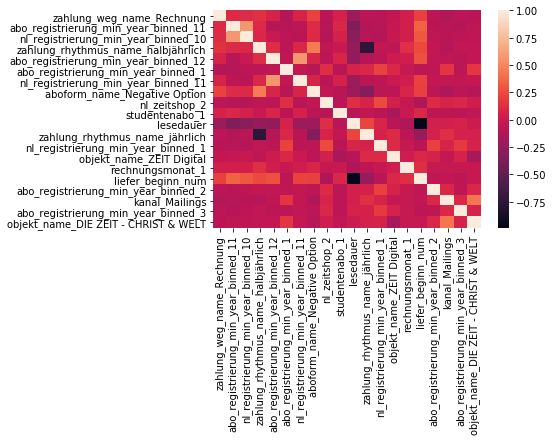

In [511]:
ax = sns.heatmap(corr_20b)

In [512]:
for i in range(len(l20b)):
    for j in range(i):
        if np.abs(corr_20b.iloc[i,j])>0.5 and i!=j:
            print(f"{l20b[i]} - {l20b[j]}: {corr_20b.iloc[i,j]}")
        

nl_registrierung_min_year_binned_10 - abo_registrierung_min_year_binned_11: 0.5781227609948898
nl_registrierung_min_year_binned_11 - abo_registrierung_min_year_binned_12: 0.5796837291453427
zahlung_rhythmus_name_jährlich - zahlung_rhythmus_name_halbjährlich: -0.7527919669404999
liefer_beginn_num - lesedauer: -0.9876079798830069


Again, we define two new feature sets, l20b2 and l20b3, where the strongly correlated features are 
replaced by the next higher ones on the list list_b

**Model 20b2**

In [522]:
l20b2 = [list_b[0]]

In [523]:
k=0
corr_b= X_train_scaled[list_b].corr()

for i in list_b[1:]:
    for j in l20b2:
        if np.abs(corr_b.loc[i,j])>=0.6:
            k= 1
            break
    if k==0:        
        l20b2.append(i)
    k=0    
    if len(l20b2)==20:
        break

    

In [524]:
l20b2

['zahlung_weg_name_Rechnung',
 'abo_registrierung_min_year_binned_11',
 'nl_registrierung_min_year_binned_10',
 'zahlung_rhythmus_name_halbjährlich',
 'abo_registrierung_min_year_binned_12',
 'abo_registrierung_min_year_binned_1',
 'nl_registrierung_min_year_binned_11',
 'aboform_name_Negative Option',
 'nl_zeitshop_2',
 'studentenabo_1',
 'lesedauer',
 'nl_registrierung_min_year_binned_1',
 'objekt_name_ZEIT Digital',
 'rechnungsmonat_1',
 'abo_registrierung_min_year_binned_2',
 'kanal_Mailings',
 'abo_registrierung_min_year_binned_3',
 'objekt_name_DIE ZEIT - CHRIST & WELT',
 'nl_registrierung_min_year_binned_2',
 'abo_registrierung_min_year_binned_6']

Check that all correlations are below 0.6:

In [525]:
corr_20b2 = X_train_scaled[l20b2].corr()

In [526]:
for i in range(20):
    for j in range(i):
        if np.abs(corr_20b2.iloc[i,j])>0.5 and i!=j:
            print(f"{l20b2[i]} - {l20b2[j]}: {corr_20b2.iloc[i,j]}")
        

nl_registrierung_min_year_binned_10 - abo_registrierung_min_year_binned_11: 0.5781227609948898
nl_registrierung_min_year_binned_11 - abo_registrierung_min_year_binned_12: 0.5796837291453427


**Model 20b3**

In [530]:
l20b3 = [list_b[0]]

In [531]:
k=0
corr_b= X_train_scaled[list_b].corr()

for i in list_b[1:]:
    for j in l20b3:
        if np.abs(corr_b.loc[i,j])>=0.5:
            k= 1
            break
    if k==0:        
        l20b3.append(i)
    k=0    
    if len(l20b3)==20:
        break

    

In [532]:
l20b3

['zahlung_weg_name_Rechnung',
 'abo_registrierung_min_year_binned_11',
 'zahlung_rhythmus_name_halbjährlich',
 'abo_registrierung_min_year_binned_12',
 'abo_registrierung_min_year_binned_1',
 'aboform_name_Negative Option',
 'nl_zeitshop_2',
 'studentenabo_1',
 'lesedauer',
 'nl_registrierung_min_year_binned_1',
 'objekt_name_ZEIT Digital',
 'rechnungsmonat_1',
 'abo_registrierung_min_year_binned_2',
 'kanal_Mailings',
 'abo_registrierung_min_year_binned_3',
 'objekt_name_DIE ZEIT - CHRIST & WELT',
 'nl_registrierung_min_year_binned_2',
 'abo_registrierung_min_year_binned_6',
 'plz_1_xx',
 'cnt_umwandlungsstatus2_dkey']

Check that all correlations are below 0.5:

In [533]:
corr_20b3 = X_train_scaled[l20b3].corr()

In [534]:
for i in range(20):
    for j in range(i):
        if np.abs(corr_20b3.iloc[i,j])>0.5 and i!=j:
            print(f"{l20b3[i]} - {l20b3[j]}: {corr_20b3.iloc[i,j]}")
        

**Summary**

**Model 20b:**  Best 20 features according to SelectKBest
    
**Model 30b:**  Best 30 features according to SelectKBest
    
**Model 20b2:** Best 20 features according to SelectKBest with less than correlation 0.6 with one another

**Model 20b3:** Best 20 features according to SelectKBest with less than correlation 0.5 with one another

## Method c: feature_importances_

[0.02415297 0.00386577 0.03294509 ... 0.00578864 0.00365059 0.00076602]


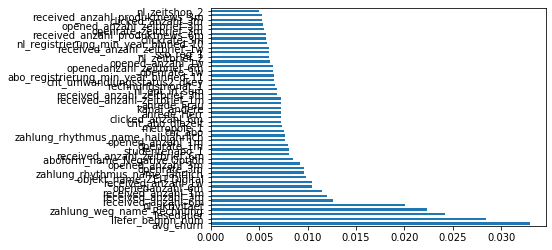

In [681]:
from sklearn.ensemble import ExtraTreesClassifier
import matplotlib.pyplot as plt
model_x = ExtraTreesClassifier(random_state=7)
model_x.fit(X_train_scaled,y_train)
print(model_x.feature_importances_)
feat_importances = pd.Series(model_x.feature_importances_,index=X_train_scaled.columns)
feat_importances.nlargest(47).plot(kind='barh')
plt.show()

In [682]:
feat_importances.nlargest(47)

avg_churn                               0.032945
liefer_beginn_num                       0.028396
lesedauer                               0.024153
zahlung_weg_name_Rechnung               0.022332
nl_aktivitaet                           0.020056
received_anzahl_6m                      0.012671
received_anzahl_3m                      0.012054
received_anzahl_1m                      0.011482
openedanzahl_6m                         0.010470
received_anzahl_1w                      0.010459
objekt_name_ZEIT Digital                0.009847
zahlung_rhythmus_name_jährlich          0.009643
openrate_3m                             0.009579
opened_anzahl_3m                        0.009257
aboform_name_Negative Option            0.008535
received_anzahl_zeitbrief_6m            0.008128
studentenabo_1                          0.008032
openrate_1m                             0.007927
opened_anzahl_1m                        0.007715
zahlung_rhythmus_name_halbjährlich      0.007703
cnt_abo             

In [683]:
fidf = pd.DataFrame(feat_importances.nlargest(47))

In [684]:
list_c = list(fidf.T.columns)

In [685]:
list_c.remove('avg_churn')

In [686]:
list_c

['liefer_beginn_num',
 'lesedauer',
 'zahlung_weg_name_Rechnung',
 'nl_aktivitaet',
 'received_anzahl_6m',
 'received_anzahl_3m',
 'received_anzahl_1m',
 'openedanzahl_6m',
 'received_anzahl_1w',
 'objekt_name_ZEIT Digital',
 'zahlung_rhythmus_name_jährlich',
 'openrate_3m',
 'opened_anzahl_3m',
 'aboform_name_Negative Option',
 'received_anzahl_zeitbrief_6m',
 'studentenabo_1',
 'openrate_1m',
 'opened_anzahl_1m',
 'zahlung_rhythmus_name_halbjährlich',
 'cnt_abo',
 'metropole_1',
 'cnt_abo_diezeit',
 'clicked_anzahl_6m',
 'anrede_Herr',
 'kanal_andere',
 'anrede_Frau',
 'received_anzahl_zeitbrief_1m',
 'received_anzahl_zeitbrief_3m',
 'nl_opt_in_sum',
 'rechnungsmonat_1',
 'cnt_umwandlungsstatus2_dkey',
 'abo_registrierung_min_year_binned_11',
 'openrate_1w',
 'openedanzahl_zeitbrief_6m',
 'opened_anzahl_1w',
 'nl_zeitbrief_2',
 'sso_reg_1',
 'received_anzahl_zeitbrief_1w',
 'nl_registrierung_min_year_binned_10',
 'clickrate_3m',
 'received_anzahl_produktnews_6m',
 'openrate_zeitbrief

**Model 20c** 

In [687]:
l20c = ['liefer_beginn_num', 'lesedauer',
       'zahlung_weg_name_Rechnung', 'nl_aktivitaet', 'received_anzahl_6m',
       'received_anzahl_3m', 'received_anzahl_1m', 'openedanzahl_6m',
       'received_anzahl_1w', 'openrate_3m', 'objekt_name_ZEIT Digital',
       'opened_anzahl_3m', 'zahlung_rhythmus_name_jährlich',
       'aboform_name_Negative Option', 'received_anzahl_zeitbrief_6m',
       'openrate_1m', 'studentenabo_1', 'opened_anzahl_1m',
       'abo_registrierung_min_year_binned_11', 'cnt_abo']

**Model 30c**

In [688]:
l30c = ['liefer_beginn_num', 'lesedauer',
       'zahlung_weg_name_Rechnung', 'nl_aktivitaet', 'received_anzahl_6m',
       'received_anzahl_3m', 'received_anzahl_1m', 'openedanzahl_6m',
       'received_anzahl_1w', 'openrate_3m', 'objekt_name_ZEIT Digital',
       'opened_anzahl_3m', 'zahlung_rhythmus_name_jährlich',
       'aboform_name_Negative Option', 'received_anzahl_zeitbrief_6m',
       'openrate_1m', 'studentenabo_1', 'opened_anzahl_1m',
       'abo_registrierung_min_year_binned_11', 'cnt_abo', 'metropole_1',
       'anrede_Frau', 'zahlung_rhythmus_name_halbjährlich', 'anrede_Herr',
       'received_anzahl_zeitbrief_3m', 'clicked_anzahl_6m', 'cnt_abo_diezeit',
       'received_anzahl_zeitbrief_1m', 'kanal_andere',
       'cnt_umwandlungsstatus2_dkey']

In [689]:
corr_20c = X_train_scaled[l20c].corr()

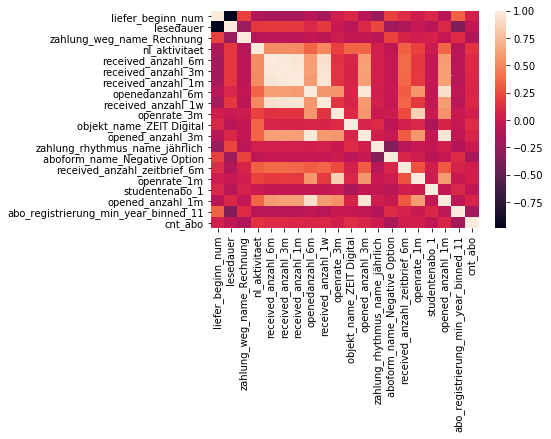

In [690]:
ax = sns.heatmap(corr_20c)

Obviously, there are many strongly correlated features. We list explicitly all correlations of at least 0.5:

In [691]:
for i in range(len(l20c)):
    for j in range(i):
        if np.abs(corr_20c.iloc[i,j])>0.5 and i!=j:
            print(f"{l20c[i]} - {l20c[j]}: {corr_20c.iloc[i,j]}")

lesedauer - liefer_beginn_num: -0.9876079798830069
received_anzahl_6m - nl_aktivitaet: 0.5325565869888792
received_anzahl_3m - nl_aktivitaet: 0.5270908144248243
received_anzahl_3m - received_anzahl_6m: 0.9917130011888475
received_anzahl_1m - nl_aktivitaet: 0.5218422176646539
received_anzahl_1m - received_anzahl_6m: 0.9672789471842931
received_anzahl_1m - received_anzahl_3m: 0.9838818724134486
openedanzahl_6m - received_anzahl_6m: 0.6093183980677979
openedanzahl_6m - received_anzahl_3m: 0.6092693201600214
openedanzahl_6m - received_anzahl_1m: 0.5958296788549058
received_anzahl_1w - nl_aktivitaet: 0.5091364029197484
received_anzahl_1w - received_anzahl_6m: 0.9385833980340984
received_anzahl_1w - received_anzahl_3m: 0.9539375910445584
received_anzahl_1w - received_anzahl_1m: 0.9737533353202837
received_anzahl_1w - openedanzahl_6m: 0.578131069361102
openrate_3m - openedanzahl_6m: 0.568675677391499
opened_anzahl_3m - received_anzahl_6m: 0.6057146695735084
opened_anzahl_3m - received_anzahl_

We again create two new feature lists l20c2 and l20c3, 
where the correlations are limited to values below 0.6 and 0.5, respectiuvely.

**Model 20c2**

In [692]:
l20c2 = [list_c[0]]

In [693]:
k=0
corr_c= X_train_scaled[list_c].corr()
#np.abs(corr_c.iloc[0,1])

for i in list_c[1:]:
    for j in l20c2:
        if np.abs(corr_c.loc[i,j])>=0.6:
            k= 1
            break
    if k==0:        
        l20c2.append(i)
    k=0    
    if len(l20c2)==20:
        break

    
            

In [694]:
l20c2

['liefer_beginn_num',
 'zahlung_weg_name_Rechnung',
 'nl_aktivitaet',
 'received_anzahl_6m',
 'objekt_name_ZEIT Digital',
 'zahlung_rhythmus_name_jährlich',
 'openrate_3m',
 'aboform_name_Negative Option',
 'received_anzahl_zeitbrief_6m',
 'studentenabo_1',
 'opened_anzahl_1m',
 'cnt_abo',
 'metropole_1',
 'clicked_anzahl_6m',
 'anrede_Herr',
 'kanal_andere',
 'nl_opt_in_sum',
 'rechnungsmonat_1',
 'abo_registrierung_min_year_binned_11',
 'sso_reg_1']

Check that no correlations are 0.6 or more:

In [695]:
corr_20c2 = X_train_scaled[l20c2].corr()

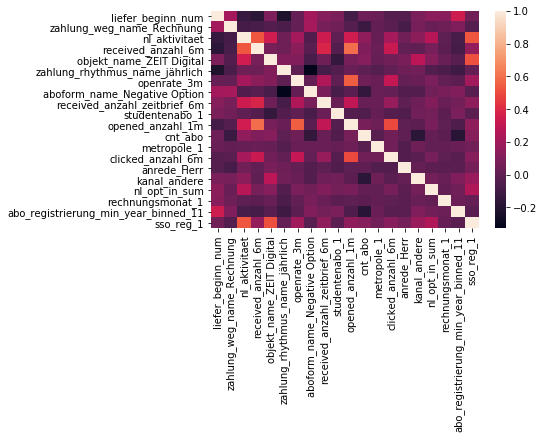

In [696]:
ax = sns.heatmap(corr_20c2)

In [697]:
for i in range(len(l20c2)):
    for j in range(i):
        if np.abs(corr_20c2.iloc[i,j])>0.5 and i!=j:
            print(f"{l20c2[i]} - {l20c2[j]}: {corr_20c2.iloc[i,j]}")

received_anzahl_6m - nl_aktivitaet: 0.5325565869888792
opened_anzahl_1m - received_anzahl_6m: 0.5914551632429297
opened_anzahl_1m - openrate_3m: 0.5524442863273955
sso_reg_1 - nl_aktivitaet: 0.5316663186851311
sso_reg_1 - objekt_name_ZEIT Digital: 0.514821244565678


**Model 20c3**

In [698]:
l20c3 = [list_c[0]]

In [699]:
k=0
corr_c= X_train_scaled[list_c].corr()
#np.abs(corr_c.iloc[0,1])

for i in list_c[1:]:
    for j in l20c3:
        if np.abs(corr_c.loc[i,j])>=0.5:
            k= 1
            break
    if k==0:        
        l20c3.append(i)
    k=0    
    if len(l20c3)==20:
        break

    
            

In [700]:
l20c3

['liefer_beginn_num',
 'zahlung_weg_name_Rechnung',
 'nl_aktivitaet',
 'openedanzahl_6m',
 'objekt_name_ZEIT Digital',
 'zahlung_rhythmus_name_jährlich',
 'aboform_name_Negative Option',
 'received_anzahl_zeitbrief_6m',
 'studentenabo_1',
 'cnt_abo',
 'metropole_1',
 'anrede_Herr',
 'kanal_andere',
 'nl_opt_in_sum',
 'rechnungsmonat_1',
 'abo_registrierung_min_year_binned_11',
 'openrate_1w',
 'clickrate_3m',
 'received_anzahl_produktnews_6m',
 'clicked_anzahl_3m']

Check that no correkations are 0.5 or more:

In [701]:
corr_20c3 = X_train_scaled[l20c3].corr()

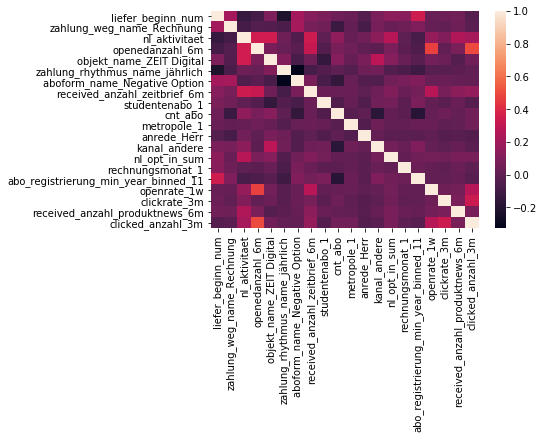

In [702]:
ax = sns.heatmap(corr_20c3)

In [703]:
for i in range(len(l20c3)):
    for j in range(i):
        if np.abs(corr_20c3.iloc[i,j])>0.5 and i!=j:
            print(f"{l20c3[i]} - {l20c3[j]}: {corr_20c3.iloc[i,j]}")

## Testing the feature sets

In [704]:
mods = {'GNB':[1,2,3,4,5,6,7,8,9,10,11,12], 'LR': [1,2,3,4,5,6,7,8,9,10,11,12], 
        'KNN':[1,2,3,4,5,6,7,8,9,10,11,12], 
        'DTC':[1,2,3,4,5,6,7,8,9,10,11,12]}
feature_set_names = ['20a', '30a','20a2','20a3','20b','30b','20b2','20b3', 
                     '20c', '30c', '20c2', '20c3']
df_accuracy = pd.DataFrame(mods, index=feature_set_names)
df_precision = pd.DataFrame(mods, index=feature_set_names)







df_recall = pd.DataFrame(mods, index=feature_set_names)
df_roc_auc = pd.DataFrame(mods, index=feature_set_names)
df_ap = pd.DataFrame(mods, index=feature_set_names)
df_f1 = pd.DataFrame(mods, index=feature_set_names)
df_fbeta = pd.DataFrame(mods, index=feature_set_names)

print(df_accuracy)


      GNB  LR  KNN  DTC
20a     1   1    1    1
30a     2   2    2    2
20a2    3   3    3    3
20a3    4   4    4    4
20b     5   5    5    5
30b     6   6    6    6
20b2    7   7    7    7
20b3    8   8    8    8
20c     9   9    9    9
30c    10  10   10   10
20c2   11  11   11   11
20c3   12  12   12   12


In [705]:
from sklearn.naive_bayes import GaussianNB
gnb = GaussianNB()
log_reg = LogisticRegression(random_state=7, #class_weight={0:0.372, 1:0.628}, 
                             max_iter=10000)
knn = KNeighborsClassifier(n_neighbors = 2, metric = 'minkowski',p=2, weights='uniform')

dtc = DecisionTreeClassifier(random_state=7,criterion = "entropy", 
            max_depth=5, min_samples_leaf=5, #class_weight = {0:0.85,1:0.15}
                                  )


model_list=[(gnb, 'GNB'), (log_reg,'LR'), (knn,'KNN'), (dtc,'DTC')]









feature_sets = [(l20a,'20a'),(l30a,'30a'),(l20a2,'20a2'),(l20a3,'20a3'),(l20b,'20b'),(l30b,'30b'),
                (l20b2,'20b2'), (l20b3,'20b3'),
                (l20c,'20c'),
                (l30c,'30c'),(l20c2,'20c2'), (l20c3,'20c3')]


for m in model_list:
    for fs in feature_sets:
        X_select_train = X_train_scaled[fs[0]]
        X_select_val = X_val_scaled[fs[0]]
        m[0].fit(X_select_train, y_train)
        y_pred=m[0].predict(X_select_val)
        df_accuracy.loc[fs[1],m[1]] = accuracy_score(y_val, y_pred)
        df_precision.loc[fs[1],m[1]] = precision_score(y_val, y_pred)
        df_recall.loc[fs[1],m[1]] = recall_score(y_val, y_pred)
        df_roc_auc.loc[fs[1],m[1]] = roc_auc_score(y_val, y_pred)
        df_ap.loc[fs[1],m[1]] = average_precision_score(y_val, y_pred)
        df_f1.loc[fs[1],m[1]] = f1_score(y_val, y_pred)
        df_fbeta.loc[fs[1],m[1]] = fbeta_score(y_val, y_pred, beta=0.5)
        
       

        
        
        
#cm = metrics.confusion_matrix(y_d_test,y_d_pred)
#print(cm)
#print(f"Accuracy: {accuracy_score(y_d_test, y_d_pred) }")
#print(f"Precision: {precision_score(y_d_test, y_d_pred)}")
#print(f"Recall: {recall_score(y_d_test, y_d_pred)}")
#print(f"ROC_AUC: {roc_auc_score(y_d_test, y_d_pred)}")
#print(f"AP: {average_precision_score(y_d_test,y_d_pred)}")
#print(f"f1: {f1_score(y_d_test,y_d_pred)}")
#print(f"fbeta: {fbeta_score(y_d_test,y_d_pred,beta=

**Accuracy score**

In [732]:
df_accuracy

,GNB,LR,KNN,DTC,sum
20a,0.666774,0.734683,0.749250,0.734933,2.885640
30a,0.587582,0.736754,0.747608,0.734933,2.806877
20a2,0.655313,0.735611,0.750250,0.735004,2.876178
20a3,0.548201,0.735290,0.746215,0.735004,2.764710
20b,0.639317,0.729327,0.730006,0.733576,2.832227
30b,0.624250,0.735397,0.748001,0.735076,2.842724
20b2,0.618181,0.726221,0.713796,0.732112,2.790310
20b3,0.567981,0.726578,0.720080,0.731541,2.746180
20c,0.641745,0.734147,0.746430,0.735219,2.857541
30c,0.636889,0.736825,0.738468,0.734683,2.846865


In [707]:
df_accuracy.sort_values(by='GNB', ascending = False)['GNB']

20c3    0.688589
20c2    0.681234
20a     0.666774
20a2    0.655313
20c     0.641745
20b     0.639317
30c     0.636889
30b     0.624250
20b2    0.618181
30a     0.587582
20b3    0.567981
20a3    0.548201
Name: GNB, dtype: float64

In [708]:
df_accuracy.sort_values(by='LR', ascending = False)['LR']

20c2    0.738789
20c3    0.736932
30c     0.736825
30a     0.736754
20a2    0.735611
30b     0.735397
20a3    0.735290
20a     0.734683
20c     0.734147
20b     0.729327
20b3    0.726578
20b2    0.726221
Name: LR, dtype: float64

In [709]:
df_accuracy.sort_values(by='KNN', ascending= False)['KNN']

20a2    0.750250
20a     0.749250
30b     0.748001
30a     0.747608
20c     0.746430
20a3    0.746215
20c2    0.739574
30c     0.738468
20c3    0.735326
20b     0.730006
20b3    0.720080
20b2    0.713796
Name: KNN, dtype: float64

In [710]:
df_accuracy.sort_values(by='DTC', ascending= False)['DTC']

20c     0.735219
30b     0.735076
20a2    0.735004
20a3    0.735004
20a     0.734933
30a     0.734933
30c     0.734683
20b     0.733576
20c2    0.732826
20c3    0.732826
20b2    0.732112
20b3    0.731541
Name: DTC, dtype: float64

In [711]:
df_accuracy['sum']=df_accuracy['GNB']+df_accuracy['LR']+ df_accuracy['KNN'] + df_accuracy['DTC']

In [712]:
df_accuracy

,GNB,LR,KNN,DTC,sum
20a,0.666774,0.734683,0.749250,0.734933,2.885640
30a,0.587582,0.736754,0.747608,0.734933,2.806877
20a2,0.655313,0.735611,0.750250,0.735004,2.876178
20a3,0.548201,0.735290,0.746215,0.735004,2.764710
20b,0.639317,0.729327,0.730006,0.733576,2.832227
30b,0.624250,0.735397,0.748001,0.735076,2.842724
20b2,0.618181,0.726221,0.713796,0.732112,2.790310
20b3,0.567981,0.726578,0.720080,0.731541,2.746180
20c,0.641745,0.734147,0.746430,0.735219,2.857541
30c,0.636889,0.736825,0.738468,0.734683,2.846865


In [713]:
df_accuracy.sort_values(by='sum', ascending=False)['sum']

20c3    2.893673
20c2    2.892424
20a     2.885640
20a2    2.876178
20c     2.857541
30c     2.846865
30b     2.842724
20b     2.832227
30a     2.806877
20b2    2.790310
20a3    2.764710
20b3    2.746180
Name: sum, dtype: float64

**Precision**

In [714]:
df_precision

,GNB,LR,KNN,DTC
20a,0.462424,0.624100,0.660866,0.599124
30a,0.401216,0.627570,0.653677,0.599124
20a2,0.451702,0.626251,0.664283,0.601915
20a3,0.381244,0.624556,0.649945,0.601915
20b,0.437780,0.609786,0.607270,0.630158
30b,0.425002,0.623073,0.655332,0.599429
20b2,0.420603,0.602206,0.562448,0.634734
20b3,0.388736,0.602178,0.585970,0.619024
20c,0.439134,0.626270,0.654570,0.606325
30c,0.435636,0.633090,0.635007,0.602947


In [715]:
df_precision['sum']=df_precision['GNB']+df_precision['LR']+ df_precision['KNN'] + df_precision['DTC']

In [716]:
df_precision.sort_values(by='sum', ascending=False)['sum']

20c2    2.359897
20c3    2.350704
20a     2.346514
20a2    2.344150
20c     2.326299
30c     2.306680
30b     2.302837
20b     2.284995
30a     2.281587
20a3    2.257659
20b2    2.219990
20b3    2.195907
Name: sum, dtype: float64

**Recall**

In [717]:
df_recall

,GNB,LR,KNN,DTC
20a,0.630951,0.307147,0.349911,0.371648
30a,0.740343,0.317307,0.350738,0.371648
20a2,0.656822,0.310573,0.351093,0.363851
20a3,0.794330,0.311282,0.347431,0.363851
20b,0.680331,0.290018,0.301949,0.286828
30b,0.689191,0.315180,0.350620,0.372120
20b2,0.697460,0.277377,0.238866,0.267690
20b3,0.750148,0.280921,0.251624,0.290608
20c,0.668636,0.298523,0.340933,0.353337
30c,0.681630,0.307383,0.316716,0.357708


In [718]:
df_recall['sum']=df_recall['GNB']+df_recall['LR']+ df_recall['KNN'] + df_recall['DTC']

In [719]:
df_recall.sort_values(by='sum', ascending=False)['sum']

20a3    1.816893
30a     1.780035
30b     1.727112
20a2    1.682339
30c     1.663438
20c     1.661429
20a     1.659657
20b3    1.573302
20b     1.559126
20c2    1.551920
20b2    1.481394
20c3    1.468045
Name: sum, dtype: float64

**ROC AUC score**

In [720]:
df_roc_auc

,GNB,LR,KNN,DTC
20a,0.656621,0.613508,0.636067,0.631968
30a,0.630878,0.617871,0.635125,0.631968
20a2,0.655741,0.615144,0.637118,0.629810
20a3,0.617960,0.615115,0.633189,0.629810
20b,0.650942,0.604815,0.608683,0.606956
30b,0.642656,0.616297,0.635373,0.632205
20b2,0.640650,0.599007,0.579188,0.600483
20b3,0.619612,0.600267,0.587307,0.606569
20c,0.649367,0.610680,0.631501,0.626983
30c,0.649570,0.615110,0.618932,0.627838


In [721]:
df_roc_auc['sum']=df_roc_auc['GNB']+df_roc_auc['LR']+ df_roc_auc['KNN'] + df_roc_auc['DTC']

In [722]:
df_roc_auc.sort_values(by='sum', ascending=False)['sum']

20a     2.538164
20a2    2.537813
30b     2.526530
20c     2.518531
30a     2.515843
20c2    2.512490
30c     2.511451
20a3    2.496074
20c3    2.489613
20b     2.471396
20b2    2.419329
20b3    2.413755
Name: sum, dtype: float64

**Average precision (area under the precision-recall curve)**

The average precision is sometimes advocated as a useful measure for imbalanced data sets.

In [723]:
df_ap

,GNB,LR,KNN,DTC
20a,0.403307,0.401095,0.427724,0.412573
30a,0.375515,0.405466,0.425499,0.412573
20a2,0.400408,0.402866,0.429347,0.411274
20a3,0.364994,0.402568,0.423040,0.411274
20b,0.394451,0.391430,0.394340,0.396293
30b,0.386845,0.403357,0.426038,0.412827
20b2,0.384792,0.385440,0.364391,0.391242
20b3,0.367123,0.386495,0.373630,0.394296
20c,0.393771,0.398967,0.422358,0.409681
30c,0.393165,0.403934,0.407629,0.409802


In [724]:
df_ap['sum']=df_ap['GNB']+df_ap['LR']+ df_ap['KNN'] + df_ap['DTC']

In [725]:
df_ap.sort_values(by='sum', ascending=False)['sum']

20a     1.644699
20a2    1.643895
30b     1.629067
20c2    1.625343
20c     1.624777
30a     1.619054
30c     1.614531
20c3    1.606944
20a3    1.601876
20b     1.576514
20b2    1.525865
20b3    1.521545
Name: sum, dtype: float64

**f1 score**

In [726]:
df_f1

,GNB,LR,KNN,DTC
20a,0.533700,0.411686,0.457558,0.458734
30a,0.520407,0.421499,0.456523,0.458734
20a2,0.535284,0.415225,0.459386,0.453541
20a3,0.515210,0.415484,0.452810,0.453541
20b,0.532747,0.393083,0.403345,0.394220
30b,0.525775,0.418608,0.456826,0.459184
20b2,0.524753,0.379812,0.335323,0.376568
20b3,0.512097,0.383116,0.352066,0.395530
20c,0.530111,0.404320,0.448346,0.446485
30c,0.531552,0.413837,0.422637,0.449025


In [727]:
df_f1['sum']=df_f1['GNB']+df_f1['LR']+ df_f1['KNN'] + df_f1['DTC']

In [728]:
df_f1.sort_values(by='sum', ascending=False)['sum']

20a2    1.863438
20a     1.861677
30b     1.860393
30a     1.857163
20a3    1.837045
20c     1.829262
30c     1.817052
20c2    1.801442
20c3    1.758857
20b     1.723396
20b3    1.642809
20b2    1.616457
Name: sum, dtype: float64

**fbeta score (beta = 0.5)**

The fbeta score with beta < 1 gives more weight to precision as compared to recall, which makes this a 
useful variable for the present case, as one would like to have a good precision to avoid too many false alarms
(as the measures taken to prevent churn might sometimes include financial benefits). Of course there should still 
be a reasonable amount of churners that are detected by the model, so that the fbeta score with beta = 0.5 might 
be a good compromise for the present business case.

In [729]:
df_fbeta

,GNB,LR,KNN,DTC
20a,0.488521,0.517331,0.561134,0.533781
30a,0.441680,0.524917,0.557391,0.533781
20a2,0.481794,0.520450,0.563712,0.532264
20a3,0.425500,0.519908,0.553548,0.532264
20b,0.471392,0.499613,0.505118,0.508439
30b,0.460291,0.521236,0.558294,0.534170
20b2,0.456874,0.487927,0.442548,0.498131
20b3,0.430188,0.490087,0.462943,0.504905
20c,0.471502,0.513514,0.552852,0.530376
30c,0.469526,0.522385,0.528734,0.530242


In [730]:
df_fbeta['sum']=df_fbeta['GNB']+df_fbeta['LR']+ df_fbeta['KNN'] + df_fbeta['DTC']

In [731]:
df_fbeta.sort_values(by='sum', ascending=False)['sum']

20a     2.100766
20a2    2.098220
20c2    2.076594
30b     2.073990
20c     2.068243
30a     2.057770
20c3    2.054297
30c     2.050887
20a3    2.031220
20b     1.984563
20b3    1.888123
20b2    1.885480
Name: sum, dtype: float64

**Conclusion**

The most successful feature sets across all scores are 

   * 20a
   * 20a2 
   * 30b
   * 20c2 

In particular, these are the best feature sets regarding ap and fbeta, 
which might be good metrics for slightly imbalanced data sets (ap) with a bit more emphasis on precision (fbeta).
Also for the ROC AUC score, these feature sets are the best (except for 20c2, which is however slightly behind the top four features for that score).

The feature sets 20b, 20b2 and 20b3 are not that successful.

We focus mostly on 20a, but also consider the other three models where appropriate, hence we define

In [733]:
X_train_scaled_20a = X_train_scaled[l20a]
X_val_scaled_20a = X_val_scaled[l20a]


X_train_scaled_20a2 = X_train_scaled[l20a2]
X_val_scaled_20a2 = X_val_scaled[l20a2]


X_train_scaled_30b = X_train_scaled[l30b]
X_val_scaled_30b = X_val_scaled[l30b]


X_train_scaled_20c2 = X_train_scaled[l20c2]
X_val_scaled_20c2 = X_val_scaled[l20c2]






# Model building and parameter tuning

## Dummy classifier

In [736]:
from sklearn.dummy import DummyClassifier
dummy_clf=DummyClassifier(strategy="most_frequent")
dummy_clf.fit(X_train_scaled,y_train)
dummy_clf.predict(X_train_scaled)
dummy_clf.score(X_train_scaled,y_train)

0.6977630592351912

In [737]:
from sklearn.dummy import DummyClassifier
dummy_clf=DummyClassifier(strategy="stratified")
dummy_clf.fit(X_train_scaled,y_train)
dummy_clf.predict(X_train_scaled)
dummy_clf.score(X_train_scaled,y_train)





0.5804084693112436

In [738]:
from sklearn.dummy import DummyClassifier
dummy_clf=DummyClassifier(strategy="uniform")
dummy_clf.fit(X_train_scaled,y_train)
dummy_clf.predict(X_train_scaled)
dummy_clf.score(X_train_scaled,y_train)


0.5004641696718678

In [739]:
from sklearn.dummy import DummyClassifier
dummy_clf=DummyClassifier(strategy="constant", constant = 1)
dummy_clf.fit(X_train_scaled,y_train)
dummy_clf.predict(X_train_scaled)
dummy_clf.score(X_train_scaled,y_train)



0.3022369407648088

## Basic estimators

### Gaussian Naive Bayes

There is nothing to tune here, so we just use 20a and 20c2, which have the highest fbeta score for this estimator.

In [734]:
from sklearn.naive_bayes import GaussianNB
gnb = GaussianNB()
gnb.fit(X_train_scaled_20a, y_train)
y_pred=gnb.predict(X_val_scaled_20a)
cm = metrics.confusion_matrix(y_val,y_pred)
print(cm)
print(f"Accuracy: {accuracy_score(y_val, y_pred) }")
print(f"Precision: {precision_score(y_val, y_pred)}")
print(f"Recall: {recall_score(y_val, y_pred)}")
print(f"ROC_AUC: {roc_auc_score(y_val, y_pred)}")
print(f"AP: {average_precision_score(y_val,y_pred)}")
print(f"f1: {f1_score(y_val,y_pred)}")
print(f"fbeta: {fbeta_score(y_val,y_pred,beta=0.5)}")  

[[13334  6209]
 [ 3124  5341]]
Accuracy: 0.6667737789203085
Precision: 0.4624242424242424
Recall: 0.6309509746012995
ROC_AUC: 0.656620654368142
AP: 0.4033065865625217
f1: 0.5336997252060954
fbeta: 0.4885209914936431


In [735]:
from sklearn.naive_bayes import GaussianNB
gnb = GaussianNB()
gnb.fit(X_train_scaled_20c2, y_train)
y_pred=gnb.predict(X_val_scaled_20c2)
cm = metrics.confusion_matrix(y_val,y_pred)
print(cm)
print(f"Accuracy: {accuracy_score(y_val, y_pred) }")
print(f"Precision: {precision_score(y_val, y_pred)}")
print(f"Recall: {recall_score(y_val, y_pred)}")
print(f"ROC_AUC: {roc_auc_score(y_val, y_pred)}")
print(f"AP: {average_precision_score(y_val,y_pred)}")
print(f"f1: {f1_score(y_val,y_pred)}")
print(f"fbeta: {fbeta_score(y_val,y_pred,beta=0.5)}")  

[[14099  5444]
 [ 3484  4981]]
Accuracy: 0.6812339331619537
Precision: 0.4777937649880096
Recall: 0.5884229178972239
ROC_AUC: 0.654928851365334
AP: 0.4055378319100414
f1: 0.5273689782953943
fbeta: 0.49646167646765677


### Logistic regression

The best feature set for logistic regression in the scores accuracy, 
fbeta and ac is 20c2. We will therefore only consider that case.

**Maximising accuracy**

In [755]:
log_reg = LogisticRegression(random_state=7, max_iter=10000)

param_log_reg = {'penalty':('l1','l2'),
                'C': [0.00001,0.0001,0.001, 0.01, 0.1, 1, 10, 100, 1000, 10000],
                 #[0.02, 0.05, 0.1, 0.2,0.5],
             
                 'class_weight': [{0: 0.1,1:0.9},  {0:0.3,1:0.7},  {0:0.5,1:0.5}, 
                                  {0:0.7,1:0.3},  {0: 0.9, 1:0.1}]
               # 'class_weight': [{0:0.3,1:0.7}, {0:0.32,1:0.68}, {0:0.35,1:0.65}, 
                #                 {0:0.372,1:0.628}, {0:0.4,1:0.6}, {0: 0.42, 1:0.58}, {0: 0.45, 1:0.55}]
                }
grid_log_reg = GridSearchCV(log_reg, param_grid=param_log_reg, cv=3, scoring='accuracy', 
                           verbose=5, n_jobs=-1)
grid_log_reg.fit(X_train_scaled_20c2, y_train)
grid_log_reg.best_params_

Fitting 3 folds for each of 100 candidates, totalling 300 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  10 tasks      | elapsed:    3.1s
[Parallel(n_jobs=-1)]: Done  64 tasks      | elapsed:    5.4s
[Parallel(n_jobs=-1)]: Done 154 tasks      | elapsed:   11.2s
[Parallel(n_jobs=-1)]: Done 280 tasks      | elapsed:   36.9s
[Parallel(n_jobs=-1)]: Done 300 out of 300 | elapsed:   41.4s finished


{'C': 10000, 'class_weight': {0: 0.5, 1: 0.5}, 'penalty': 'l2'}

In [756]:
best_model_lr = grid_log_reg.best_estimator_
y_pred = best_model_lr.predict(X_val_scaled_20c2)
cm = metrics.confusion_matrix(y_val,y_pred)
print(cm)
print(f"Accuracy: {accuracy_score(y_val, y_pred) }")
print(f"Precision: {precision_score(y_val, y_pred)}")
print(f"Recall: {recall_score(y_val, y_pred)}")
print(f"ROC_AUC: {roc_auc_score(y_val, y_pred)}")
print(f"AP: {average_precision_score(y_val,y_pred)}")
print(f"f1: {f1_score(y_val,y_pred)}")
print(f"fbeta: {fbeta_score(y_val,y_pred,beta=0.5)}")  

[[18052  1491]
 [ 5830  2635]]
Accuracy: 0.7386103970294202
Precision: 0.6386330586524479
Recall: 0.3112817483756645
ROC_AUC: 0.6174942232130587
AP: 0.40694962797842926
f1: 0.41855293463585097
fbeta: 0.5276542913212383


**Maximising the fbeta score**

To be able to use the fbeta score in the grid search, one has to define it with make_scorer, 
otherwise, the grid search will not support it.

In [747]:
from sklearn.metrics import fbeta_score, make_scorer
f_beta_scorer=make_scorer(fbeta_score, beta = 0.5)
f_beta_scorer

make_scorer(fbeta_score, beta=0.5)

In [748]:
log_reg = LogisticRegression(random_state=7, max_iter=10000)

param_log_reg = {'penalty':('l1','l2'),
                'C': [0.00001,0.0001,0.001, 0.01, 0.1, 1, 10, 100, 1000, 10000],
                 #[0.02, 0.05, 0.1, 0.2,0.5],
             
                 'class_weight': [{0: 0.1,1:0.9},  {0:0.3,1:0.7},  {0:0.5,1:0.5}, 
                                  {0:0.7,1:0.3},  {0: 0.9, 1:0.1}]
               # 'class_weight': [{0:0.3,1:0.7}, {0:0.32,1:0.68}, {0:0.35,1:0.65}, 
                #                 {0:0.372,1:0.628}, {0:0.4,1:0.6}, {0: 0.42, 1:0.58}, {0: 0.45, 1:0.55}]
                }
grid_log_reg = GridSearchCV(log_reg, param_grid=param_log_reg, cv=3, scoring=f_beta_scorer, 
                           verbose=5, n_jobs=-1)
grid_log_reg.fit(X_train_scaled_20c2, y_train)
grid_log_reg.best_params_

Fitting 3 folds for each of 100 candidates, totalling 300 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  10 tasks      | elapsed:    3.0s
[Parallel(n_jobs=-1)]: Done  64 tasks      | elapsed:    6.0s
[Parallel(n_jobs=-1)]: Done 154 tasks      | elapsed:   12.6s
[Parallel(n_jobs=-1)]: Done 280 tasks      | elapsed:   38.3s
[Parallel(n_jobs=-1)]: Done 300 out of 300 | elapsed:   42.8s finished


{'C': 10000, 'class_weight': {0: 0.5, 1: 0.5}, 'penalty': 'l2'}

In [757]:
log_reg = LogisticRegression(random_state=7, penalty='l2', max_iter=10000)

param_log_reg = {#'penalty':('l1','l2'),
                'C': [2000, 5000, 10000, 50000],
                
                'class_weight': [{0:0.3,1:0.7}, {0:0.32,1:0.68}, {0:0.35,1:0.65}, 
                                 {0:0.372,1:0.628}, {0:0.4,1:0.6}, {0: 0.42, 1:0.58}, {0: 0.45, 1:0.55}, {0:0.5,1:0.5}]
                }
grid_log_reg = GridSearchCV(log_reg, param_grid=param_log_reg, cv=3, scoring=f_beta_scorer, 
                           verbose=5, n_jobs=-1)
grid_log_reg.fit(X_train_scaled_20c2, y_train)
grid_log_reg.best_params_

Fitting 3 folds for each of 32 candidates, totalling 96 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  10 tasks      | elapsed:    7.3s
[Parallel(n_jobs=-1)]: Done  64 tasks      | elapsed:   28.2s
[Parallel(n_jobs=-1)]: Done  96 out of  96 | elapsed:   40.1s finished


{'C': 2000, 'class_weight': {0: 0.42, 1: 0.58}}

In [758]:
best_model_lr = grid_log_reg.best_estimator_
y_pred = best_model_lr.predict(X_val_scaled_20c2)
cm = metrics.confusion_matrix(y_val,y_pred)
print(cm)
print(f"Accuracy: {accuracy_score(y_val, y_pred) }")
print(f"Precision: {precision_score(y_val, y_pred)}")
print(f"Recall: {recall_score(y_val, y_pred)}")
print(f"ROC_AUC: {roc_auc_score(y_val, y_pred)}")
print(f"AP: {average_precision_score(y_val,y_pred)}")
print(f"f1: {f1_score(y_val,y_pred)}")
print(f"fbeta: {fbeta_score(y_val,y_pred,beta=0.5)}")  

[[16590  2953]
 [ 4562  3903]]
Accuracy: 0.7316838046272494
Precision: 0.5692823803967327
Recall: 0.46107501476668633
ROC_AUC: 0.6549861590744857
AP: 0.4253639156524937
f1: 0.5094967691403955
fbeta: 0.5437599264398562


### K nearest neighbors

In [ ]:
The best model for KNN for accuracy and the fbeta score (as well as ROC AUC and AP) 
is 20a2, which we will focus on here:

**Maximising accuracy**

In [759]:
knn = KNeighborsClassifier(metric='minkowski')

param_knn = {'n_neighbors':[1,2,5,8, 13,18, 32],
                'weights': ["uniform", "distance"], 'p':[1,2]
               }

grid_knn = GridSearchCV(knn, param_grid=param_knn, cv=3, scoring='accuracy', 
                           verbose=5, n_jobs=-1)
grid_knn.fit(X_train_scaled_20a2, y_train)
grid_knn.best_params_

Fitting 3 folds for each of 28 candidates, totalling 84 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  10 tasks      | elapsed:  1.5min
[Parallel(n_jobs=-1)]: Done  64 tasks      | elapsed: 10.2min
[Parallel(n_jobs=-1)]: Done  84 out of  84 | elapsed: 14.7min finished


{'n_neighbors': 32, 'p': 1, 'weights': 'distance'}

In [760]:
best_model_knn = grid_knn.best_estimator_
y_pred = best_model_knn.predict(X_val_scaled_20a2)
cm = metrics.confusion_matrix(y_val,y_pred)
print(cm)
print(f"Accuracy: {accuracy_score(y_val, y_pred) }")
print(f"Precision: {precision_score(y_val, y_pred)}")
print(f"Recall: {recall_score(y_val, y_pred)}")
print(f"ROC_AUC: {roc_auc_score(y_val, y_pred)}")
print(f"AP: {average_precision_score(y_val,y_pred)}")
print(f"f1: {f1_score(y_val,y_pred)}")
print(f"fbeta: {fbeta_score(y_val,y_pred,beta=0.5)}")  

[[17783  1760]
 [ 3793  4672]]
Accuracy: 0.8017352185089974
Precision: 0.7263681592039801
Recall: 0.5519196692262256
ROC_AUC: 0.7309309240057342
AP: 0.5363224668521266
f1: 0.6272403839699268
fbeta: 0.683180767993449


**Maximizing the fbeta score**

In [761]:
knn = KNeighborsClassifier(metric='minkowski')

param_knn = {'n_neighbors':[1,2,5,8, 13,18, 32],
                'weights': ["uniform", "distance"], 'p':[1,2]
               }

grid_knn = GridSearchCV(knn, param_grid=param_knn, cv=3, scoring=f_beta_scorer, 
                           verbose=5, n_jobs=-1)
grid_knn.fit(X_train_scaled_20a2, y_train)
grid_knn.best_params_

Fitting 3 folds for each of 28 candidates, totalling 84 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  10 tasks      | elapsed:  1.5min
[Parallel(n_jobs=-1)]: Done  64 tasks      | elapsed:  9.9min
[Parallel(n_jobs=-1)]: Done  84 out of  84 | elapsed: 14.3min finished


{'n_neighbors': 32, 'p': 1, 'weights': 'distance'}

In [762]:
best_model_knn = grid_knn.best_estimator_
y_pred = best_model_knn.predict(X_val_scaled_20a2)
cm = metrics.confusion_matrix(y_val,y_pred)
print(cm)
print(f"Accuracy: {accuracy_score(y_val, y_pred) }")
print(f"Precision: {precision_score(y_val, y_pred)}")
print(f"Recall: {recall_score(y_val, y_pred)}")
print(f"ROC_AUC: {roc_auc_score(y_val, y_pred)}")
print(f"AP: {average_precision_score(y_val,y_pred)}")
print(f"f1: {f1_score(y_val,y_pred)}")
print(f"fbeta: {fbeta_score(y_val,y_pred,beta=0.5)}")  

[[17783  1760]
 [ 3793  4672]]
Accuracy: 0.8017352185089974
Precision: 0.7263681592039801
Recall: 0.5519196692262256
ROC_AUC: 0.7309309240057342
AP: 0.5363224668521266
f1: 0.6272403839699268
fbeta: 0.683180767993449


In [ ]:
This is the same as above.

### Decision trees

In [771]:

dtc = DecisionTreeClassifier(random_state=7)

#criterion = ['gini','entropy']
#max_depth = range(1,20,2)
#min_samples_split = range(10,500,20)

param_dtc = {  'criterion':['gini','entropy'], 'max_depth': list(range(1,21,2)), 
             'min_samples_split':list(range(10,510,25)) ,
             'class_weight': [{0: 0.1,1:0.9}, {0:0.2,1:0.8}, {0:0.3,1:0.7}, {0:0.4,1:0.6}, {0:0.5,1:0.5}, {0:0.6,1:0.4}, {0:0.7,1:0.3}, {0: 0.8, 1:0.2}, {0: 0.9, 1:0.10} ]               
                }
grid_dtc = GridSearchCV(dtc, param_grid=param_dtc, cv=3, scoring='accuracy', 
                           verbose=5, n_jobs=-1)
grid_dtc.fit(X_train_scaled_20a2, y_train)
grid_dtc.best_params_




Fitting 3 folds for each of 3600 candidates, totalling 10800 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  10 tasks      | elapsed:    1.2s
[Parallel(n_jobs=-1)]: Done  64 tasks      | elapsed:    3.6s
[Parallel(n_jobs=-1)]: Done 154 tasks      | elapsed:    9.6s
[Parallel(n_jobs=-1)]: Done 280 tasks      | elapsed:   21.2s
[Parallel(n_jobs=-1)]: Done 442 tasks      | elapsed:   40.8s
[Parallel(n_jobs=-1)]: Done 640 tasks      | elapsed:  1.0min
[Parallel(n_jobs=-1)]: Done 874 tasks      | elapsed:  1.3min
[Parallel(n_jobs=-1)]: Done 1144 tasks      | elapsed:  1.9min
[Parallel(n_jobs=-1)]: Done 1450 tasks      | elapsed:  2.5min
[Parallel(n_jobs=-1)]: Done 1792 tasks      | elapsed:  3.3min
[Parallel(n_jobs=-1)]: Done 2170 tasks      | elapsed:  3.9min
[Parallel(n_jobs=-1)]: Done 2584 tasks      | elapsed:  4.6min
[Parallel(n_jobs=-1)]: Done 3034 tasks      | elapsed:  5.5min
[Parallel(n_jobs=-1)]: Done 3520 tasks      | elapsed:  6.4min
[Parallel(n_jobs=-1)]: Done 4042 tasks      | ela

{'class_weight': {0: 0.5, 1: 0.5},
 'criterion': 'entropy',
 'max_depth': 11,
 'min_samples_split': 160}

In [772]:
best_model_dtc = grid_dtc.best_estimator_
y_pred = best_model_dtc.predict(X_val_scaled_20a2)
cm = metrics.confusion_matrix(y_val,y_pred)
print(cm)
print(f"Accuracy: {accuracy_score(y_val, y_pred) }")
print(f"Precision: {precision_score(y_val, y_pred)}")
print(f"Recall: {recall_score(y_val, y_pred)}")
print(f"ROC_AUC: {roc_auc_score(y_val, y_pred)}")
print(f"AP: {average_precision_score(y_val,y_pred)}")
print(f"f1: {f1_score(y_val,y_pred)}")
print(f"fbeta: {fbeta_score(y_val,y_pred,beta=0.5)}")  

[[17846  1697]
 [ 5252  3213]]
Accuracy: 0.7518923164810054
Precision: 0.6543788187372709
Recall: 0.3795629060838748
ROC_AUC: 0.6463643727574365
AP: 0.4358957781619253
f1: 0.4804485981308411
fbeta: 0.5716064757160648


In [773]:

dtc = DecisionTreeClassifier(random_state=7)

#criterion = ['gini','entropy']
#max_depth = range(1,20,2)
#min_samples_split = range(10,500,20)

param_dtc = {  'criterion':['gini','entropy'], 'max_depth': list(range(1,21,5)), 
             'min_samples_split':list(range(10,510,100)) ,
             'class_weight': [{0: 0.1,1:0.9}, {0:0.2,1:0.8}, {0:0.3,1:0.7}, {0:0.4,1:0.6}, {0:0.5,1:0.5}, {0:0.6,1:0.4}, {0:0.7,1:0.3}, {0: 0.8, 1:0.2}, {0: 0.9, 1:0.10} ]               
                }
grid_dtc = GridSearchCV(dtc, param_grid=param_dtc, cv=3, scoring=f_beta_scorer, 
                           verbose=5, n_jobs=-1)
grid_dtc.fit(X_train_scaled_20a2, y_train)
grid_dtc.best_params_



Fitting 3 folds for each of 360 candidates, totalling 1080 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  10 tasks      | elapsed:    3.0s
[Parallel(n_jobs=-1)]: Done  64 tasks      | elapsed:    9.0s
[Parallel(n_jobs=-1)]: Done 154 tasks      | elapsed:   17.2s
[Parallel(n_jobs=-1)]: Done 280 tasks      | elapsed:   30.1s
[Parallel(n_jobs=-1)]: Done 442 tasks      | elapsed:   45.8s
[Parallel(n_jobs=-1)]: Done 640 tasks      | elapsed:  1.1min
[Parallel(n_jobs=-1)]: Done 874 tasks      | elapsed:  1.5min
[Parallel(n_jobs=-1)]: Done 1080 out of 1080 | elapsed:  2.0min finished


{'class_weight': {0: 0.5, 1: 0.5},
 'criterion': 'gini',
 'max_depth': 11,
 'min_samples_split': 10}

In [774]:
dtc = DecisionTreeClassifier(random_state=7, criterion='gini')

#criterion = ['gini','entropy']
#max_depth = range(1,20,2)
#min_samples_split = range(10,500,20)

param_dtc = {  'criterion':['gini','entropy'], 'max_depth': list(range(7,13,1)), 
             'min_samples_split':list(range(4,10,1)) ,
             'class_weight': [{0:0.42,1:0.58}, {0:0.45,1:0.55}, {0:0.47,1:0.53}, {0:0.5,1:0.5}, 
                              {0: 0.52, 1:0.48}, {0: 0.55, 1:0.45}, {0:0.58,1:0.42} ]               
                }
grid_dtc = GridSearchCV(dtc, param_grid=param_dtc, cv=3, scoring=f_beta_scorer, 
                           verbose=5, n_jobs=-1)
grid_dtc.fit(X_train_scaled_20a2, y_train)
grid_dtc.best_params_



Fitting 3 folds for each of 504 candidates, totalling 1512 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  10 tasks      | elapsed:    4.2s
[Parallel(n_jobs=-1)]: Done  64 tasks      | elapsed:   10.1s
[Parallel(n_jobs=-1)]: Done 154 tasks      | elapsed:   21.2s
[Parallel(n_jobs=-1)]: Done 280 tasks      | elapsed:   35.9s
[Parallel(n_jobs=-1)]: Done 442 tasks      | elapsed:   55.3s
[Parallel(n_jobs=-1)]: Done 640 tasks      | elapsed:  1.3min
[Parallel(n_jobs=-1)]: Done 874 tasks      | elapsed:  1.8min
[Parallel(n_jobs=-1)]: Done 1144 tasks      | elapsed:  2.3min
[Parallel(n_jobs=-1)]: Done 1450 tasks      | elapsed:  3.0min
[Parallel(n_jobs=-1)]: Done 1512 out of 1512 | elapsed:  3.1min finished


{'class_weight': {0: 0.45, 1: 0.55},
 'criterion': 'gini',
 'max_depth': 11,
 'min_samples_split': 5}

In [775]:
best_model_dtc = grid_dtc.best_estimator_
y_pred = best_model_dtc.predict(X_val_scaled_20a2)
cm = metrics.confusion_matrix(y_val,y_pred)
print(cm)
print(f"Accuracy: {accuracy_score(y_val, y_pred) }")
print(f"Precision: {precision_score(y_val, y_pred)}")
print(f"Recall: {recall_score(y_val, y_pred)}")
print(f"ROC_AUC: {roc_auc_score(y_val, y_pred)}")
print(f"AP: {average_precision_score(y_val,y_pred)}")
print(f"f1: {f1_score(y_val,y_pred)}")
print(f"fbeta: {fbeta_score(y_val,y_pred,beta=0.5)}")  

[[17165  2378]
 [ 4690  3775]]
Accuracy: 0.7476435304198801
Precision: 0.6135218592556476
Recall: 0.4459539279385706
ROC_AUC: 0.6621367654327249
AP: 0.44105463953793755
f1: 0.5164865234642222
fbeta: 0.5706382078181214


This is slightly worse than above (possibly due to slight overfitting on the training data in the grid search), but ROC AUC and AP are slightly better.

### Support vector machines

**Maximising accuracy**

We choose Model 20a2, as that also performed best for KNN.

In [793]:
lsvc =LinearSVC()

param_lsvc = {'C':[0.1,1,10],'class_weight': [{0: 0.1,1:0.9},  {0:0.3,1:0.7},  {0:0.5,1:0.5}, 
                                  {0:0.7,1:0.3},  {0: 0.9, 1:0.1}]
                }

grid_lsvc = GridSearchCV(lsvc, param_grid=param_lsvc, cv=3, scoring='accuracy', 
                           verbose=5, n_jobs=-1)
grid_lsvc.fit(X_train_scaled_20a2, y_train)
grid_lsvc.best_params_

Fitting 3 folds for each of 15 candidates, totalling 45 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  10 tasks      | elapsed:    2.9s
[Parallel(n_jobs=-1)]: Done  45 out of  45 | elapsed:  1.8min finished


{'C': 1, 'class_weight': {0: 0.5, 1: 0.5}}

In [794]:
lsvc =LinearSVC()

param_lsvc = {'C':[0.001,0.01,0.02,0.05,0.08,0.1],'class_weight': [{0: 0.45,1:0.55},  {0:0.48,1:0.52},  {0:0.5,1:0.5}, 
                                  {0:0.52,1:0.48},  {0: 0.55, 1:0.45}]
                }

grid_lsvc = GridSearchCV(lsvc, param_grid=param_lsvc, cv=3, scoring='accuracy', 
                           verbose=5, n_jobs=-1)
grid_lsvc.fit(X_train_scaled_20a2, y_train)
grid_lsvc.best_params_

Fitting 3 folds for each of 30 candidates, totalling 90 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  10 tasks      | elapsed:    1.7s
[Parallel(n_jobs=-1)]: Done  64 tasks      | elapsed:    7.4s
[Parallel(n_jobs=-1)]: Done  90 out of  90 | elapsed:   11.1s finished


{'C': 0.1, 'class_weight': {0: 0.48, 1: 0.52}}

In [795]:
best_model_lsvc = grid_lsvc.best_estimator_
y_pred = best_model_lsvc.predict(X_val_scaled_20a2)
cm = metrics.confusion_matrix(y_val,y_pred)
print(cm)
print(f"Accuracy: {accuracy_score(y_val, y_pred) }")
print(f"Precision: {precision_score(y_val, y_pred)}")
print(f"Recall: {recall_score(y_val, y_pred)}")
print(f"ROC_AUC: {roc_auc_score(y_val, y_pred)}")
print(f"AP: {average_precision_score(y_val,y_pred)}")
print(f"f1: {f1_score(y_val,y_pred)}")
print(f"fbeta: {fbeta_score(y_val,y_pred,beta=0.5)}")  

[[17890  1653]
 [ 5738  2727]]
Accuracy: 0.7361111111111112
Precision: 0.6226027397260274
Recall: 0.3221500295333727
ROC_AUC: 0.61878365724737
AP: 0.4054415281225464
f1: 0.4246010120669521
fbeta: 0.5247258033480854


**Maximising the fbeta score**

In [796]:
lsvc =LinearSVC()

param_lsvc = {'C':[0.1,1,10],'class_weight': [{0: 0.1,1:0.9},  {0:0.3,1:0.7},  {0:0.5,1:0.5}, 
                                  {0:0.7,1:0.3},  {0: 0.9, 1:0.1}]
                }

grid_lsvc = GridSearchCV(lsvc, param_grid=param_lsvc, cv=3, scoring=f_beta_scorer, 
                           verbose=5, n_jobs=-1)
grid_lsvc.fit(X_train_scaled_20a2, y_train)
grid_lsvc.best_params_

Fitting 3 folds for each of 15 candidates, totalling 45 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  10 tasks      | elapsed:    4.7s
[Parallel(n_jobs=-1)]: Done  45 out of  45 | elapsed:  1.8min finished


{'C': 0.1, 'class_weight': {0: 0.3, 1: 0.7}}

In [798]:
lsvc =LinearSVC()

param_lsvc = {'C':[0.001,0.01,0.05,0.08,0.1,0.2,0.5],'class_weight': [{0: 0.28,1:0.72},  {0:0.3,1:0.7},  {0:0.35,1:0.65}, 
                                  {0:0.372,1:0.628},  {0: 0.4, 1:0.6}, {0:0.42,1:0.58}, {0:0.45,1:0.55}, {0:0.48,1:0.52}]
                }

grid_lsvc = GridSearchCV(lsvc, param_grid=param_lsvc, cv=3, scoring=f_beta_scorer, 
                           verbose=5, n_jobs=-1)
grid_lsvc.fit(X_train_scaled_20a2, y_train)
grid_lsvc.best_params_

Fitting 3 folds for each of 56 candidates, totalling 168 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  10 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done  64 tasks      | elapsed:    7.9s
[Parallel(n_jobs=-1)]: Done 154 tasks      | elapsed:   27.8s
[Parallel(n_jobs=-1)]: Done 168 out of 168 | elapsed:   33.2s finished


{'C': 0.05, 'class_weight': {0: 0.42, 1: 0.58}}

In [799]:
best_model_lsvc = grid_lsvc.best_estimator_
y_pred = best_model_lsvc.predict(X_val_scaled_20a2)
cm = metrics.confusion_matrix(y_val,y_pred)
print(cm)
print(f"Accuracy: {accuracy_score(y_val, y_pred) }")
print(f"Precision: {precision_score(y_val, y_pred)}")
print(f"Recall: {recall_score(y_val, y_pred)}")
print(f"ROC_AUC: {roc_auc_score(y_val, y_pred)}")
print(f"AP: {average_precision_score(y_val,y_pred)}")
print(f"f1: {f1_score(y_val,y_pred)}")
print(f"fbeta: {fbeta_score(y_val,y_pred,beta=0.5)}")  

[[16573  2970]
 [ 4640  3825]]
Accuracy: 0.7282919165952585
Precision: 0.5629139072847682
Recall: 0.4518606024808033
ROC_AUC: 0.6499440145904503
AP: 0.4200255695898615
f1: 0.501310615989515
fbeta: 0.536540889325291


## Ensemble methods

We take Model 30b here, because it was the best of our
four best models for decision trees for accuracy and the fbeta score.

### Random forests

In [800]:
rfc =RandomForestClassifier(random_state=7)

param_rfc = {'n_estimators': [200, 500],
    'max_features': ['auto', 'sqrt', 'log2'],
    'max_depth' : [4,5,6,7,8],
    'criterion' :['gini', 'entropy']
    #'class_weight': [{0: 0.1,1:0.9},  {0:0.3,1:0.7},  {0:0.5,1:0.5}, 
    #                              {0:0.7,1:0.3},  {0: 0.9, 1:0.1}]
                }

grid_rfc = GridSearchCV(rfc, param_grid=param_rfc, cv=3, scoring='accuracy', 
                           verbose=5, n_jobs=-1)
grid_rfc.fit(X_train_scaled_30b, y_train)
grid_rfc.best_params_

Fitting 3 folds for each of 60 candidates, totalling 180 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  10 tasks      | elapsed:   42.8s
[Parallel(n_jobs=-1)]: Done  64 tasks      | elapsed:  5.5min
[Parallel(n_jobs=-1)]: Done 154 tasks      | elapsed: 12.8min
[Parallel(n_jobs=-1)]: Done 180 out of 180 | elapsed: 15.6min finished


{'criterion': 'gini',
 'max_depth': 8,
 'max_features': 'auto',
 'n_estimators': 200}

In [801]:
rfc =RandomForestClassifier(random_state=7, max_features='auto', criterion = 'gini')

param_rfc = {'n_estimators': [100,200, 300],
    #'max_features': ['auto', 'sqrt', 'log2'],
    'max_depth' : [8,9,10,11,12,13],
    #'criterion' :['gini', 'entropy']
    #'class_weight': [{0: 0.1,1:0.9},  {0:0.3,1:0.7},  {0:0.5,1:0.5}, 
    #                              {0:0.7,1:0.3},  {0: 0.9, 1:0.1}]
                }

grid_rfc = GridSearchCV(rfc, param_grid=param_rfc, cv=3, scoring='accuracy', 
                           verbose=5, n_jobs=-1)
grid_rfc.fit(X_train_scaled_30b, y_train)
grid_rfc.best_params_

Fitting 3 folds for each of 18 candidates, totalling 54 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  10 tasks      | elapsed:   33.1s
[Parallel(n_jobs=-1)]: Done  54 out of  54 | elapsed:  3.6min finished


{'max_depth': 13, 'n_estimators': 200}

In [802]:
best_model_rfc = grid_rfc.best_estimator_
y_pred = best_model_rfc.predict(X_val_scaled_30b)
cm = metrics.confusion_matrix(y_val,y_pred)
print(cm)
print(f"Accuracy: {accuracy_score(y_val, y_pred) }")
print(f"Precision: {precision_score(y_val, y_pred)}")
print(f"Recall: {recall_score(y_val, y_pred)}")
print(f"ROC_AUC: {roc_auc_score(y_val, y_pred)}")
print(f"AP: {average_precision_score(y_val,y_pred)}")
print(f"f1: {f1_score(y_val,y_pred)}")
print(f"fbeta: {fbeta_score(y_val,y_pred,beta=0.5)}") 

[[18242  1301]
 [ 5362  3103]]
Accuracy: 0.7621036846615252
Precision: 0.7045867393278837
Recall: 0.3665682220909628
ROC_AUC: 0.6499985356476408
AP: 0.44972440968676464
f1: 0.48224415261481085
fbeta: 0.594877497028488


In [803]:
rfc =RandomForestClassifier(random_state=7, max_features='auto', criterion = 'gini')

param_rfc = {'n_estimators': [150,200, 250],
    #'max_features': ['auto', 'sqrt', 'log2'],
    'max_depth' : [13,15,19, 23],
    #'criterion' :['gini', 'entropy']
    #'class_weight': [{0: 0.1,1:0.9},  {0:0.3,1:0.7},  {0:0.5,1:0.5}, 
    #                              {0:0.7,1:0.3},  {0: 0.9, 1:0.1}]
                }

grid_rfc = GridSearchCV(rfc, param_grid=param_rfc, cv=3, scoring='accuracy', 
                           verbose=5, n_jobs=-1)
grid_rfc.fit(X_train_scaled_30b, y_train)
grid_rfc.best_params_

Fitting 3 folds for each of 12 candidates, totalling 36 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  10 tasks      | elapsed:  1.1min
[Parallel(n_jobs=-1)]: Done  36 out of  36 | elapsed:  3.8min finished


{'max_depth': 23, 'n_estimators': 200}

In [805]:
rfc =RandomForestClassifier(random_state=7, max_features='auto', criterion = 'gini', n_estimators=200)

param_rfc = {#'n_estimators': [150,200, 250],
    #'max_features': ['auto', 'sqrt', 'log2'],
    'max_depth' : [23, 32],
    #'criterion' :['gini', 'entropy']
    'class_weight': [{0:0.3,1:0.7},{0:0.4,1:0.6}, {0:0.45,1:0.55},   {0:0.5,1:0.5}, 
                                 {0:0.55,1:0.45}]
                }

grid_rfc = GridSearchCV(rfc, param_grid=param_rfc, cv=3, scoring='accuracy', 
                           verbose=5, n_jobs=-1)
grid_rfc.fit(X_train_scaled_30b, y_train)
grid_rfc.best_params_

Fitting 3 folds for each of 10 candidates, totalling 30 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  10 tasks      | elapsed:  1.6min
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:  3.9min remaining:    0.0s
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:  3.9min finished


{'class_weight': {0: 0.45, 1: 0.55}, 'max_depth': 23}

In [806]:
best_model_rfc = grid_rfc.best_estimator_
y_pred = best_model_rfc.predict(X_val_scaled_30b)
cm = metrics.confusion_matrix(y_val,y_pred)
print(cm)
print(f"Accuracy: {accuracy_score(y_val, y_pred) }")
print(f"Precision: {precision_score(y_val, y_pred)}")
print(f"Recall: {recall_score(y_val, y_pred)}")
print(f"ROC_AUC: {roc_auc_score(y_val, y_pred)}")
print(f"AP: {average_precision_score(y_val,y_pred)}")
print(f"f1: {f1_score(y_val,y_pred)}")
print(f"fbeta: {fbeta_score(y_val,y_pred,beta=0.5)}") 

[[17811  1732]
 [ 3917  4548]]
Accuracy: 0.7983076263924593
Precision: 0.7242038216560509
Recall: 0.5372711163614885
ROC_AUC: 0.7243230166057558
AP: 0.528946694906068
f1: 0.6168870803662259
fbeta: 0.6770879857079053


**Maximising the fbeta score**

In [807]:
rfc =RandomForestClassifier(random_state=7)

param_rfc = {'n_estimators': [200, 500],
    'max_features': ['auto', 'sqrt', 'log2'],
    'max_depth' : [4,6,8],
    'criterion' :['gini', 'entropy']
    #'class_weight': [{0: 0.1,1:0.9},  {0:0.3,1:0.7},  {0:0.5,1:0.5}, 
    #                              {0:0.7,1:0.3},  {0: 0.9, 1:0.1}]
                }

grid_rfc = GridSearchCV(rfc, param_grid=param_rfc, cv=3, scoring=f_beta_scorer, 
                           verbose=5, n_jobs=-1)
grid_rfc.fit(X_train_scaled_30b, y_train)
grid_rfc.best_params_

Fitting 3 folds for each of 36 candidates, totalling 108 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  10 tasks      | elapsed:   36.3s
[Parallel(n_jobs=-1)]: Done  64 tasks      | elapsed:  4.7min
[Parallel(n_jobs=-1)]: Done 108 out of 108 | elapsed:  8.3min finished


{'criterion': 'gini',
 'max_depth': 8,
 'max_features': 'auto',
 'n_estimators': 200}

In [808]:
rfc =RandomForestClassifier(random_state=7, max_features='auto', criterion='gini')

param_rfc = {'n_estimators': [150,200,250],
   # 'max_features': ['auto', 'sqrt', 'log2'],
    'max_depth' : [8, 15, 23],
   # 'criterion' :['gini', 'entropy']
    #'class_weight': [{0: 0.1,1:0.9},  {0:0.3,1:0.7},  {0:0.5,1:0.5}, 
    #                              {0:0.7,1:0.3},  {0: 0.9, 1:0.1}]
                }

grid_rfc = GridSearchCV(rfc, param_grid=param_rfc, cv=3, scoring=f_beta_scorer, 
                           verbose=5, n_jobs=-1)
grid_rfc.fit(X_train_scaled_30b, y_train)
grid_rfc.best_params_

Fitting 3 folds for each of 9 candidates, totalling 27 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  10 tasks      | elapsed:   39.4s
[Parallel(n_jobs=-1)]: Done  27 out of  27 | elapsed:  2.5min finished


{'max_depth': 23, 'n_estimators': 250}

In [810]:
rfc =RandomForestClassifier(random_state=7, max_features='auto', criterion='gini')

param_rfc = {'n_estimators': [250,300],
   # 'max_features': ['auto', 'sqrt', 'log2'],
    'max_depth' : [23,32],
   # 'criterion' :['gini', 'entropy']
    #'class_weight': [{0: 0.1,1:0.9},  {0:0.3,1:0.7},  {0:0.5,1:0.5}, 
    #                              {0:0.7,1:0.3},  {0: 0.9, 1:0.1}]
       'class_weight':   [{0:0.3,1:0.7},{0:0.4,1:0.6}, {0:0.45,1:0.55},   {0:0.5,1:0.5}, 
                                 {0:0.55,1:0.45}]
            }

grid_rfc = GridSearchCV(rfc, param_grid=param_rfc, cv=3, scoring=f_beta_scorer, 
                           verbose=5, n_jobs=-1)
grid_rfc.fit(X_train_scaled_30b, y_train)
grid_rfc.best_params_

Fitting 3 folds for each of 20 candidates, totalling 60 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  10 tasks      | elapsed:  2.5min
[Parallel(n_jobs=-1)]: Done  60 out of  60 | elapsed: 11.8min finished


{'class_weight': {0: 0.45, 1: 0.55}, 'max_depth': 23, 'n_estimators': 250}

In [811]:
rfc =RandomForestClassifier(random_state=7, max_features='auto', criterion='gini', max_depth=23, n_estimators=250)

param_rfc = {#'n_estimators': [250,300],
   # 'max_features': ['auto', 'sqrt', 'log2'],
   # 'max_depth' : [23,32],
   # 'criterion' :['gini', 'entropy']
    #'class_weight': [{0: 0.1,1:0.9},  {0:0.3,1:0.7},  {0:0.5,1:0.5}, 
    #                              {0:0.7,1:0.3},  {0: 0.9, 1:0.1}]
       'class_weight':   [{0:0.42,1:0.58}, {0:0.45,1:0.55},   {0:0.47,1:0.53}]
            }

grid_rfc = GridSearchCV(rfc, param_grid=param_rfc, cv=3, scoring=f_beta_scorer, 
                           verbose=5, n_jobs=-1)
grid_rfc.fit(X_train_scaled_30b, y_train)
grid_rfc.best_params_

Fitting 3 folds for each of 3 candidates, totalling 9 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done   4 out of   9 | elapsed:   39.9s remaining:   49.9s
[Parallel(n_jobs=-1)]: Done   6 out of   9 | elapsed:  1.3min remaining:   38.4s
[Parallel(n_jobs=-1)]: Done   9 out of   9 | elapsed:  1.6min finished


{'class_weight': {0: 0.45, 1: 0.55}}

In [812]:
best_model_rfc = grid_rfc.best_estimator_
y_pred = best_model_rfc.predict(X_val_scaled_30b)
cm = metrics.confusion_matrix(y_val,y_pred)
print(cm)
print(f"Accuracy: {accuracy_score(y_val, y_pred) }")
print(f"Precision: {precision_score(y_val, y_pred)}")
print(f"Recall: {recall_score(y_val, y_pred)}")
print(f"ROC_AUC: {roc_auc_score(y_val, y_pred)}")
print(f"AP: {average_precision_score(y_val,y_pred)}")
print(f"f1: {f1_score(y_val,y_pred)}")
print(f"fbeta: {fbeta_score(y_val,y_pred,beta=0.5)}") 

[[17803  1740]
 [ 3910  4555]]
Accuracy: 0.798271922307912
Precision: 0.7235901509134234
Recall: 0.538098050797401
ROC_AUC: 0.7245318069573149
AP: 0.5289654203625447
f1: 0.6172086720867209
fbeta: 0.676920790607817


### XGBoost

In [ ]:
Model 20c2 has the best accuracy score without tuning, so we will take it.

In [823]:

from xgboost import XGBClassifier
# fit model no training data
model_XGB = XGBClassifier(scale_pos_weight=0.3) #Instantiate model based on the class XGBClassifier
model_XGB.fit(X_train_scaled_20c2, y_train) # Use train data to fit the model

XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=1, gamma=0,
              learning_rate=0.1, max_delta_step=0, max_depth=3,
              min_child_weight=1, missing=None, n_estimators=100, n_jobs=1,
              nthread=None, objective='binary:logistic', random_state=0,
              reg_alpha=0, reg_lambda=1, scale_pos_weight=0.3, seed=None,
              silent=None, subsample=1, verbosity=1)

In [824]:
# make predictions for test data
y_pred = model_XGB.predict(X_val_scaled_20c2)
predictions = [round(value) for value in y_pred] # convert probabilities to 0 or 1.

In [825]:
# evaluate predictions
accuracy = accuracy_score(y_val, predictions)
print("Accuracy: %.2f%%" % (accuracy * 100.0))

Accuracy: 71.25%


**Maximising accuracy**

Now we tune the parameters:

In [827]:

from sklearn.model_selection import RandomizedSearchCV

XGBC = XGBClassifier(random_state=7, scale_pos_weight=1)

param_XGBC = {'max_depth':[4,5,6],
                'min_child_weight': [4,5,6]#,
                
                #'class_weight': [{0: 0.1,1:0.9}, {0:0.2,1:0.8}, {0:0.3,1:0.7}, {0:0.4,1:0.6}, {0:0.5,1:0.5}, 
                #                 {0:0.6,1:0.6}, {0:0.7,1:0.3}, {0: 0.8, 1:0.2}, {0: 0.9, 1:0.1}]
                }
grid_XGBC = RandomizedSearchCV(XGBC, param_distributions=param_XGBC, cv=3, scoring='accuracy', 
                           verbose=5, n_jobs=-1, random_state=7)
grid_XGBC.fit(X_train_scaled_20c2, y_train)
grid_XGBC.best_params_

Fitting 3 folds for each of 9 candidates, totalling 27 fits


/Users/marcozagermann/opt/anaconda3/envs/nf/lib/python3.6/site-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 9 is smaller than n_iter=10. Running 9 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  10 tasks      | elapsed:  1.1min
[Parallel(n_jobs=-1)]: Done  27 out of  27 | elapsed:  3.1min finished


{'min_child_weight': 6, 'max_depth': 6}

In [662]:
XGBC = XGBClassifier(random_state=7, scale_pos_weight=1)

param_XGBC = {'max_depth':[4,5,6],
                'min_child_weight': [4,5,6]#,
                
                #'class_weight': [{0: 0.1,1:0.9}, {0:0.2,1:0.8}, {0:0.3,1:0.7}, {0:0.4,1:0.6}, {0:0.5,1:0.5}, 
                #                 {0:0.6,1:0.6}, {0:0.7,1:0.3}, {0: 0.8, 1:0.2}, {0: 0.9, 1:0.1}]
                }
grid_XGBC = GridSearchCV(XGBC, param_grid=param_XGBC, cv=3, scoring='accuracy', 
                           verbose=5, n_jobs=-1)
grid_XGBC.fit(X_train_scaled_20c2, y_train)
grid_XGBC.best_params_

Fitting 3 folds for each of 9 candidates, totalling 27 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  10 tasks      | elapsed:  1.1min
[Parallel(n_jobs=-1)]: Done  27 out of  27 | elapsed:  2.6min finished


{'max_depth': 6, 'min_child_weight': 4}

In [828]:
XGBC = XGBClassifier(random_state=7, scale_pos_weight=1)

param_XGBC = {'max_depth':[6,7,9],
                'min_child_weight': [2,3,4]#,
                
                #'class_weight': [{0: 0.1,1:0.9}, {0:0.2,1:0.8}, {0:0.3,1:0.7}, {0:0.4,1:0.6}, {0:0.5,1:0.5}, 
                #                 {0:0.6,1:0.6}, {0:0.7,1:0.3}, {0: 0.8, 1:0.2}, {0: 0.9, 1:0.1}]
                }
grid_XGBC = GridSearchCV(XGBC, param_grid=param_XGBC, cv=3, scoring='accuracy', 
                           verbose=5, n_jobs=-1)
grid_XGBC.fit(X_train_scaled_20c2, y_train)
grid_XGBC.best_params_

Fitting 3 folds for each of 9 candidates, totalling 27 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  10 tasks      | elapsed:  1.5min
[Parallel(n_jobs=-1)]: Done  27 out of  27 | elapsed:  4.3min finished


{'max_depth': 9, 'min_child_weight': 2}

In [829]:
XGBC = XGBClassifier(random_state=7, scale_pos_weight=1)

param_XGBC = {'max_depth':[9,13,19],
                'min_child_weight': [1,2]#,
                
                #'class_weight': [{0: 0.1,1:0.9}, {0:0.2,1:0.8}, {0:0.3,1:0.7}, {0:0.4,1:0.6}, {0:0.5,1:0.5}, 
                #                 {0:0.6,1:0.6}, {0:0.7,1:0.3}, {0: 0.8, 1:0.2}, {0: 0.9, 1:0.1}]
                }
grid_XGBC = GridSearchCV(XGBC, param_grid=param_XGBC, cv=3, scoring='accuracy', 
                           verbose=5, n_jobs=-1)
grid_XGBC.fit(X_train_scaled_20c2, y_train)
grid_XGBC.best_params_

Fitting 3 folds for each of 6 candidates, totalling 18 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  10 tasks      | elapsed:  3.1min
[Parallel(n_jobs=-1)]: Done  15 out of  18 | elapsed:  5.8min remaining:  1.2min
[Parallel(n_jobs=-1)]: Done  18 out of  18 | elapsed:  7.0min finished


{'max_depth': 19, 'min_child_weight': 1}

In [830]:
XGBC = XGBClassifier(random_state=7, scale_pos_weight=1, max_depth=19, min_child_weight=1)

param_XGBC = {'gamma':[0,0.01,0.1,0.2,0.3,0.4,0.5]
    #'max_depth':[4,5,6],
               # 'min_child_weight': [4,5,6]#,
                
                #'class_weight': [{0: 0.1,1:0.9}, {0:0.2,1:0.8}, {0:0.3,1:0.7}, {0:0.4,1:0.6}, {0:0.5,1:0.5}, 
                #                 {0:0.6,1:0.6}, {0:0.7,1:0.3}, {0: 0.8, 1:0.2}, {0: 0.9, 1:0.1}]
                }
grid_XGBC = GridSearchCV(XGBC, param_grid=param_XGBC, cv=3, scoring='accuracy', 
                           verbose=5, n_jobs=-1)
grid_XGBC.fit(X_train_scaled_20c2, y_train)
grid_XGBC.best_params_

Fitting 3 folds for each of 7 candidates, totalling 21 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  10 tasks      | elapsed:  5.9min
[Parallel(n_jobs=-1)]: Done  19 out of  21 | elapsed:  9.9min remaining:  1.0min
[Parallel(n_jobs=-1)]: Done  21 out of  21 | elapsed: 10.9min finished


{'gamma': 0}

In [831]:
XGBC = XGBClassifier(random_state=7, scale_pos_weight=1, max_depth=19, min_child_weight=1, gamma=0)

param_XGBC = {'subsample': [0.5, 0.7,0.9,1,1.1,1.3],
               'colsample_bytree':[0.5,0.6,0.7,0.8,0.9,1]              
    #'gamma':[0,0.1,0.2,0.3,0.4,0.5]
    #'max_depth':[4,5,6],
               # 'min_child_weight': [4,5,6]#,
                
                #'class_weight': [{0: 0.1,1:0.9}, {0:0.2,1:0.8}, {0:0.3,1:0.7}, {0:0.4,1:0.6}, {0:0.5,1:0.5}, 
                #                 {0:0.6,1:0.6}, {0:0.7,1:0.3}, {0: 0.8, 1:0.2}, {0: 0.9, 1:0.1}]
                }
grid_XGBC = GridSearchCV(XGBC, param_grid=param_XGBC, cv=3, scoring='accuracy', 
                           verbose=5, n_jobs=-1)
grid_XGBC.fit(X_train_scaled_20c2, y_train)
grid_XGBC.best_params_

Fitting 3 folds for each of 36 candidates, totalling 108 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  10 tasks      | elapsed:  3.3min
[Parallel(n_jobs=-1)]: Done  64 tasks      | elapsed: 15.8min
[Parallel(n_jobs=-1)]: Done 108 out of 108 | elapsed: 26.7min finished


{'colsample_bytree': 0.7, 'subsample': 1}

In [832]:
XGBC = XGBClassifier(random_state=7,# scale_pos_weight=1, 
                     max_depth=19, min_child_weight=1, 
                     gamma=0,
                     colsample_bytree=0.7, subsample=1, )

param_XGBC = {'scale_pos_weight': [0.8,0.9,1.0,1.1,1.2]
    #'reg_alpha': [0.00001, 0.0001, 0.001, 0.01,0.1,1,10,100]
    #'subsample': [0.5, 0.6, 0.7,0.8,0.9,1],
     #          'colsample_bytree':[0.5,0.6,0.7,0.8,0.9,1]              
    #'gamma':[0,0.1,0.2,0.3,0.4,0.5]
    #'max_depth':[6,7,8],
    # 'min_child_weight': [2,3,4]#,
                
                #'class_weight': [{0: 0.1,1:0.9}, {0:0.2,1:0.8}, {0:0.3,1:0.7}, {0:0.4,1:0.6}, {0:0.5,1:0.5}, 
                #                 {0:0.6,1:0.6}, {0:0.7,1:0.3}, {0: 0.8, 1:0.2}, {0: 0.9, 1:0.1}]
                }
grid_XGBC = GridSearchCV(XGBC, param_grid=param_XGBC, cv=3, scoring='accuracy', 
                           verbose=5, n_jobs=-1)
grid_XGBC.fit(X_train_scaled_20c2, y_train)
grid_XGBC.best_params_

Fitting 3 folds for each of 5 candidates, totalling 15 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  12 out of  15 | elapsed:  4.0min remaining:   59.6s
[Parallel(n_jobs=-1)]: Done  15 out of  15 | elapsed:  5.0min finished


{'scale_pos_weight': 1.0}

In [833]:
XGBC = XGBClassifier(random_state=7, scale_pos_weight=1, 
                     max_depth=19, min_child_weight=1, 
                     gamma=0,
                     colsample_bytree=0.7, subsample=1, )

param_XGBC = {#'scale_pos_weight': [0.3,0.4,0.5,0.6,0.7,0.8,0.9,1.0,1.1,1.2,1.3,1.33,1.4]
    'reg_alpha': [0.000001,0.00001, 0.0001, 0.001, 0.01,0.1,1,10,100]
    #'subsample': [0.5, 0.6, 0.7,0.8,0.9,1],
     #          'colsample_bytree':[0.5,0.6,0.7,0.8,0.9,1]              
    #'gamma':[0,0.1,0.2,0.3,0.4,0.5]
    #'max_depth':[6,7,8],
    # 'min_child_weight': [2,3,4]#,
                
                #'class_weight': [{0: 0.1,1:0.9}, {0:0.2,1:0.8}, {0:0.3,1:0.7}, {0:0.4,1:0.6}, {0:0.5,1:0.5}, 
                #                 {0:0.6,1:0.6}, {0:0.7,1:0.3}, {0: 0.8, 1:0.2}, {0: 0.9, 1:0.1}]
                }
grid_XGBC = GridSearchCV(XGBC, param_grid=param_XGBC, cv=3, scoring='accuracy', 
                           verbose=5, n_jobs=-1)
grid_XGBC.fit(X_train_scaled_20c2, y_train)
grid_XGBC.best_params_

Fitting 3 folds for each of 9 candidates, totalling 27 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  10 tasks      | elapsed:  4.0min
[Parallel(n_jobs=-1)]: Done  27 out of  27 | elapsed:  7.9min finished


{'reg_alpha': 0.0001}

In [834]:
best_model_XGBC = grid_XGBC.best_estimator_
y_pred = best_model_XGBC.predict(X_val_scaled_20c2)
cm = metrics.confusion_matrix(y_val,y_pred)
print(cm)
print(f"Accuracy: {accuracy_score(y_val, y_pred) }")
print(f"Precision: {precision_score(y_val, y_pred)}")
print(f"Recall: {recall_score(y_val, y_pred)}")
print(f"ROC_AUC: {roc_auc_score(y_val, y_pred)}")
print(f"AP: {average_precision_score(y_val,y_pred)}")
print(f"f1: {f1_score(y_val,y_pred)}")
print(f"fbeta: {fbeta_score(y_val,y_pred,beta=0.5)}")  

[[18072  1471]
 [ 3862  4603]]
Accuracy: 0.8095901171093973
Precision: 0.7578202173197234
Recall: 0.5437684583579445
ROC_AUC: 0.7342492703701916
AP: 0.5499679058059936
f1: 0.6331934796065755
fbeta: 0.7025121333292634


**Maximising the fbeta score**

In [836]:
XGBC = XGBClassifier(random_state=7, scale_pos_weight=1)

param_XGBC = {'max_depth':[6,13,19],
                'min_child_weight': [1,2,3]#,
                
                #'class_weight': [{0: 0.1,1:0.9}, {0:0.2,1:0.8}, {0:0.3,1:0.7}, {0:0.4,1:0.6}, {0:0.5,1:0.5}, 
                #                 {0:0.6,1:0.6}, {0:0.7,1:0.3}, {0: 0.8, 1:0.2}, {0: 0.9, 1:0.1}]
                }
grid_XGBC = GridSearchCV(XGBC, param_grid=param_XGBC, cv=3, scoring=f_beta_scorer, 
                           verbose=5, n_jobs=-1)
grid_XGBC.fit(X_train_scaled_20c2, y_train)
grid_XGBC.best_params_

Fitting 3 folds for each of 9 candidates, totalling 27 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  10 tasks      | elapsed:  2.0min
[Parallel(n_jobs=-1)]: Done  27 out of  27 | elapsed:  7.6min finished


{'max_depth': 19, 'min_child_weight': 1}

In [837]:
XGBC = XGBClassifier(random_state=7, scale_pos_weight=1, max_depth=19, min_child_weight=1)

param_XGBC = {'gamma':[0,0.01,0.1,0.2,0.3,0.4,0.5]
    #'max_depth':[4,5,6],
               # 'min_child_weight': [4,5,6]#,
                
                #'class_weight': [{0: 0.1,1:0.9}, {0:0.2,1:0.8}, {0:0.3,1:0.7}, {0:0.4,1:0.6}, {0:0.5,1:0.5}, 
                #                 {0:0.6,1:0.6}, {0:0.7,1:0.3}, {0: 0.8, 1:0.2}, {0: 0.9, 1:0.1}]
                }
grid_XGBC = GridSearchCV(XGBC, param_grid=param_XGBC, cv=3, scoring=f_beta_scorer, 
                           verbose=5, n_jobs=-1)
grid_XGBC.fit(X_train_scaled_20c2, y_train)
grid_XGBC.best_params_

Fitting 3 folds for each of 7 candidates, totalling 21 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  10 tasks      | elapsed:  5.0min
[Parallel(n_jobs=-1)]: Done  19 out of  21 | elapsed:  8.5min remaining:   53.8s
[Parallel(n_jobs=-1)]: Done  21 out of  21 | elapsed:  9.5min finished


{'gamma': 0}

In [838]:
XGBC = XGBClassifier(random_state=7, scale_pos_weight=1, max_depth=19, min_child_weight=1, gamma=0)

param_XGBC = {'subsample': [ 0.7,0.9,1,1.1,1.3],
               'colsample_bytree':[0.5,0.7,0.8,0.9,1]              
    #'gamma':[0,0.1,0.2,0.3,0.4,0.5]
    #'max_depth':[4,5,6],
               # 'min_child_weight': [4,5,6]#,
                
                #'class_weight': [{0: 0.1,1:0.9}, {0:0.2,1:0.8}, {0:0.3,1:0.7}, {0:0.4,1:0.6}, {0:0.5,1:0.5}, 
                #                 {0:0.6,1:0.6}, {0:0.7,1:0.3}, {0: 0.8, 1:0.2}, {0: 0.9, 1:0.1}]
                }
grid_XGBC = GridSearchCV(XGBC, param_grid=param_XGBC, cv=3, scoring=f_beta_scorer, 
                           verbose=5, n_jobs=-1)
grid_XGBC.fit(X_train_scaled_20c2, y_train)
grid_XGBC.best_params_

Fitting 3 folds for each of 25 candidates, totalling 75 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  10 tasks      | elapsed:  2.2min
[Parallel(n_jobs=-1)]: Done  64 tasks      | elapsed: 14.9min
[Parallel(n_jobs=-1)]: Done  75 out of  75 | elapsed: 17.3min finished


{'colsample_bytree': 0.7, 'subsample': 1}

In [842]:
XGBC = XGBClassifier(random_state=7,# scale_pos_weight=1, 
                     max_depth=19, min_child_weight=1, 
                     gamma=0,
                     colsample_bytree=0.7, subsample=1, )

param_XGBC = {'scale_pos_weight': [0.6,0.62,0.65,0.68]
    #'reg_alpha': [0.00001, 0.0001, 0.001, 0.01,0.1,1,10,100]
    #'subsample': [0.5, 0.6, 0.7,0.8,0.9,1],
     #          'colsample_bytree':[0.5,0.6,0.7,0.8,0.9,1]              
    #'gamma':[0,0.1,0.2,0.3,0.4,0.5]
    #'max_depth':[6,7,8],
    # 'min_child_weight': [2,3,4]#,
                
                #'class_weight': [{0: 0.1,1:0.9}, {0:0.2,1:0.8}, {0:0.3,1:0.7}, {0:0.4,1:0.6}, {0:0.5,1:0.5}, 
                #                 {0:0.6,1:0.6}, {0:0.7,1:0.3}, {0: 0.8, 1:0.2}, {0: 0.9, 1:0.1}]
                }
grid_XGBC = GridSearchCV(XGBC, param_grid=param_XGBC, cv=3, scoring=f_beta_scorer, 
                           verbose=5, n_jobs=-1)
grid_XGBC.fit(X_train_scaled_20c2, y_train)
grid_XGBC.best_params_

Fitting 3 folds for each of 4 candidates, totalling 12 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done   8 out of  12 | elapsed:  2.5min remaining:  1.2min
[Parallel(n_jobs=-1)]: Done  12 out of  12 | elapsed:  3.9min finished


{'scale_pos_weight': 0.65}

In [843]:
XGBC = XGBClassifier(random_state=7, scale_pos_weight=0.65, 
                     max_depth=19, min_child_weight=1, 
                     gamma=0,
                     colsample_bytree=0.7, subsample=1, )

param_XGBC = {#'scale_pos_weight': [0.3,0.4,0.5,0.6,0.7,0.8,0.9,1.0,1.1,1.2,1.3,1.33,1.4]
    'reg_alpha': [0.000001,0.00001, 0.0001, 0.001, 0.01,0.1,1,10,100]
    #'subsample': [0.5, 0.6, 0.7,0.8,0.9,1],
     #          'colsample_bytree':[0.5,0.6,0.7,0.8,0.9,1]              
    #'gamma':[0,0.1,0.2,0.3,0.4,0.5]
    #'max_depth':[6,7,8],
    # 'min_child_weight': [2,3,4]#,
                
                #'class_weight': [{0: 0.1,1:0.9}, {0:0.2,1:0.8}, {0:0.3,1:0.7}, {0:0.4,1:0.6}, {0:0.5,1:0.5}, 
                #                 {0:0.6,1:0.6}, {0:0.7,1:0.3}, {0: 0.8, 1:0.2}, {0: 0.9, 1:0.1}]
                }
grid_XGBC = GridSearchCV(XGBC, param_grid=param_XGBC, cv=3, scoring=f_beta_scorer, 
                           verbose=5, n_jobs=-1)
grid_XGBC.fit(X_train_scaled_20c2, y_train)
grid_XGBC.best_params_

Fitting 3 folds for each of 9 candidates, totalling 27 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  10 tasks      | elapsed:  4.0min
[Parallel(n_jobs=-1)]: Done  27 out of  27 | elapsed:  8.4min finished


{'reg_alpha': 1e-06}

In [844]:
best_model_XGBC = grid_XGBC.best_estimator_
y_pred = best_model_XGBC.predict(X_val_scaled_20c2)
cm = metrics.confusion_matrix(y_val,y_pred)
print(cm)
print(f"Accuracy: {accuracy_score(y_val, y_pred) }")
print(f"Precision: {precision_score(y_val, y_pred)}")
print(f"Recall: {recall_score(y_val, y_pred)}")
print(f"ROC_AUC: {roc_auc_score(y_val, y_pred)}")
print(f"AP: {average_precision_score(y_val,y_pred)}")
print(f"f1: {f1_score(y_val,y_pred)}")
print(f"fbeta: {fbeta_score(y_val,y_pred,beta=0.5)}")  

[[18476  1067]
 [ 4302  4163]]
Accuracy: 0.8083047700656956
Precision: 0.7959847036328872
Recall: 0.49178972238629654
ROC_AUC: 0.718596084137425
AP: 0.5450560681457212
f1: 0.6079591091639285
fbeta: 0.7083546026884465


### AdaBoost

We take model 20a2, because it has the best accuracy with AdaBoost without tuning.

**Maximizing accuracy**

In [865]:
from sklearn.model_selection import RandomizedSearchCV
ada= AdaBoostClassifier(DecisionTreeClassifier(random_state=7,max_depth=1),#, class_weight={0:0.372,1:0.628}), n_estimators = 200,
                                              algorithm = 'SAMME.R')#, learning_rate=0.5)


param_ada = {#'max_depth':[1,4,8],
                'n_estimators': [400, 500, 800],'learning_rate':[0.1,0.5,0.8]
                #'class_weight': [{0: 0.1,1:0.9}, {0:0.2,1:0.8}, {0:0.3,1:0.7}, {0:0.4,1:0.6}, {0:0.5,1:0.5}, 
                #                 {0:0.6,1:0.6}, {0:0.7,1:0.3}, {0: 0.8, 1:0.2}, {0: 0.9, 1:0.1}]
                }
grid_ada = GridSearchCV(ada, param_grid=param_ada, cv=3, scoring='accuracy', 
                           verbose=5, n_jobs=-1)
grid_ada.fit(X_train_scaled_20a2, y_train)
grid_ada.best_params_

Fitting 3 folds for each of 9 candidates, totalling 27 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  10 tasks      | elapsed:  2.7min
[Parallel(n_jobs=-1)]: Done  27 out of  27 | elapsed:  6.4min finished


{'learning_rate': 0.5, 'n_estimators': 500}

In [866]:
best_model_ada = grid_ada.best_estimator_
y_pred = best_model_ada.predict(X_val_scaled_20a2)
cm = metrics.confusion_matrix(y_val,y_pred)
print(cm)
print(f"Accuracy: {accuracy_score(y_val, y_pred) }")
print(f"Precision: {precision_score(y_val, y_pred)}")
print(f"Recall: {recall_score(y_val, y_pred)}")
print(f"ROC_AUC: {roc_auc_score(y_val, y_pred)}")
print(f"AP: {average_precision_score(y_val,y_pred)}")
print(f"f1: {f1_score(y_val,y_pred)}")
print(f"fbeta: {fbeta_score(y_val,y_pred,beta=0.5)}")  

[[17878  1665]
 [ 5552  2913]]
Accuracy: 0.7423236218223365
Precision: 0.6363040629095675
Recall: 0.34412285883047844
ROC_AUC: 0.6294630565963271
AP: 0.41719585062034426
f1: 0.44667637813386496
fbeta: 0.5439369608245882


**Maximizing the fbeta score**

In [869]:
best_model_ada = grid_ada.best_estimator_
y_pred = best_model_ada.predict(X_val_scaled_20a2)
cm = metrics.confusion_matrix(y_val,y_pred)
print(cm)
print(f"Accuracy: {accuracy_score(y_val, y_pred) }")
print(f"Precision: {precision_score(y_val, y_pred)}")
print(f"Recall: {recall_score(y_val, y_pred)}")
print(f"ROC_AUC: {roc_auc_score(y_val, y_pred)}")
print(f"AP: {average_precision_score(y_val,y_pred)}")
print(f"f1: {f1_score(y_val,y_pred)}")
print(f"fbeta: {fbeta_score(y_val,y_pred,beta=0.5)}")  

[[17087  2456]
 [ 4839  3626]]
Accuracy: 0.7395387032276493
Precision: 0.5961854653074646
Recall: 0.4283520378027171
ROC_AUC: 0.6513402209174257
AP: 0.42814932409706374
f1: 0.49852203203409634
fbeta: 0.5528618912572806


## Evaluation of the best models on the test set

The two best models are XGBoost maximized for the fbeta score and XGBoost maximized for accuracy,
both with feature set 20c2. These are followed by K nearest neighbors optimized for accuracy and the fbeta score(these 
optimizations give the same model) on feature set 20a2 and Random forest optimized for the fbeta score evaluated on 
feature set 30b. We only test all four models on the test set here:

In [870]:
#scaler = StandardScaler()
scaler = MinMaxScaler()
scaler.fit(X_test[num_features])
X_test_scaled = X_test
X_test_scaled[num_features] = scaler.transform(X_test[num_features])


/Users/marcozagermann/opt/anaconda3/envs/nf/lib/python3.6/site-packages/ipykernel_launcher.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  """
/Users/marcozagermann/opt/anaconda3/envs/nf/lib/python3.6/site-packages/pandas/core/indexing.py:543: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self.obj[item] = s


In [871]:
X_test_scaled_20c2 = X_test_scaled[l20c2]



In [872]:
XGBC_fbeta = XGBClassifier(random_state=7, scale_pos_weight=0.65, 
                     max_depth=19, min_child_weight=1, 
                     gamma=0,
                     colsample_bytree=0.7, reg_alpha=0.000001,subsample=1, )





XGBC_fbeta.fit(X_train_scaled_20c2,y_train)
y_pred = XGBC_fbeta.predict(X_test_scaled_20c2)
cm = metrics.confusion_matrix(y_test,y_pred)
print(cm)
print(f"Accuracy: {accuracy_score(y_test, y_pred) }")
print(f"Precision: {precision_score(y_test, y_pred)}")
print(f"Recall: {recall_score(y_test, y_pred)}")
print(f"ROC_AUC: {roc_auc_score(y_test, y_pred)}")
print(f"AP: {average_precision_score(y_test,y_pred)}")
print(f"f1: {f1_score(y_test,y_pred)}")
print(f"fbeta: {fbeta_score(y_test,y_pred,beta=0.5)}")  
#param_XGBC = {#'scale_pos_weight': [0.3,0.4,0.5,0.6,0.7,0.8,0.9,1.0,1.1,1.2,1.3,1.33,1.4]
 #   'reg_alpha': [0.000001,0.00001, 0.0001, 0.001, 0.01,0.1,1,10,100]
    #'subsample': [0.5, 0.6, 0.7,0.8,0.9,1],
     #          'colsample_bytree':[0.5,0.6,0.7,0.8,0.9,1]              
    #'gamma':[0,0.1,0.2,0.3,0.4,0.5]
    #'max_depth':[6,7,8],
    # 'min_child_weight': [2,3,4]#,
                
                #'class_weight': [{0: 0.1,1:0.9}, {0:0.2,1:0.8}, {0:0.3,1:0.7}, {0:0.4,1:0.6}, {0:0.5,1:0.5}, 
                #                 {0:0.6,1:0.6}, {0:0.7,1:0.3}, {0: 0.8, 1:0.2}, {0: 0.9, 1:0.1}]
              #  }
#grid_XGBC = GridSearchCV(XGBC, param_grid=param_XGBC, cv=3, scoring=f_beta_scorer, 
#                           verbose=5, n_jobs=-1)
#grid_XGBC.fit(X_train_scaled_20c2, y_train)
#grid_XGBC.best_params_

[[22951  1477]
 [ 6718  3863]]
Accuracy: 0.7659173355422891
Precision: 0.7234082397003745
Recall: 0.36508836593894717
ROC_AUC: 0.6523124816431268
AP: 0.4560014452356122
f1: 0.4852710256893411
fbeta: 0.6047086816317585


In [873]:

XGBC_accuracy = XGBClassifier(random_state=7, scale_pos_weight=1, 
                     max_depth=19, min_child_weight=1, 
                     gamma=0,
                     colsample_bytree=0.7,reg_alpha= 0.0001, subsample=1, )



XGBC_accuracy.fit(X_train_scaled_20c2,y_train)
y_pred = XGBC_accuracy.predict(X_test_scaled_20c2)
cm = metrics.confusion_matrix(y_test,y_pred)
print(cm)
print(f"Accuracy: {accuracy_score(y_test, y_pred) }")
print(f"Precision: {precision_score(y_test, y_pred)}")
print(f"Recall: {recall_score(y_test, y_pred)}")
print(f"ROC_AUC: {roc_auc_score(y_test, y_pred)}")
print(f"AP: {average_precision_score(y_test,y_pred)}")
print(f"f1: {f1_score(y_test,y_pred)}")
print(f"fbeta: {fbeta_score(y_test,y_pred,beta=0.5)}")  
#param_XGBC = {#'scale_pos_weight': [0.3,0.4,0.5,0.6,0.7,0.8,0.9,1.0,1.1,1.2,1.3,1.33,1.4]
 #   'reg_alpha': [0.000001,0.00001, 0.0001, 0.001, 0.01,0.1,1,10,100]
    #'subsample': [0.5, 0.6, 0.7,0.8,0.9,1],
     #          'colsample_bytree':[0.5,0.6,0.7,0.8,0.9,1]              
    #'gamma':[0,0.1,0.2,0.3,0.4,0.5]
    #'max_depth':[6,7,8],
    # 'min_child_weight': [2,3,4]#,
                
                #'class_weight': [{0: 0.1,1:0.9}, {0:0.2,1:0.8}, {0:0.3,1:0.7}, {0:0.4,1:0.6}, {0:0.5,1:0.5}, 
                #                 {0:0.6,1:0.6}, {0:0.7,1:0.3}, {0: 0.8, 1:0.2}, {0: 0.9, 1:0.1}]
              #  }
#grid_XGBC = GridSearchCV(XGBC, param_grid=param_XGBC, cv=3, scoring=f_beta_scorer, 
#                           verbose=5, n_jobs=-1)
#grid_XGBC.fit(X_train_scaled_20c2, y_train)
#grid_XGBC.best_params_

[[22435  1993]
 [ 6155  4426]]
Accuracy: 0.767259847467794
Precision: 0.6895155008568313
Recall: 0.4182969473584727
ROC_AUC: 0.6683551217879641
AP: 0.46423416323885613
f1: 0.5207058823529412
fbeta: 0.610364895054748


In [874]:
X_test_scaled_20a2 = X_test_scaled[l20a2]

In [875]:
knn_end = KNeighborsClassifier(metric='minkowski', n_neighbors=32,
                weights ='distance', p=1)

knn_end.fit(X_train_scaled_20a2,y_train)
y_pred = knn_end.predict(X_test_scaled_20a2)
cm = metrics.confusion_matrix(y_test,y_pred)
print(cm)
print(f"Accuracy: {accuracy_score(y_test, y_pred) }")
print(f"Precision: {precision_score(y_test, y_pred)}")
print(f"Recall: {recall_score(y_test, y_pred)}")
print(f"ROC_AUC: {roc_auc_score(y_test, y_pred)}")
print(f"AP: {average_precision_score(y_test,y_pred)}")
print(f"f1: {f1_score(y_test,y_pred)}")
print(f"fbeta: {fbeta_score(y_test,y_pred,beta=0.5)}")  

[[22270  2158]
 [ 6221  4360]]
Accuracy: 0.7606615441743552
Precision: 0.6689168456581773
Recall: 0.41205935166808433
ROC_AUC: 0.6618590519597995
AP: 0.45333060532827485
f1: 0.5099713433534124
fbeta: 0.5947671404796334


In [876]:
X_test_scaled_30b = X_test_scaled[l30b]

In [877]:
rfc_fbeta =RandomForestClassifier(random_state=7, max_features='auto', criterion='gini', max_depth=23, 
       class_weight={0:0.45,1:0.55},   n_estimators=250)

rfc_fbeta.fit(X_train_scaled_30b,y_train)
y_pred = rfc_fbeta.predict(X_test_scaled_30b)
cm = metrics.confusion_matrix(y_test,y_pred)
print(cm)
print(f"Accuracy: {accuracy_score(y_test, y_pred) }")
print(f"Precision: {precision_score(y_test, y_pred)}")
print(f"Recall: {recall_score(y_test, y_pred)}")
print(f"ROC_AUC: {roc_auc_score(y_test, y_pred)}")
print(f"AP: {average_precision_score(y_test,y_pred)}")
print(f"f1: {f1_score(y_test,y_pred)}")
print(f"fbeta: {fbeta_score(y_test,y_pred,beta=0.5)}") 

[[22445  1983]
 [ 5568  5013]]
Accuracy: 0.784312605330058
Precision: 0.7165523156089194
Recall: 0.473773745392685
ROC_AUC: 0.6962982039555532
AP: 0.49852849138288413
f1: 0.5704045058883769
fbeta: 0.6499416569428238


**Conclusion and summary:**

Whereas XGBoost and KNN perform worse on the test set than on the validation set, random forrest still gives a very 
good model with only small decrease in performance.
It is not so clear at this point why that could happen, because neither the validation 
 nor the test set have been in contact with the fitted models before or while these had been 
trained entirely on the training data. In any case, even on the test data the XGBoost and the KNN models are 
still good models. Fortunately, we have the possibility to run a grid search within a pipeline so that no data 
leakage due to the simultaneous scaling of all test data in cross validation can occur. In fact, we have precisely defined the unscaled data set X_train_cv and y_train_cv to be able to such a cross validation in a pipeline.
This will be done at a later time.

In any case, rhe random forest model performs very well and also has a high precision, which is something desired
for this business case.

We conclude that machine learning models can indeed give very good predictors for churn in this case.

There is still room for improvement apart from the above-described grid search in a pipeline, as we can still engineer better features, perhaps also from the geographical variables. It would also be interesting to combine this with external data or to try a neural network or various balancing techniques.